# Portfolio Analysis - Capstone Project

### Business Problem

"How can we design a personalized and data-driven stock portfolio for an individual investor (Ms. Alexandra Kolishnyick), that aligns with her financial goals, risk appetite, and investment horizon — using historical stock data, financial metrics, and predictive models?"

### Background of Study

In recent years, the wealth management industry has seen significant growth due to increased investor interest in maximizing returns from the stock market. However, many investors lack the time, expertise, or tools to make informed investment decisions. As a result, they turn to portfolio managers to manage their funds and design investment strategies that align with their financial goals, risk appetite, and investment horizon.

As part of an investment firm, your role is to analyze and recommend an optimal stock portfolio for a prospective client, Ms. Alexandra Kolishnyick (aka Alexa). She is an individual investor seeking professional advice for where to invest her money.

You are expected to act as a portfolio consultant, using your understanding of the financial domain, risk-return trade-offs, and technical and statistical analysis to evaluate and suggest the best possible investment strategy.

### Objectives

1. Creating a Portfolio for the Investor (Ms Alexandra Kolishnyick (aka Alexa)).
2. Analyising the different sectors with comparision to Index and investor‘s mentality to create suitable portfolio.
3. Suggesting Portfolio to invest which is diversified and has stable good returns.

In [1]:
#import essential libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from statsmodels.tsa.stattools import adfuller,kpss

import statsmodels.api as sm
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.api import VAR

from IPython.display import FileLink
from pypfopt.discrete_allocation import DiscreteAllocation, get_latest_prices
from cvxopt import solvers, matrix

### import data sets

In [2]:
# import aviation dataset
os.chdir(r"C:\Users\josev\Downloads\capstone project\BA_Dataset\Aviation")
os.getcwd()
avi_HA_df = pd.read_csv("HA.csv",usecols=["Date","High","Low","Adj Close","Volume"])
avi_ALK_df = pd.read_csv("ALK.csv",usecols=["Date","High","Low","Adj Close","Volume"])
avi_AAL_df = pd.read_csv("AAL.csv",usecols=["Date","High","Low","Adj Close","Volume"])
#rename column names
avi_HA_df.rename(columns = lambda x: x if x =="Date" else f"HA_{x}",inplace=True)
avi_ALK_df.rename(columns = lambda x:x if x=="Date" else f"ALK_{x}",inplace=True)
avi_AAL_df.rename(columns = lambda x: x if x == "Date" else f"AAL_{x}", inplace = True)
print(avi_HA_df.isnull().sum())
print(avi_ALK_df.isnull().sum())
print(avi_AAL_df.isnull().sum())

Date            0
HA_High         0
HA_Low          0
HA_Adj Close    0
HA_Volume       0
dtype: int64
Date             7
ALK_High         7
ALK_Low          7
ALK_Adj Close    7
ALK_Volume       7
dtype: int64
Date             0
AAL_High         0
AAL_Low          0
AAL_Adj Close    0
AAL_Volume       0
dtype: int64


In [3]:
avi_ALK_df.dropna(subset=["Date"],inplace=True)

In [4]:
# import Finance data set
os.chdir(r"C:\Users\josev\Downloads\capstone project\BA_Dataset\Finance")
os.getcwd()
fin_GS_df = pd.read_csv("GS.csv",usecols = ["Date","High","Low","Adj Close","Volume"])
fin_GS_df.rename(columns = lambda x: x if x=="Date" else f"GS_{x}",inplace = True)

fin_DB_df = pd.read_csv("DB.csv",usecols = ["Date","High","Low","Adj Close","Volume"])
fin_DB_df.rename(columns = lambda x: x if x=="Date" else f"DB_{x}",inplace=True)

fin_CS_df = pd.read_csv("CS.csv",usecols = ["Date","High","Low","Adj Close","Volume"])
fin_CS_df.rename(columns=lambda x: x if x=="Date" else f"CS_{x}",inplace=True)

print(fin_GS_df.isnull().sum())
print(fin_DB_df.isnull().sum())
print(fin_CS_df.isnull().sum())


Date            7
GS_High         7
GS_Low          7
GS_Adj Close    7
GS_Volume       7
dtype: int64
Date            7
DB_High         7
DB_Low          7
DB_Adj Close    7
DB_Volume       7
dtype: int64
Date            7
CS_High         7
CS_Low          7
CS_Adj Close    7
CS_Volume       7
dtype: int64


In [5]:
fin_GS_df.dropna(subset="Date",inplace=True)
fin_DB_df.dropna(subset="Date",inplace=True)
fin_CS_df.dropna(subset="Date",inplace=True)

In [6]:
#import Healthcare_pharma 
os.chdir(r"C:\Users\josev\Downloads\capstone project\BA_Dataset\Healthcare_Pharma")
os.getcwd()
health_JNJ_df = pd.read_csv("JNJ.csv",usecols = ["Date","High","Low","Adj Close","Volume"])
health_JNJ_df.rename(columns= lambda x: x if x=="Date" else f"JNJ_{x}",inplace=True)
health_MRK_df = pd.read_csv("MRK.csv",usecols = ["Date","High","Low","Adj Close","Volume"])
health_MRK_df.rename(columns = lambda x: x if x=="Date" else f"MRK_{x}", inplace = True)
health_BHC_df = pd.read_csv("BHC.csv",usecols = ["Date","High","Low","Adj Close","Volume"])
health_BHC_df.rename(columns = lambda x: x if x=="Date" else f"BHC_{x}", inplace = True)
print(health_JNJ_df.isnull().sum())
print(health_MRK_df.isnull().sum())
print(health_BHC_df.isnull().sum())

Date             8
JNJ_High         8
JNJ_Low          8
JNJ_Adj Close    8
JNJ_Volume       8
dtype: int64
Date             8
MRK_High         8
MRK_Low          8
MRK_Adj Close    8
MRK_Volume       8
dtype: int64
Date             8
BHC_High         8
BHC_Low          8
BHC_Adj Close    8
BHC_Volume       8
dtype: int64


In [7]:
health_JNJ_df.dropna(subset="Date",inplace=True)
health_MRK_df.dropna(subset="Date",inplace=True)
health_BHC_df.dropna(subset="Date",inplace=True)

In [8]:
#import Technology df
os.chdir(r"C:\Users\josev\Downloads\capstone project\BA_Dataset\Technology")
os.getcwd()
tech_GOOG_df = pd.read_csv("GOOG.csv", usecols = ["Date","High","Low","Adj Close","Volume"])
tech_AMZN_df = pd.read_csv("AMZN.csv",usecols = ["Date","High","Low","Adj Close","Volume"])
tech_AAPL_df = pd.read_csv("AAPL.csv",usecols = ["Date","High","Low","Adj Close","Volume"])
# rename columns
tech_GOOG_df.rename(columns = lambda x: x if x=="Date" else f"GOOG_{x}", inplace = True)
tech_AMZN_df.rename(columns = lambda x: x if x=="Date" else f"AMZN_{x}", inplace = True)
tech_AAPL_df.rename(columns = lambda x: x if x=="Date" else f"AAPL_{x}", inplace = True)
print(tech_GOOG_df.isnull().sum())
print(tech_AMZN_df.isnull().sum())
print(tech_AAPL_df.isnull().sum())

Date              7
GOOG_High         7
GOOG_Low          7
GOOG_Adj Close    7
GOOG_Volume       7
dtype: int64
Date              7
AMZN_High         7
AMZN_Low          7
AMZN_Adj Close    7
AMZN_Volume       7
dtype: int64
Date              0
AAPL_High         0
AAPL_Low          0
AAPL_Adj Close    0
AAPL_Volume       0
dtype: int64


In [9]:
tech_GOOG_df.dropna(subset="Date",inplace=True)
tech_AMZN_df.dropna(subset="Date",inplace=True)
tech_AAPL_df.dropna(subset="Date",inplace=True)

In [10]:
print(tech_GOOG_df.isnull().sum())
print(tech_AMZN_df.isnull().sum())
print(tech_AAPL_df.isnull().sum())

Date              0
GOOG_High         0
GOOG_Low          0
GOOG_Adj Close    0
GOOG_Volume       0
dtype: int64
Date              0
AMZN_High         0
AMZN_Low          0
AMZN_Adj Close    0
AMZN_Volume       0
dtype: int64
Date              0
AAPL_High         0
AAPL_Low          0
AAPL_Adj Close    0
AAPL_Volume       0
dtype: int64


In [11]:
os.chdir(r"C:\Users\josev\Downloads\capstone project\BA_Dataset")
os.getcwd()
SP500 = pd.read_csv("S&P500.csv")
SP500.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,1/10/2010,1143.489990,1150.300049,1139.420044,1146.239990,1146.239990,4298910000
1,4/10/2010,1144.959961,1148.160034,1131.869995,1137.030029,1137.030029,3604110000
2,5/10/2010,1140.680054,1162.760010,1140.680054,1160.750000,1160.750000,4068840000
3,6/10/2010,1159.810059,1162.329956,1154.849976,1159.969971,1159.969971,4073160000
4,7/10/2010,1161.569946,1163.869995,1151.410034,1158.060059,1158.060059,3910550000


In [34]:
SP500.isnull().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64

### Joining data frames

In [12]:
aviation_df = pd.merge(avi_HA_df,avi_ALK_df, on = "Date", how = "inner")
aviation_df = pd.merge(aviation_df,avi_AAL_df, on = "Date", how = "inner")
aviation_df1 = aviation_df[["Date","HA_Adj Close","ALK_Adj Close","AAL_Adj Close"]]
aviation_df1.isnull().sum()

Date             0
HA_Adj Close     0
ALK_Adj Close    0
AAL_Adj Close    0
dtype: int64

In [13]:
finance_df = pd.merge(fin_GS_df,fin_DB_df, on="Date", how = "inner")
finance_df = pd.merge(finance_df,fin_CS_df, on = "Date", how = "inner")
finance_df1 = finance_df[["Date","GS_Adj Close","DB_Adj Close","CS_Adj Close"]]
finance_df1.isnull().sum()

Date            0
GS_Adj Close    0
DB_Adj Close    0
CS_Adj Close    0
dtype: int64

In [14]:
health_df = pd.merge(health_JNJ_df,health_MRK_df, on="Date", how = "inner")
health_df = pd.merge(health_df, health_BHC_df, on = "Date", how = "inner")
health_df1 = health_df[["Date","JNJ_Adj Close","MRK_Adj Close","BHC_Adj Close"]]
health_df1.isnull().sum()

Date             0
JNJ_Adj Close    0
MRK_Adj Close    0
BHC_Adj Close    0
dtype: int64

In [15]:
tech_df = pd.merge(tech_GOOG_df,tech_AMZN_df, on ="Date", how = "inner")
tech_df = pd.merge(tech_df, tech_AAPL_df,on ="Date", how = "inner")
tech_df1 = tech_df[["Date","GOOG_Adj Close","AMZN_Adj Close","AAPL_Adj Close"]]
tech_df1.isnull().sum()

Date              0
GOOG_Adj Close    0
AMZN_Adj Close    0
AAPL_Adj Close    0
dtype: int64

In [16]:
final_df = pd.merge(aviation_df1,finance_df1,on="Date",how="inner")
final_df = pd.merge(final_df,health_df1,on="Date",how="inner")
final_df=pd.merge(final_df,tech_df1,on ="Date", how = "inner")
final_df.shape

(1523, 13)

In [17]:
prices = pd.merge(final_df,SP500[["Date","Adj Close"]], on="Date",how="inner")
prices.rename(columns={"Adj Close":"S&P500_Adj Close"},inplace=True)
prices.head()

,Date,HA_Adj Close,ALK_Adj Close,AAL_Adj Close,GS_Adj Close,DB_Adj Close,CS_Adj Close,JNJ_Adj Close,MRK_Adj Close,BHC_Adj Close,GOOG_Adj Close,AMZN_Adj Close,AAPL_Adj Close,S&P500_Adj Close
0,13-10-2010,6.156836,10.476505,9.238865,133.199677,47.095093,31.395151,47.332462,26.450895,26.786398,270.635590,155.169998,9.262955,1178.099976
1,14-10-2010,6.089391,10.441245,9.220010,130.496597,46.915558,31.116085,47.451584,26.443783,26.238363,269.455017,155.529999,9.329926,1173.810059
2,15-10-2010,6.185742,10.390559,9.144594,129.721832,46.246387,30.585861,47.325027,26.301414,25.680712,299.602020,164.639999,9.713540,1176.189941
3,18-10-2010,6.185742,10.487522,9.540545,132.312943,47.658173,31.450972,47.540920,26.500723,25.565336,307.701660,163.559998,9.814152,1184.709961
4,19-10-2010,5.993039,10.242908,9.512263,134.912766,46.972683,31.011440,47.116585,25.995331,25.228825,302.780121,158.669998,9.551516,1165.900024


In [18]:
prices.set_index("Date",inplace=True)

In [20]:
# replacing columns names
prices.columns = ["Hawalian_Holdings","Alaska_Air","American_Airline","Goldman_Sachs","Deutsche_Bank","Credit_Suisse","Johnson&Johnson","Merk&Co","Bausch_Health",
                  "Alphabet","Amazon", "Apple","S&P500"]
prices.columns

Index(['Hawalian_Holdings', 'Alaska_Air', 'American_Airline', 'Goldman_Sachs',
       'Deutsche_Bank', 'Credit_Suisse', 'Johnson&Johnson', 'Merk&Co',
       'Bausch_Health', 'Alphabet', 'Amazon', 'Apple', 'S&P500'],
      dtype='object')

In [30]:
# Volume of stocks data frame
aviation = ['Date','HA_Volume','ALK_Volume', 'AAL_Volume']
finance = ["Date", 'GS_Volume','DB_Volume', 'CS_Volume']
health = ["Date",'JNJ_Volume','MRK_Volume','BHC_Volume']
tech = ["Date",'GOOG_Volume','AMZN_Volume','AAPL_Volume']
aviation_vol=aviation_df[aviation]
finance_vol =finance_df[finance]
health_vol=health_df[health]
tech_vol=tech_df[tech]
vol_merged_df = aviation_vol.merge(finance_vol, on='Date') \
                       .merge(health_vol, on='Date') \
                       .merge(tech_vol, on='Date')

# Step 3: Inspect result
print(vol_merged_df.head())

         Date  HA_Volume  ALK_Volume  AAL_Volume   GS_Volume  DB_Volume  \
0  13-10-2010     689700   1598400.0     7754800   5626200.0  1400300.0   
1  14-10-2010     507100   1549200.0     3760500   6891100.0  2583400.0   
2  15-10-2010     569900   1681200.0     3410500   6901500.0  1485200.0   
3  18-10-2010     516200   1102800.0     6040200   6972300.0  1226900.0   
4  19-10-2010     723400   1471600.0     8197200  14491200.0  1677200.0   

   CS_Volume  JNJ_Volume  MRK_Volume  BHC_Volume  GOOG_Volume  AMZN_Volume  \
0  1189400.0  10104700.0   9762300.0   3289900.0    6134000.0    5632800.0   
1  1546300.0   8632700.0   9544400.0   4066900.0   13317800.0    4024100.0   
2  1513800.0  13265100.0  15025400.0   2536500.0   29760600.0   10135500.0   
3   950300.0  10814100.0  10601100.0   2945000.0   14249500.0    6331300.0   
4  1474500.0  17235400.0  10372100.0   2224900.0    9210100.0    7525000.0   

   AAPL_Volume  
0    630092400  
1    435296400  
2    922194000  
3   10930108

In [32]:
vol_merged_df.columns = ["Date", "Hawalian_Holdings_Vol","Alaksa_Air_Vol","American_Airline_Vol",
                         "Goldman_Sachs_Vol","Deutsche_Bank_Vol", "Credit_Suisse_Vol","Johnson&Johnson_Vol",
                         "Merk&Co_Vol", "Bausch_Health_Vol","Alphabet_Vol","Amazon_Vol","Apple_Vol"]
vol_merged_df.columns

Index(['Date', 'Hawalian_Holdings_Vol', 'Alaksa_Air_Vol',
       'American_Airline_Vol', 'Goldman_Sachs_Vol', 'Deutsche_Bank_Vol',
       'Credit_Suisse_Vol', 'Johnson&Johnson_Vol', 'Merk&Co_Vol',
       'Bausch_Health_Vol', 'Alphabet_Vol', 'Amazon_Vol', 'Apple_Vol'],
      dtype='object')

In [33]:
vol_merged_df.set_index("Date",inplace=True)

In [35]:
# Step 1: Concatenate on index (since 'Date' is the index)
price_vol_df = pd.concat([prices, vol_merged_df], axis=1, join='inner')

# Step 2: Drop rows with any missing values
price_vol_df.dropna(inplace=True)

# Optional: Check the result
print(price_vol_df.shape)
price_vol_df.head()

(1523, 25)


,Hawalian_Holdings,Alaska_Air,American_Airline,Goldman_Sachs,Deutsche_Bank,Credit_Suisse,Johnson&Johnson,Merk&Co,Bausch_Health,Alphabet,...,American_Airline_Vol,Goldman_Sachs_Vol,Deutsche_Bank_Vol,Credit_Suisse_Vol,Johnson&Johnson_Vol,Merk&Co_Vol,Bausch_Health_Vol,Alphabet_Vol,Amazon_Vol,Apple_Vol
Date,,,,,,,,,,,,,,,,,,,,,
13-10-2010,6.156836,10.476505,9.238865,133.199677,47.095093,31.395151,47.332462,26.450895,26.786398,270.635590,...,7754800,5626200.0,1400300.0,1189400.0,10104700.0,9762300.0,3289900.0,6134000.0,5632800.0,630092400
14-10-2010,6.089391,10.441245,9.220010,130.496597,46.915558,31.116085,47.451584,26.443783,26.238363,269.455017,...,3760500,6891100.0,2583400.0,1546300.0,8632700.0,9544400.0,4066900.0,13317800.0,4024100.0,435296400
15-10-2010,6.185742,10.390559,9.144594,129.721832,46.246387,30.585861,47.325027,26.301414,25.680712,299.602020,...,3410500,6901500.0,1485200.0,1513800.0,13265100.0,15025400.0,2536500.0,29760600.0,10135500.0,922194000
18-10-2010,6.185742,10.487522,9.540545,132.312943,47.658173,31.450972,47.540920,26.500723,25.565336,307.701660,...,6040200,6972300.0,1226900.0,950300.0,10814100.0,10601100.0,2945000.0,14249500.0,6331300.0,1093010800
19-10-2010,5.993039,10.242908,9.512263,134.912766,46.972683,31.011440,47.116585,25.995331,25.228825,302.780121,...,8197200,14491200.0,1677200.0,1474500.0,17235400.0,10372100.0,2224900.0,9210100.0,7525000.0,1232784000


In [224]:
normalized_price_vol_df = price_vol_df.div(price_vol_df.loc["13-10-2010"])
normalized_price_vol_df.head()

,Hawalian_Holdings,Alaska_Air,American_Airline,Goldman_Sachs,Deutsche_Bank,Credit_Suisse,Johnson&Johnson,Merk&Co,Bausch_Health,Alphabet,...,American_Airline_Vol,Goldman_Sachs_Vol,Deutsche_Bank_Vol,Credit_Suisse_Vol,Johnson&Johnson_Vol,Merk&Co_Vol,Bausch_Health_Vol,Alphabet_Vol,Amazon_Vol,Apple_Vol
Date,,,,,,,,,,,,,,,,,,,,,
13-10-2010,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
14-10-2010,0.989046,0.996634,0.997959,0.979707,0.996188,0.991111,1.002517,0.999731,0.979541,0.995638,...,0.484925,1.224823,1.844890,1.300067,0.854325,0.977679,1.236177,2.171144,0.714405,0.690845
15-10-2010,1.004695,0.991796,0.989796,0.973890,0.981979,0.974222,0.999843,0.994349,0.958722,1.107031,...,0.439792,1.226672,1.060630,1.272743,1.312765,1.539125,0.770996,4.851744,1.799372,1.463585
18-10-2010,1.004695,1.001052,1.032653,0.993343,1.011956,1.001778,1.004404,1.001884,0.954415,1.136959,...,0.778898,1.239256,0.876169,0.798974,1.070205,1.085922,0.895164,2.323036,1.124006,1.734683
19-10-2010,0.973396,0.977703,1.029592,1.012861,0.997401,0.987778,0.995439,0.982777,0.941852,1.118774,...,1.057049,2.575664,1.197743,1.239701,1.705682,1.062465,0.676282,1.501484,1.335925,1.956513


In [230]:
# Normalized Data Frames of Volume and Prices of Stocks
normalized_price_df = normalized_price_vol_df[prices.columns]
normalized_vol_df = normalized_price_vol_df[vol_merged_df.columns]

### Data Preprocessing

In [231]:
#prices.info()
normalized_price_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1523 entries, 13-10-2010 to 30-09-2020
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Hawalian_Holdings  1523 non-null   float64
 1   Alaska_Air         1523 non-null   float64
 2   American_Airline   1523 non-null   float64
 3   Goldman_Sachs      1523 non-null   float64
 4   Deutsche_Bank      1523 non-null   float64
 5   Credit_Suisse      1523 non-null   float64
 6   Johnson&Johnson    1523 non-null   float64
 7   Merk&Co            1523 non-null   float64
 8   Bausch_Health      1523 non-null   float64
 9   Alphabet           1523 non-null   float64
 10  Amazon             1523 non-null   float64
 11  Apple              1523 non-null   float64
 12  S&P500             1523 non-null   float64
dtypes: float64(13)
memory usage: 198.9+ KB


In [232]:
normalized_price_df.isnull().sum()

Hawalian_Holdings    0
Alaska_Air           0
American_Airline     0
Goldman_Sachs        0
Deutsche_Bank        0
Credit_Suisse        0
Johnson&Johnson      0
Merk&Co              0
Bausch_Health        0
Alphabet             0
Amazon               0
Apple                0
S&P500               0
dtype: int64

### Data Exploration

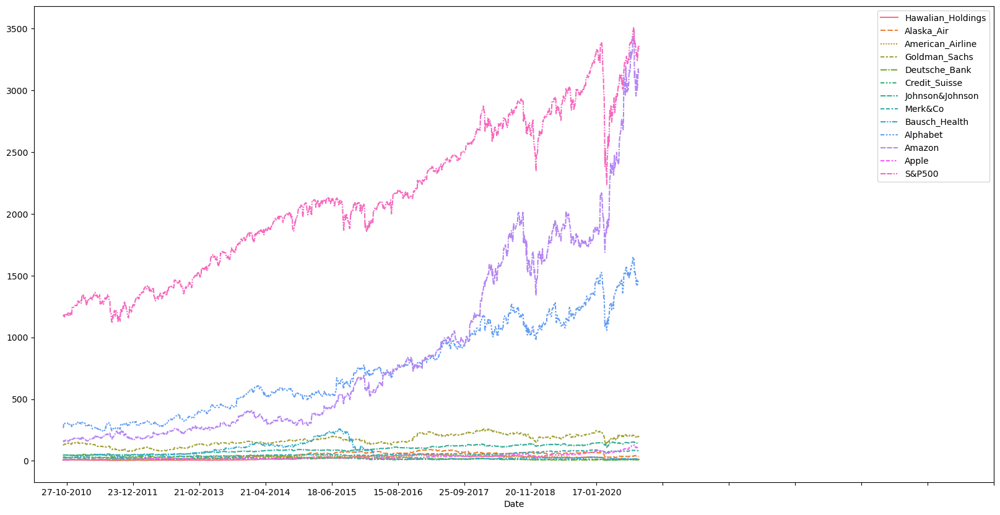

In [38]:
#Overall comparision with SP500 Market and Between Stocks
plt.figure(figsize=(20, 10))
sns.lineplot(data=prices)
plt.xticks(np.arange(10, 2600, step=175))
plt.show()

#### Industry wise Stock Analysis

Text(0.5, 1.0, 'Technology Sector')

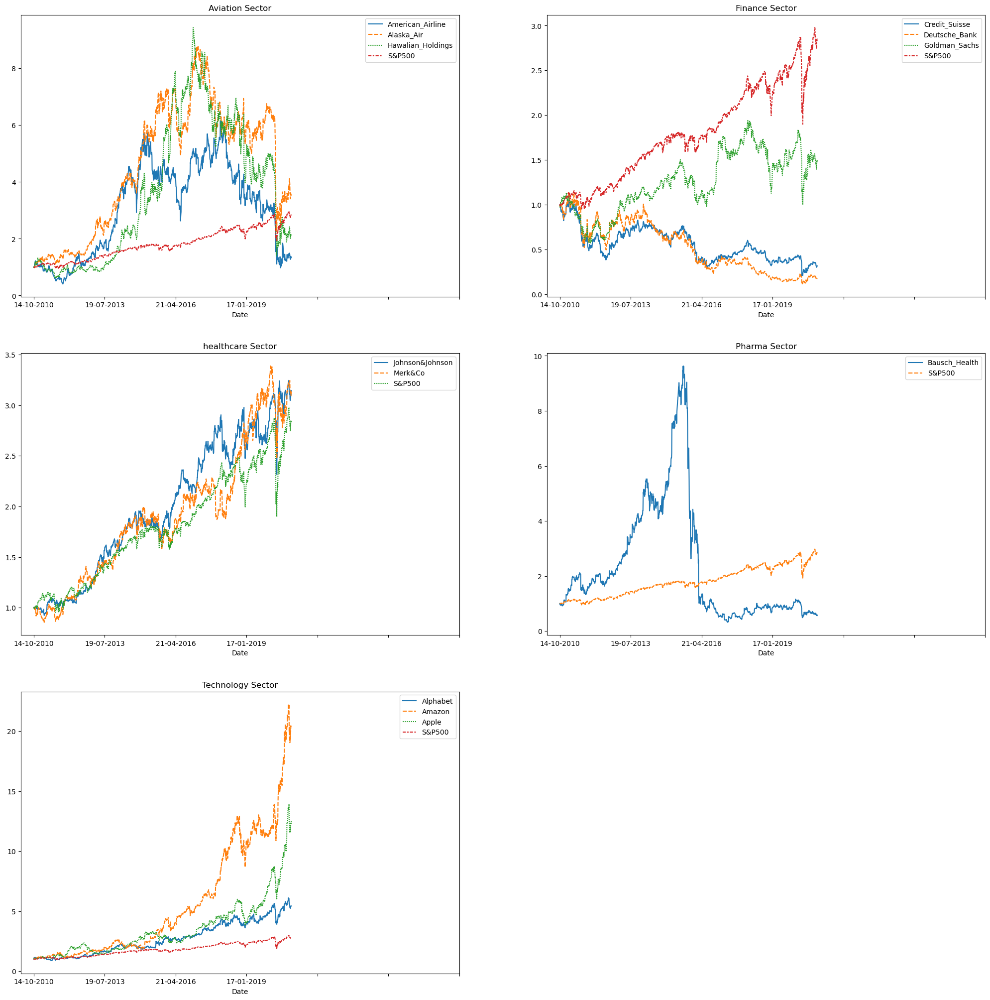

In [233]:
#Industry group or Sector Wise Comparision of Stocks
plt.figure(figsize=(25, 25))
plt.subplot(3, 2, 1)
sns.lineplot(data=normalized_price_df[['American_Airline', 'Alaska_Air','Hawalian_Holdings','S&P500']])
plt.xticks(np.arange(1, 2518, step=419))
plt.title("Aviation Sector")

plt.subplot(3, 2, 2)
sns.lineplot(data=normalized_price_df[['Credit_Suisse','Deutsche_Bank','Goldman_Sachs','S&P500']])
plt.xticks(np.arange(1, 2518, step=419))
plt.title("Finance Sector")

plt.subplot(3, 2, 3)
sns.lineplot(data=normalized_price_df[['Johnson&Johnson','Merk&Co','S&P500']])
plt.xticks(np.arange(1, 2518, step=419))
plt.title("healthcare Sector")

plt.subplot(3, 2, 4)
sns.lineplot(data=normalized_price_df[['Bausch_Health','S&P500']])
plt.xticks(np.arange(1, 2518, step=419))
plt.title("Pharma Sector")

plt.subplot(3, 2, 5)
sns.lineplot(data=normalized_price_df[['Alphabet', 'Amazon', 'Apple', 'S&P500']])
plt.xticks(np.arange(1, 2518, step=419))
plt.title("Technology Sector")

#### Distribution of Stocks

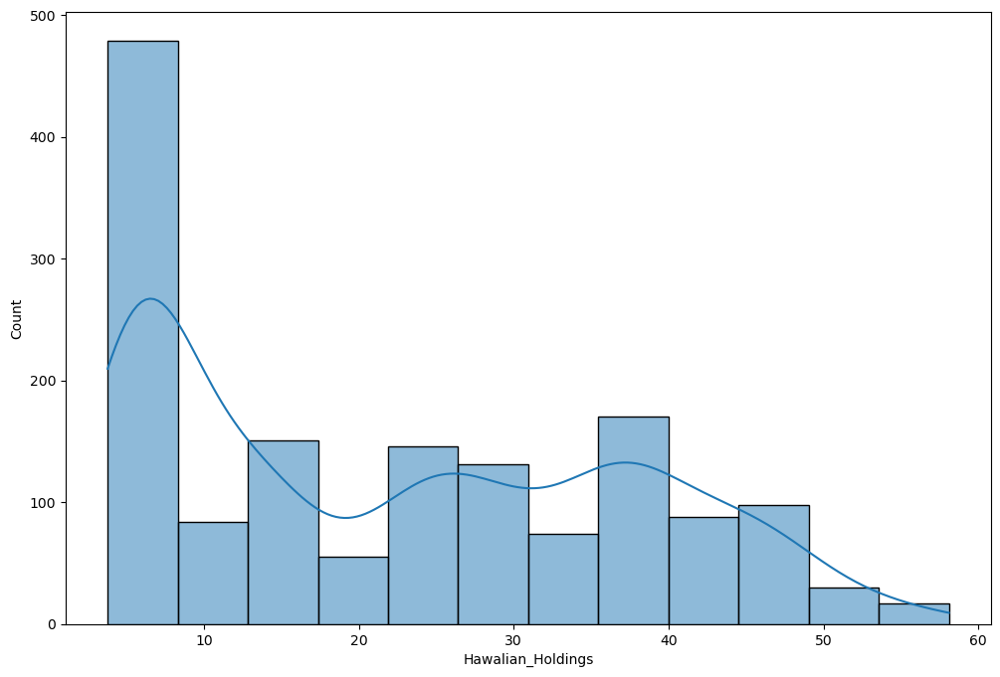

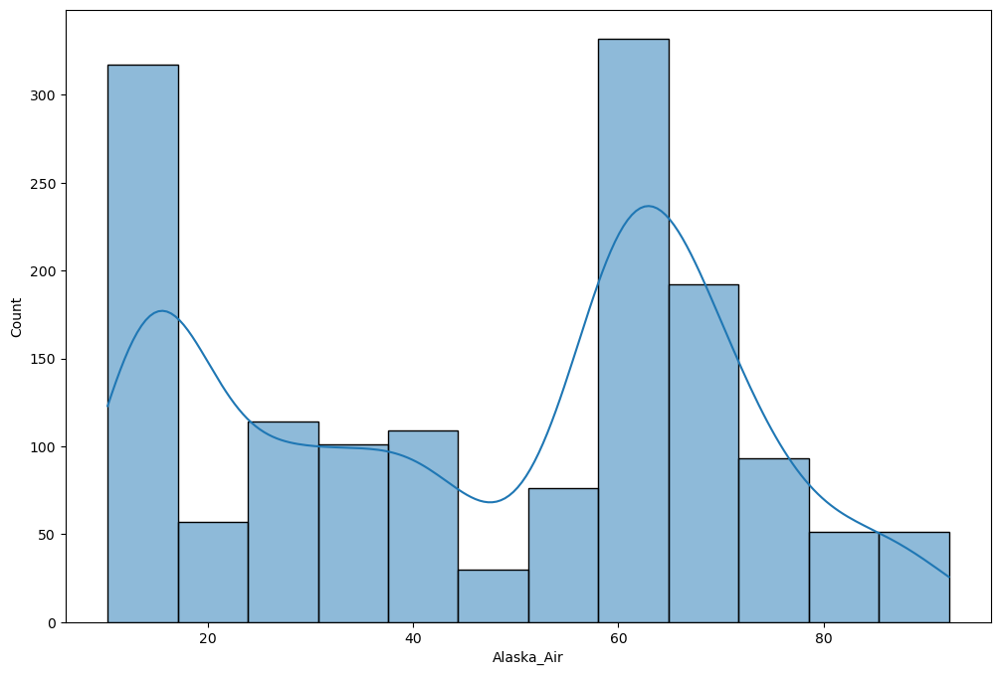

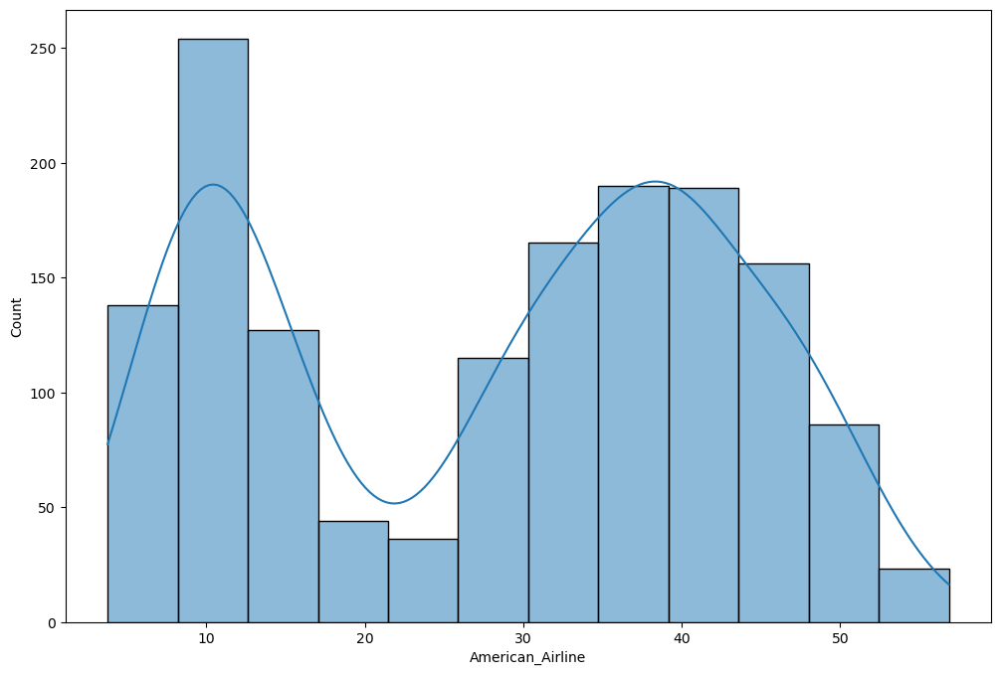

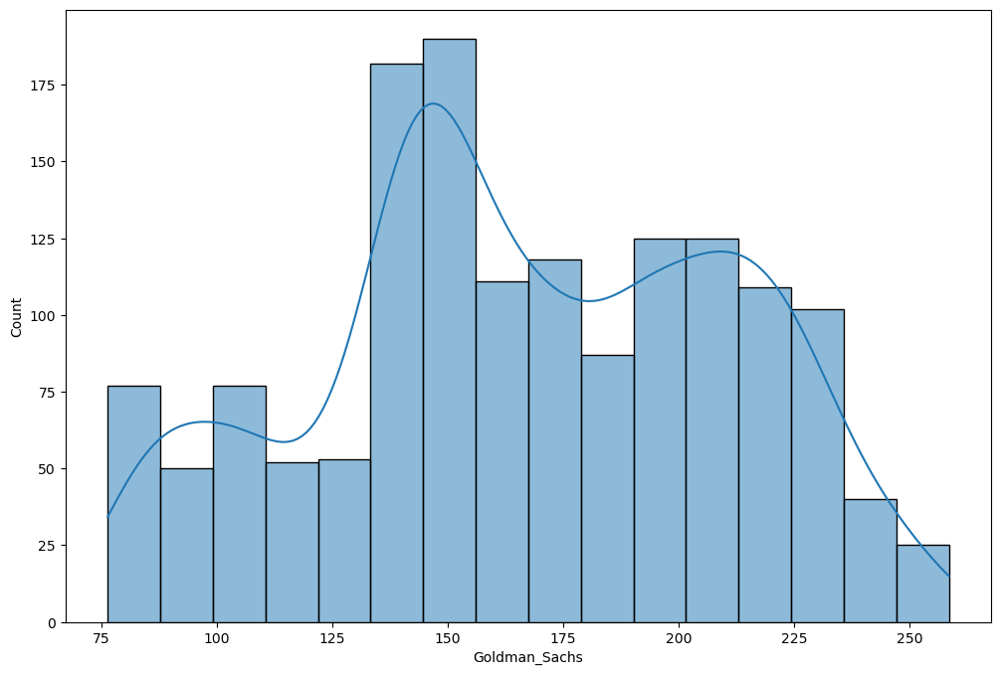

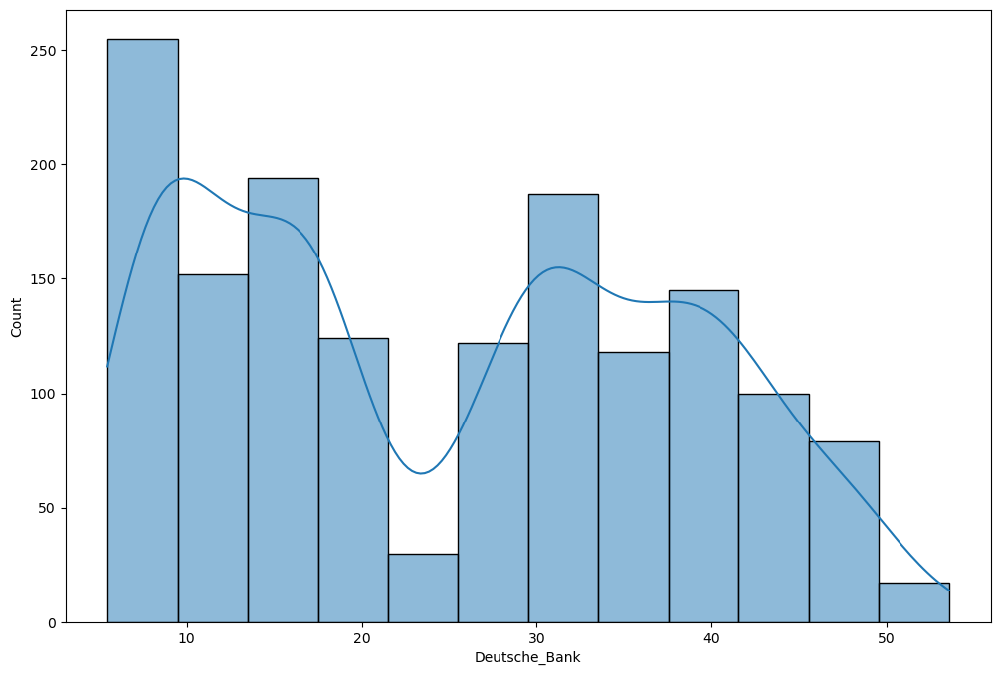

...

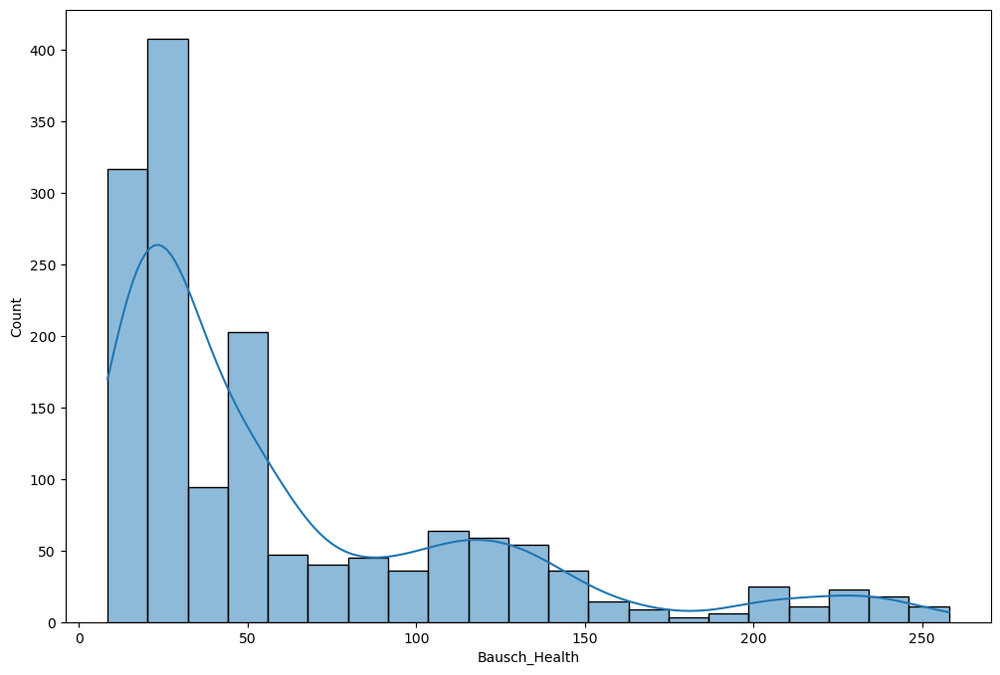

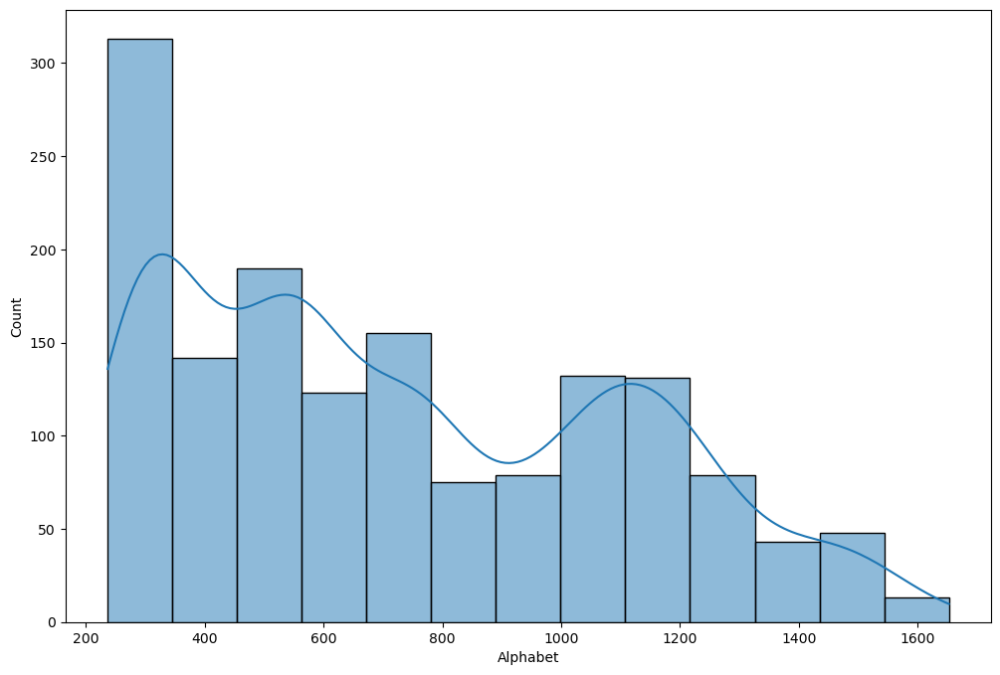

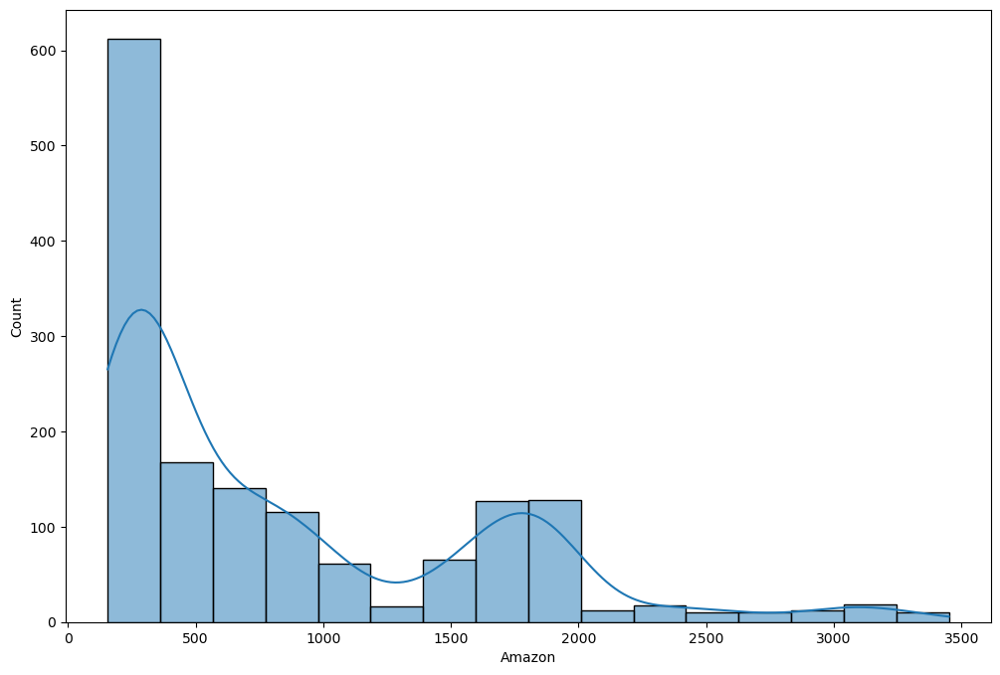

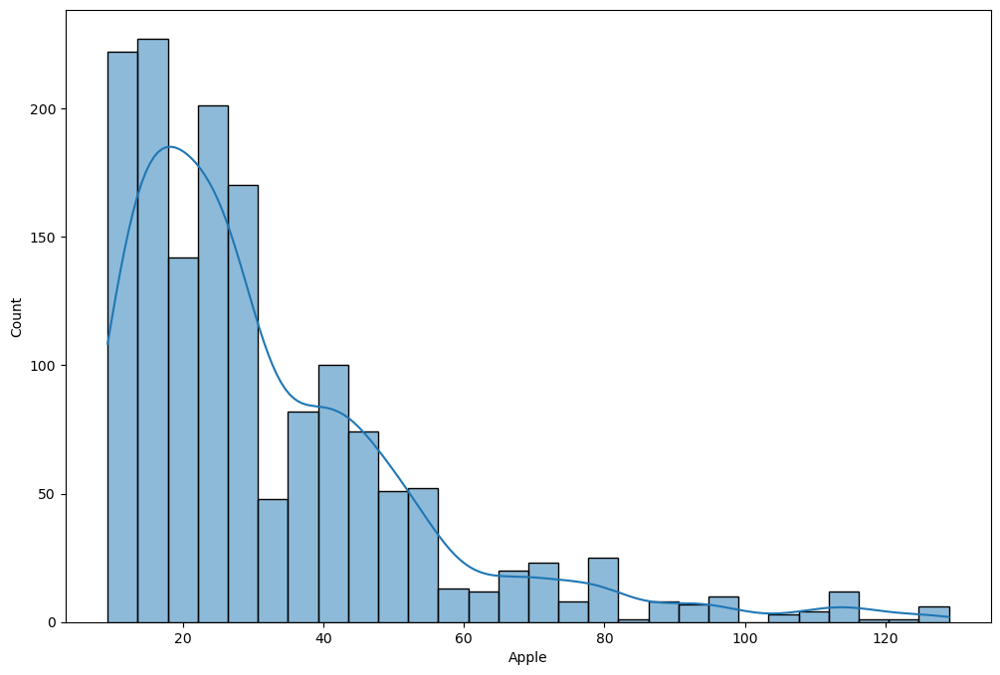

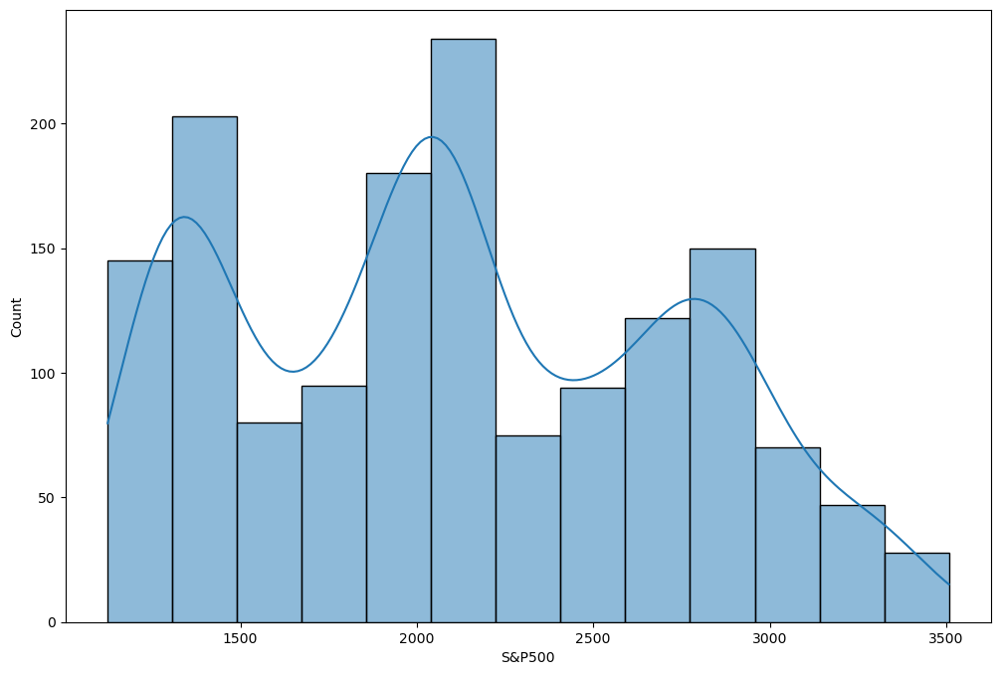

In [234]:
#Distribution of each stock.
list1= normalized_price_df.columns
for i in range(len(list1)):
    plt.figure()
    sns.histplot(data=prices, x=list1[i], kde=True)
    plt.show

### Heatmap

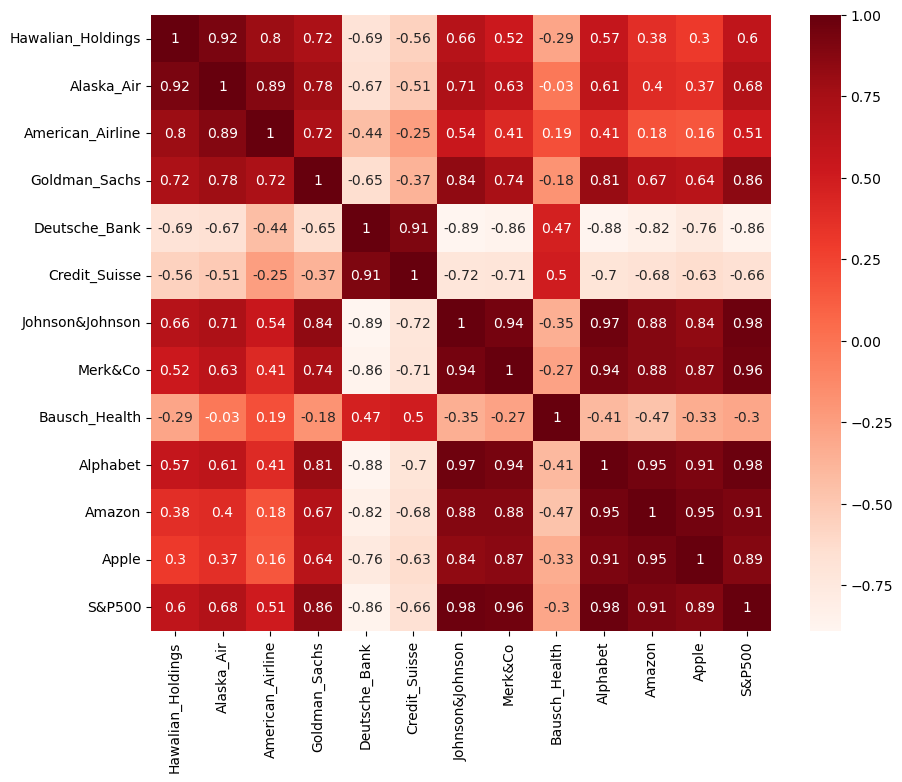

In [235]:
#Overall corelation.

plt.figure(figsize=(10, 8))
sns.heatmap(normalized_price_df.corr(), annot=True, cmap='Reds')
plt.show()

- Hawalian Holdings is highly correlated with Alaska Air, American Airline, Goldman_Satchs & Deutsche Bank
- Alaska Air highly correlated with  American Airline, Goldman_Satchs & Deutsche Bank
- Goldman_Sachs, DeutscheBank, Johnson&Johnson, Merk&&Co, Alphabet, Amazon, Apple & Credit_Suisse were highly correlated with market S&P500
- Johnson&Johnson highly correlated with Merk&Co, Alphabet, Amazon, Apple, Deutsche Bank, Goldman_Sachs, Alaska Air etc.

In [236]:
#Creating Sector wise datasets
aviation = normalized_price_df[['Hawalian_Holdings', 'Alaska_Air', 'American_Airline','S&P500']]
finance = normalized_price_df[['Goldman_Sachs','Deutsche_Bank', 'Credit_Suisse','S&P500']]
healthcare = normalized_price_df[['Johnson&Johnson', 'Merk&Co','S&P500']]
pharma = normalized_price_df[['Bausch_Health','S&P500']]
technology =normalized_price_df[['Alphabet', 'Amazon', 'Apple','S&P500']]

Text(0.5, 1.0, 'Technology Sector')

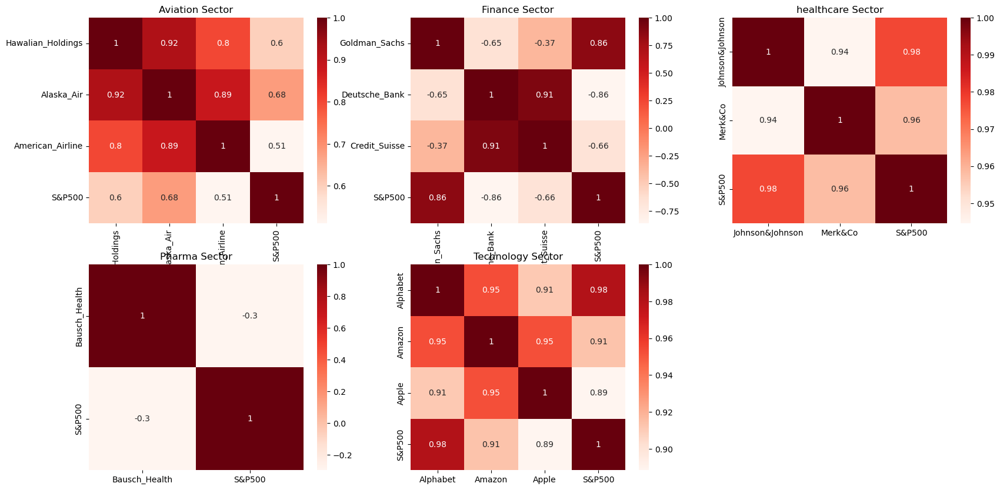

In [237]:
#Checking the correlation of stocks sector wise and finding the best stocks that have a positive corelation with Market SP500.
plt.figure(figsize=(20, 10))
plt.subplot(2, 3, 1)
sns.heatmap(aviation.corr(), annot=True, cmap='Reds')
plt.title("Aviation Sector")

plt.subplot(2, 3, 2)
sns.heatmap(finance.corr(), annot=True, cmap='Reds')
plt.title("Finance Sector")

plt.subplot(2, 3, 3)
sns.heatmap(healthcare.corr(), annot=True, cmap='Reds')
plt.title("healthcare Sector")

plt.subplot(2, 3, 4)
sns.heatmap(pharma.corr(), annot=True, cmap='Reds')
plt.title("Pharma Sector")

plt.subplot(2, 3, 5)
sns.heatmap(technology.corr(), annot=True, cmap='Reds')
plt.title("Technology Sector")


Text(0.5, 1.0, 'Technology Sector')

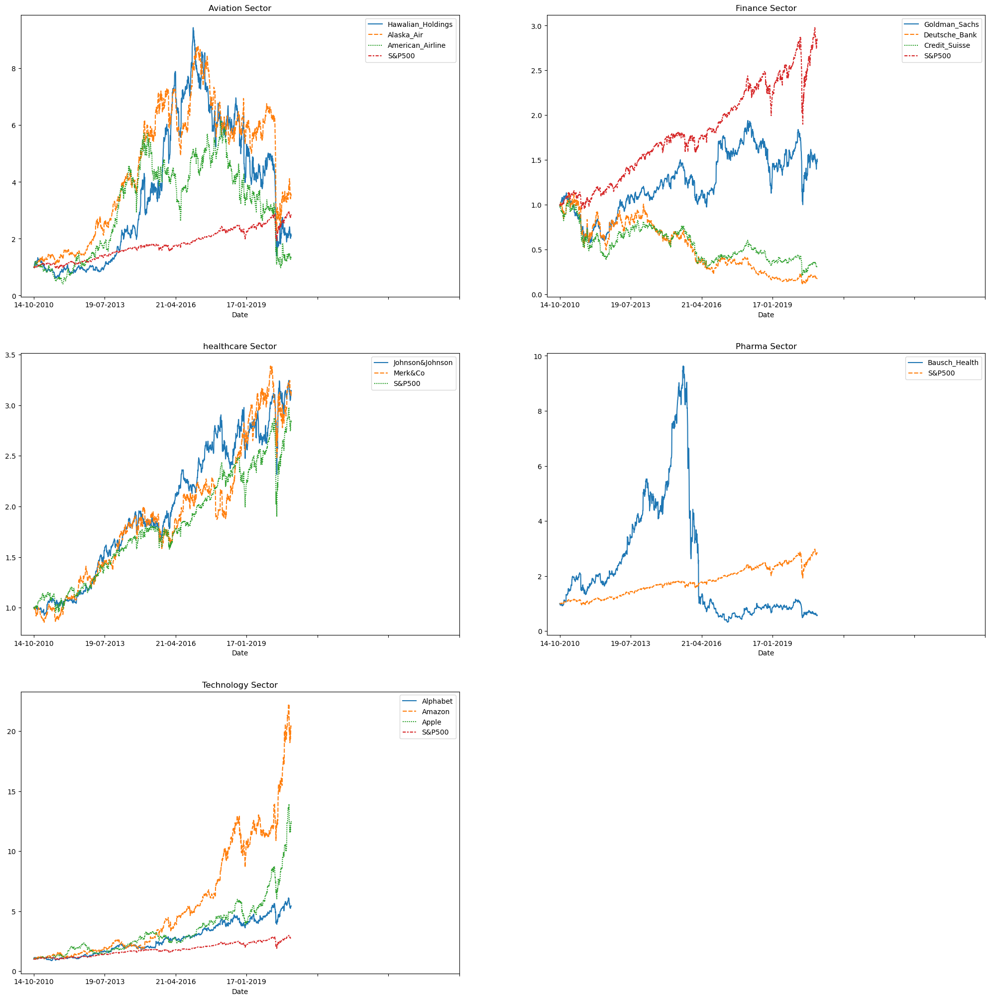

In [238]:
#Industry group or Sector Wise Comparision of Stocks
plt.figure(figsize=(25, 25))
plt.subplot(3, 2, 1)
sns.lineplot(data=aviation)
plt.xticks(np.arange(1, 2518, step=419))
plt.title("Aviation Sector")

plt.subplot(3, 2, 2)
sns.lineplot(data=finance)
plt.xticks(np.arange(1, 2518, step=419))
plt.title("Finance Sector")

plt.subplot(3, 2, 3)
sns.lineplot(data=healthcare)
plt.xticks(np.arange(1, 2518, step=419))
plt.title("healthcare Sector")

plt.subplot(3, 2, 4)
sns.lineplot(data=pharma)
plt.xticks(np.arange(1, 2518, step=419))
plt.title("Pharma Sector")

plt.subplot(3, 2, 5)
sns.lineplot(data=technology)
plt.xticks(np.arange(1, 2518, step=419))
plt.title("Technology Sector")

- Aviation Sector- This sector has given good returns but has been declining from past few years. We will not select stock from it.
- Finance Sector- Only Goldman Sachs has given stocks comparable to market returns. Other finance stocks have declined over the period.
- Healthcare Sector- Merk&Co and Johnson&Johnson have very good returne when compard with SP500.
- Pharma Sector- Bausch Health does not have good returns.
- Technology Sector- Apple, Amazon, Alphabet all 3 stocks have out performed the market returns by huge margin.

## Stationarity Tests

In [54]:
# 

# for col in prices.columns:
#     kpss_test = kpss(prices[col])
#     adf = adfuller(prices[col])
#     print(col)
#     print("kpss statistic:%f"% kpss_test[0])
#     print("critical_values @ 5%%:%.2f"% kpss_test[3]["5%"])
#     print("p-value:",kpss_test[1])

#     print("#"*10)
#     print("adf statistic:%f"% adf[0])
#     print("critical_values @ 5%%: %.2f"% adf[4]["5%"])
#     print("p-value: %.2f"% adf[1])
#     print("*"*10)
#     if kpss_test[1]<0.05:
#         print(f"{col} is non-stationary using kpss-test")
#     else:
#         print(f"{col} is stationary using kpss-test")
#     if adf[1]<0.05:
#         print(f"{col} is stationary using adf-test")
#     else:
#         print(f"{col} is non-stationary using adf-test")
#     print("="*60)

- all the features in the data set were non-stationary

### Stock-Price Dispersion from Mean

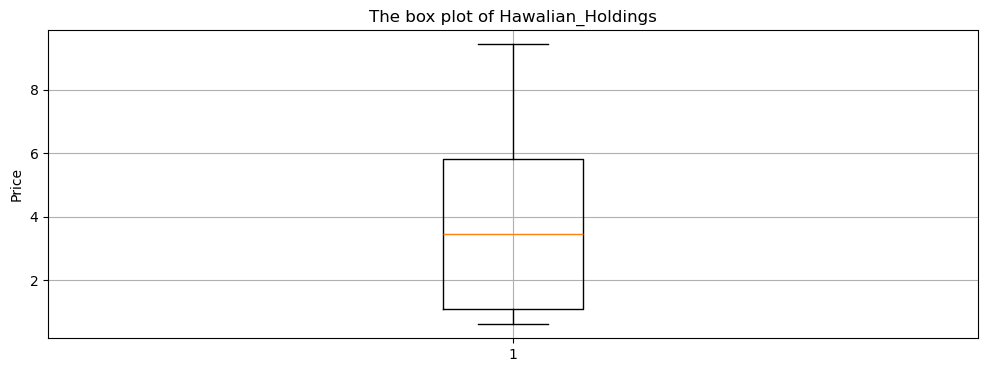

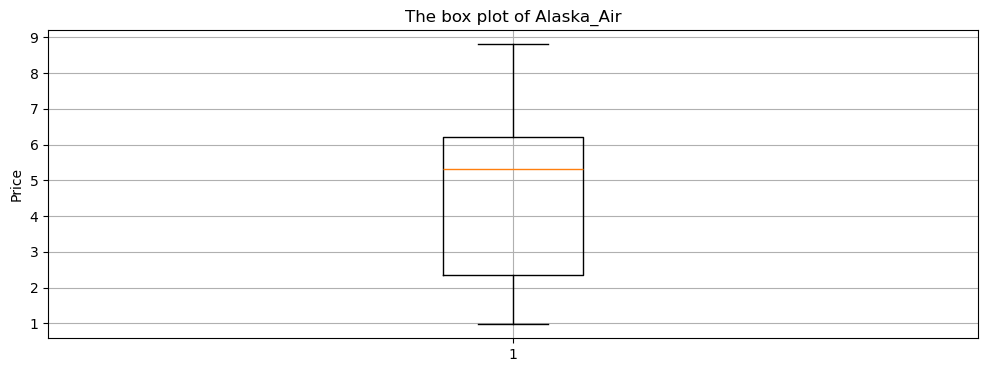

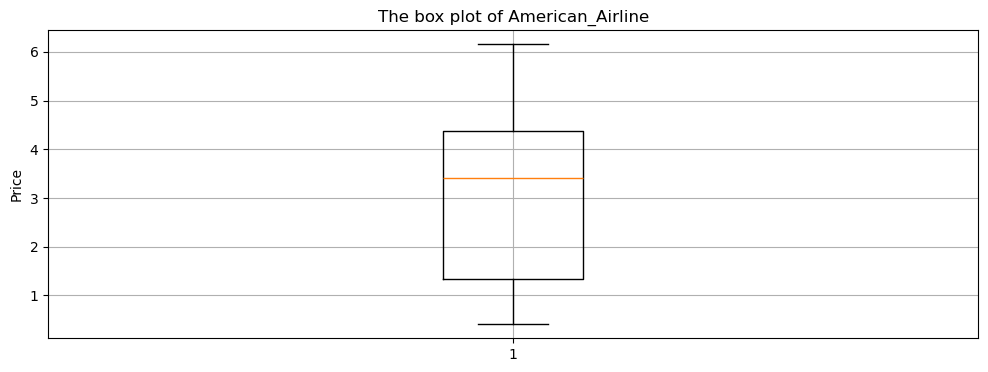

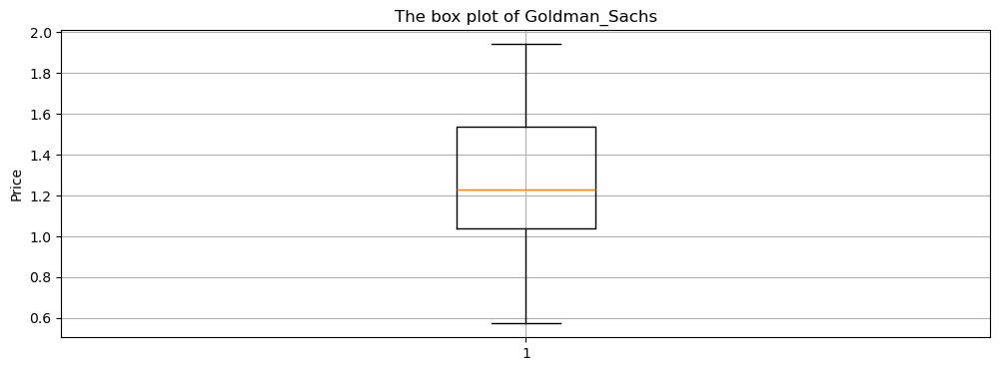

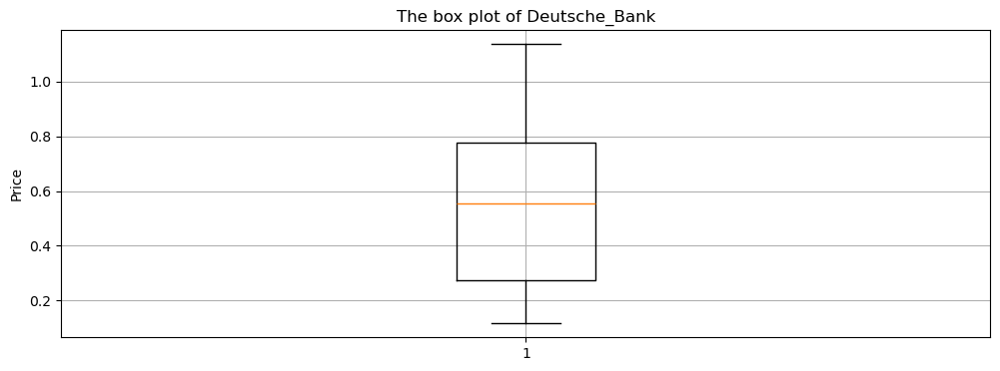

...

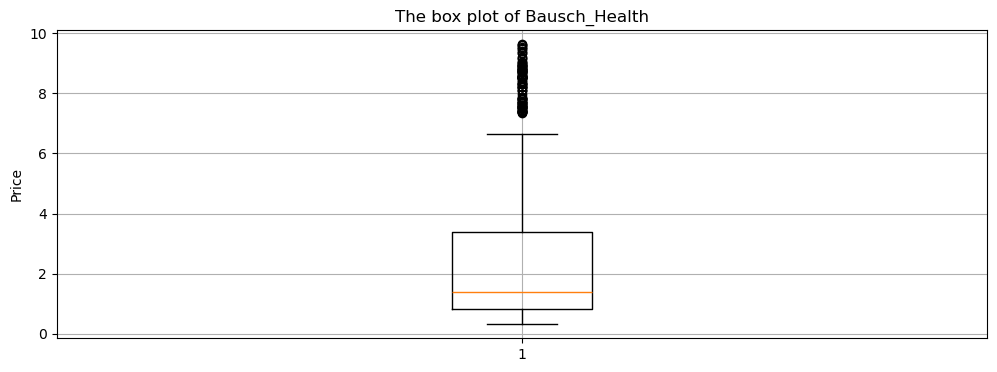

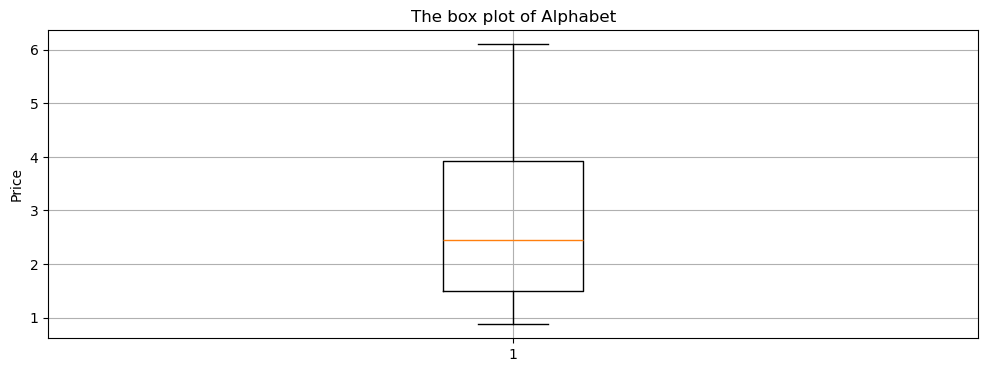

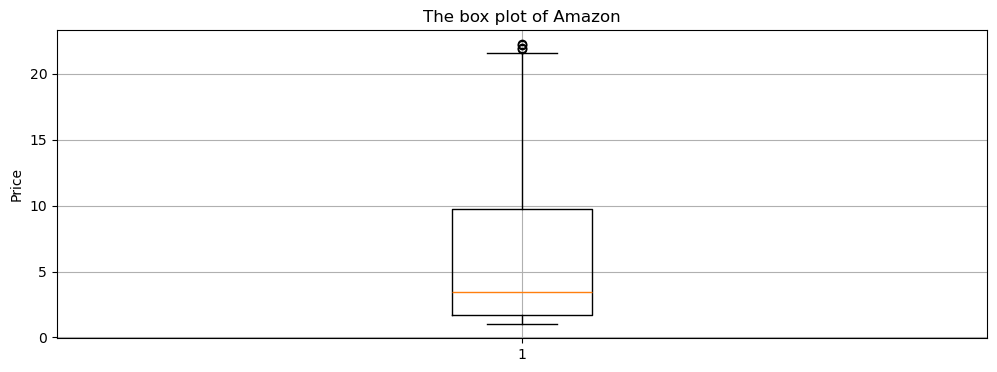

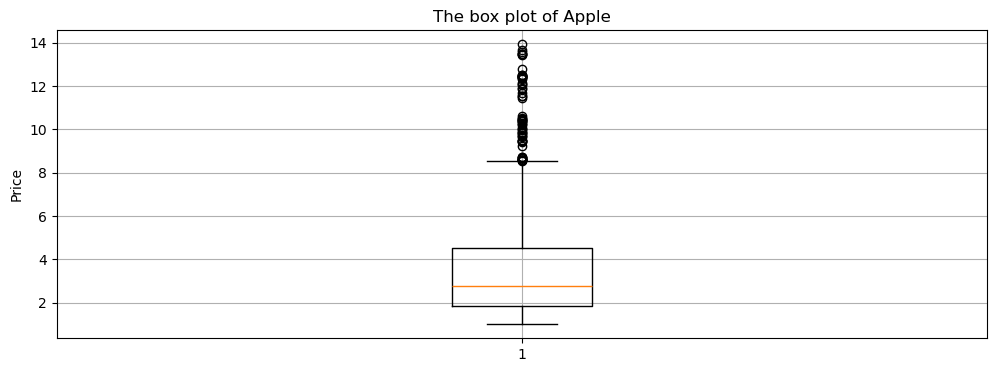

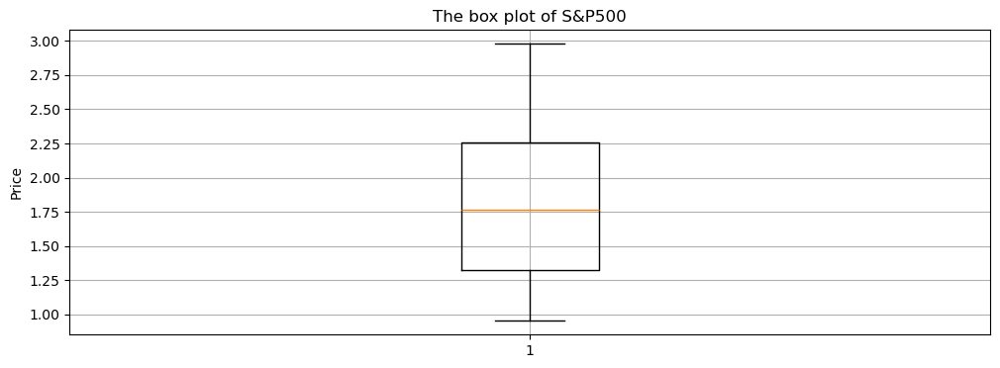

In [239]:
for col in normalized_price_df.columns:
    plt.figure(figsize=(12,4))
    plt.boxplot(normalized_price_df[col])
    plt.title(f"The box plot of {col}")
    plt.ylabel("Price")
    plt.grid(True)
    plt.show()

<Figure size 1200x600 with 0 Axes>

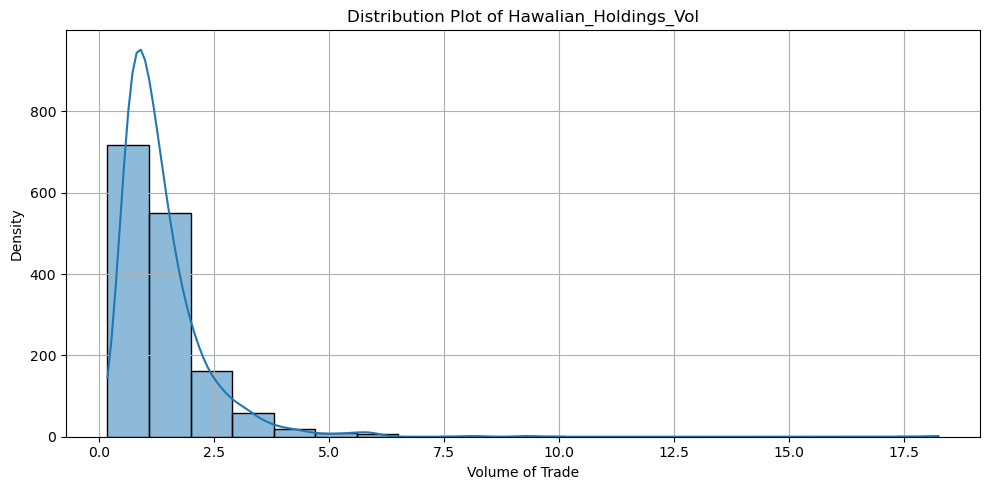

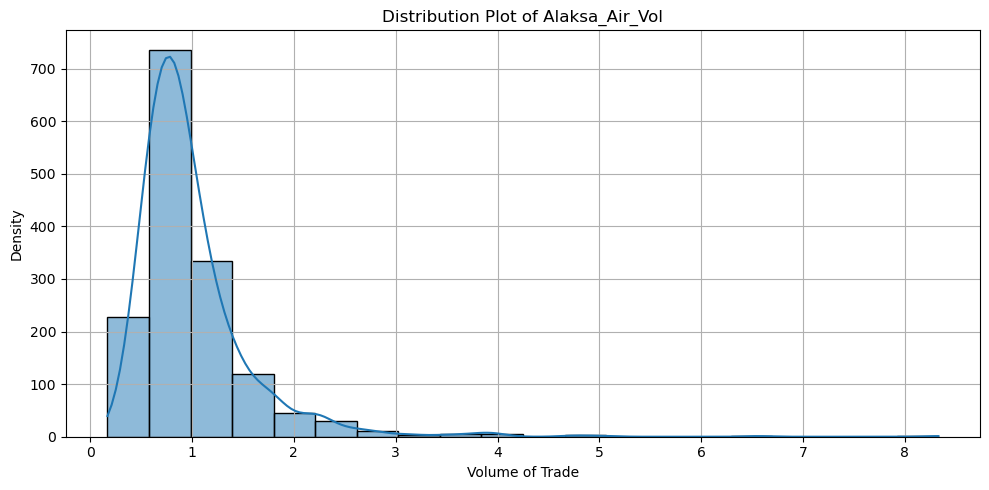

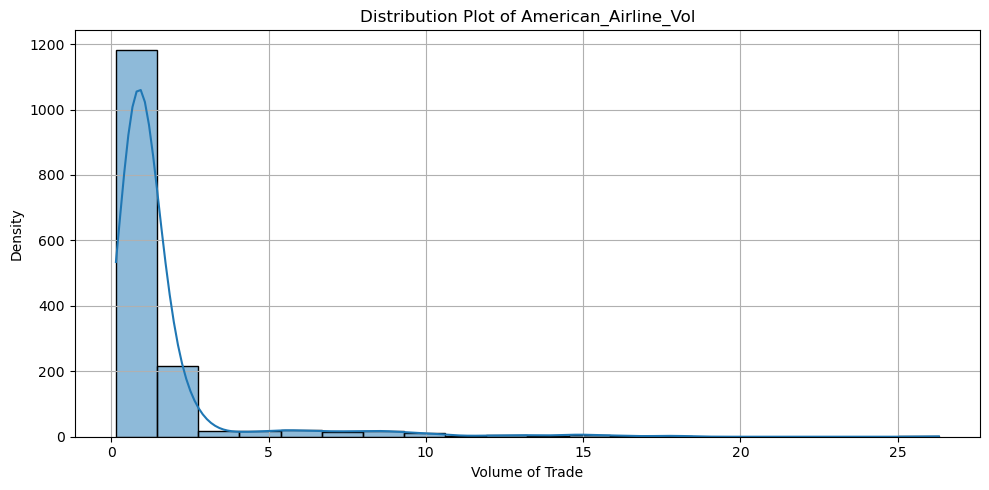

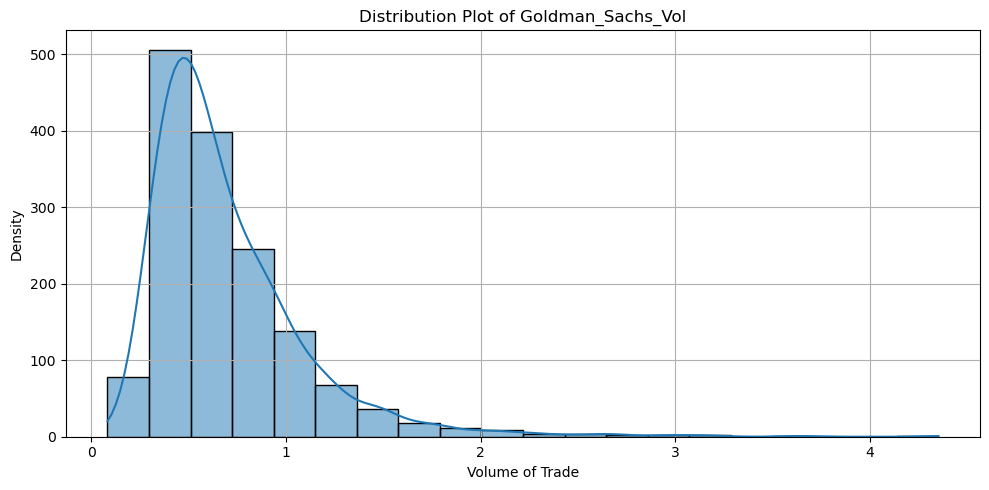

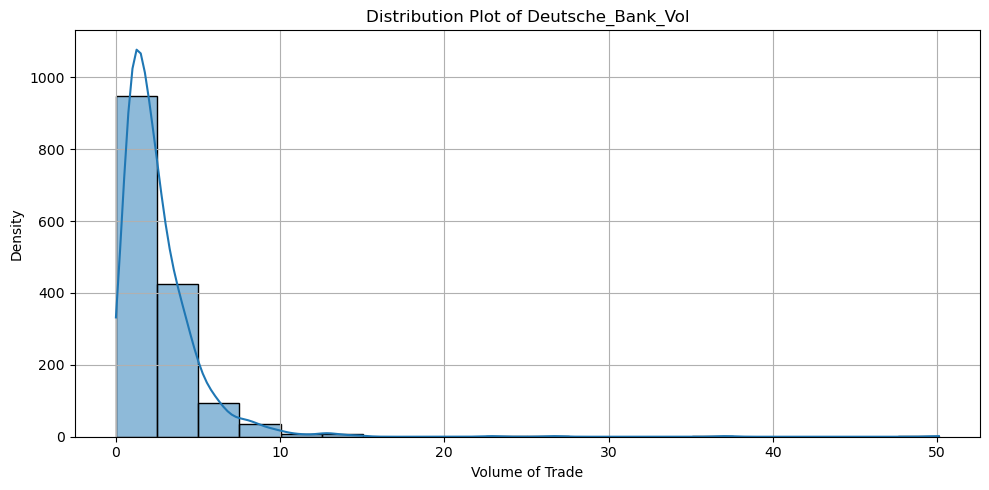

...

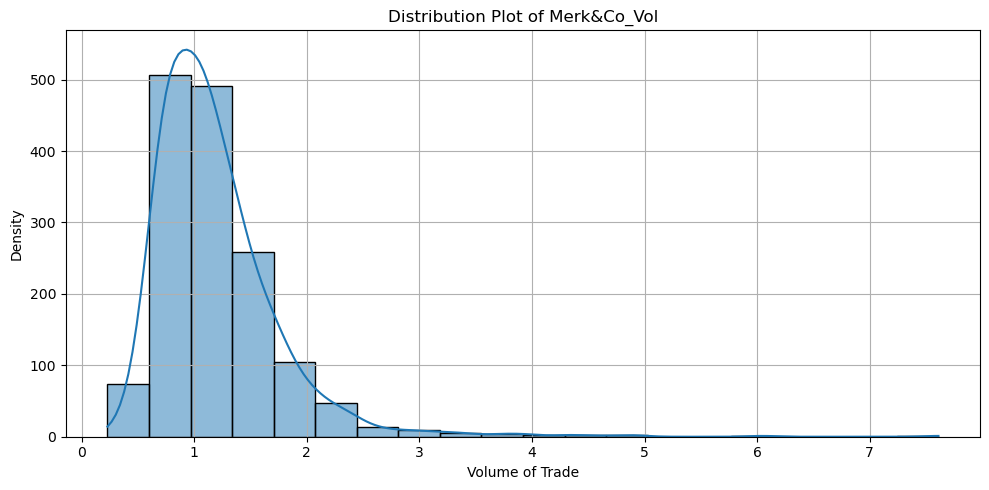

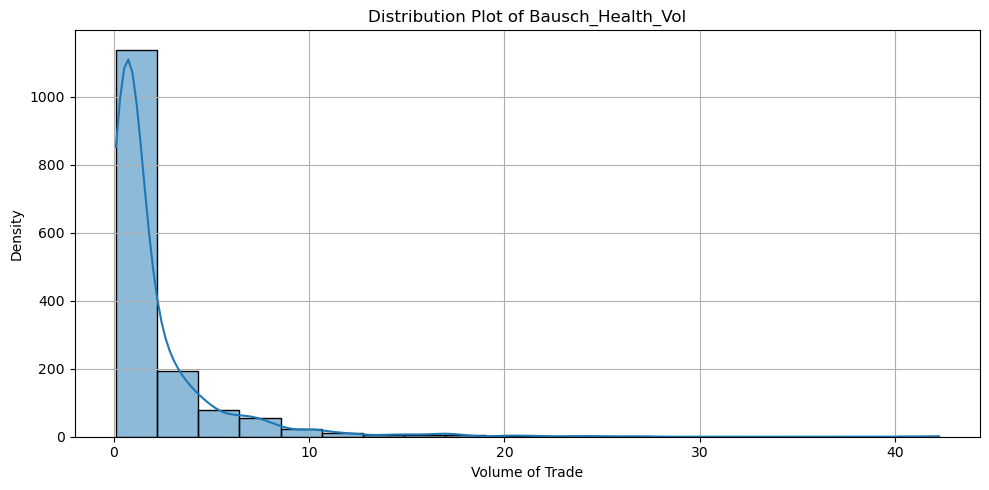

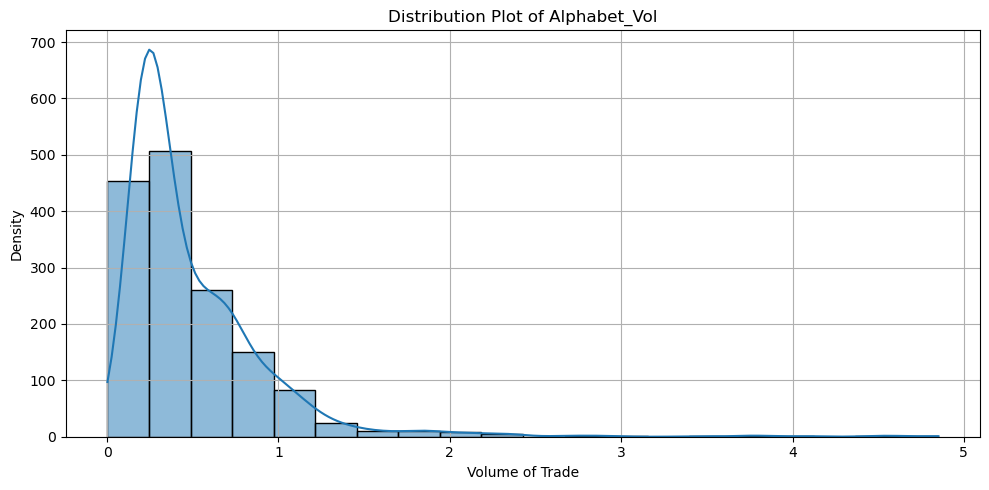

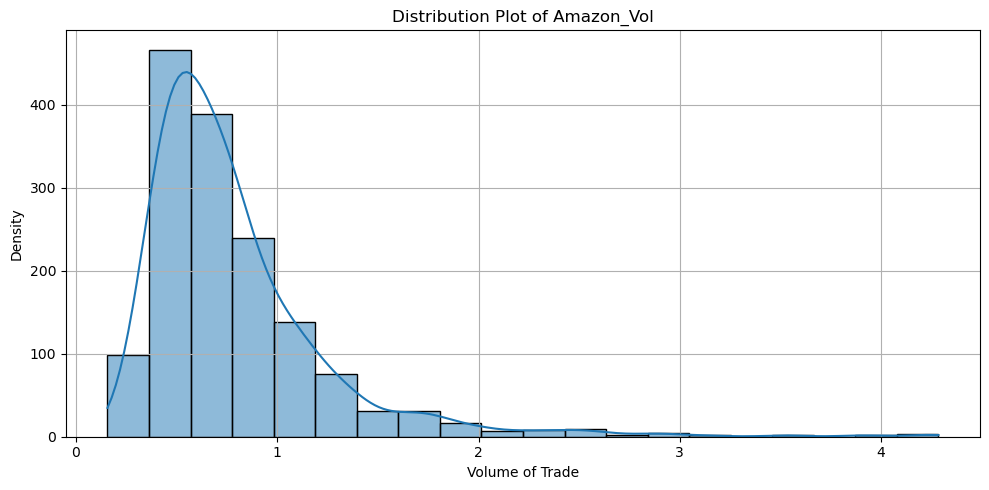

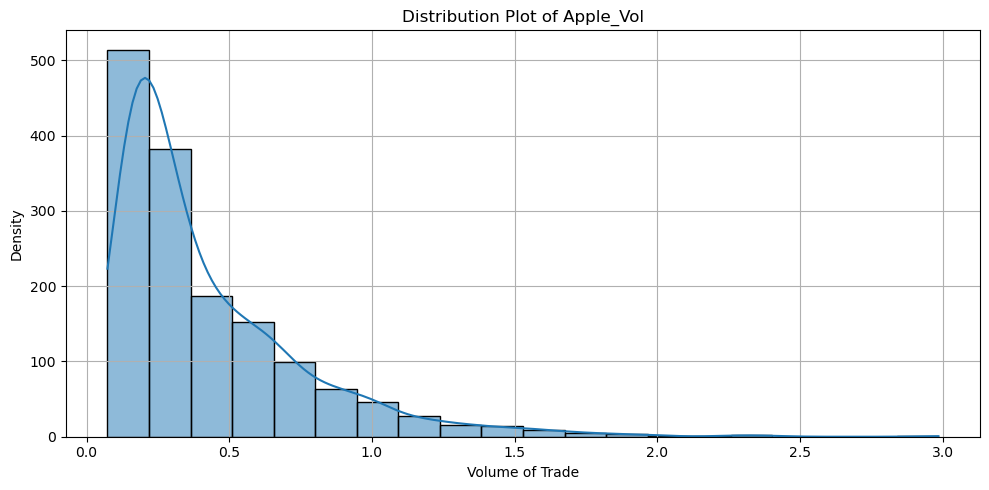

In [240]:
plt.figure(figsize=(12, 6))

for i in normalized_vol_df.columns:
    plt.figure(figsize=(10, 5))
    sns.histplot(normalized_vol_df[i], bins=20, kde=True)
    plt.title(f"Distribution Plot of {i}")
    plt.xlabel("Volume of Trade")
    plt.ylabel("Density")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [55]:
# Replacing the outliers with the median value
# for col in prices.columns:
#     Q1 = prices[col].quantile(0.25)
#     Q3 = prices[col].quantile(0.75)
#     IQR = Q3 - Q1
    
#     col_median = prices[col].median()
    
#     # IQR
#     prices[col] = np.where(prices[col] < (Q1 - 1.5 * IQR), col_median, prices[col])
#     prices[col] = np.where(prices[col] > (Q3 + 1.5 * IQR), col_median, prices[col])

In [46]:
# for col in prices.columns:
#     plt.figure(figsize=(12,4))
#     plt.boxplot(prices[col])
#     plt.title(f"The box plot of {col}")
#     plt.ylabel("Price")
#     plt.grid(True)
#     plt.show()

## Returns of Stocks

In [47]:
# calculating daily returns
returns = prices.pct_change(1)

#dropping rows with missing values
returns = returns.dropna(axis=0)
print(returns.head())

            Hawalian_Holdings  Alaska_Air  American_Airline  Goldman_Sachs  \
Date                                                                         
14-10-2010          -0.010954   -0.003366         -0.002041      -0.020293   
15-10-2010           0.015823   -0.004854         -0.008180      -0.005937   
18-10-2010           0.000000    0.009332          0.043299       0.019974   
19-10-2010          -0.031153   -0.023324         -0.002964       0.019649   
20-10-2010           0.146302    0.063038          0.074331       0.018377   

            Deutsche_Bank  Credit_Suisse  Johnson&Johnson   Merk&Co  \
Date                                                                  
14-10-2010      -0.003812      -0.008889         0.002517 -0.000269   
15-10-2010      -0.014263      -0.017040        -0.002667 -0.005384   
18-10-2010       0.030527       0.028285         0.004562  0.007578   
19-10-2010      -0.014383      -0.013975        -0.008926 -0.019071   
20-10-2010       0.026060  

In [48]:
returns.columns = ["Hawalian_Holdings","Alaska_Air","American_Airlines",
                   "Goldman_Sachs","Deutsche_Bank","Credit Suisse",
                   "Johnson&Johnson","Merk&Co","Bausch_Health",
                   "Alphabet","Amazon","Apple","S&P500_Index"]

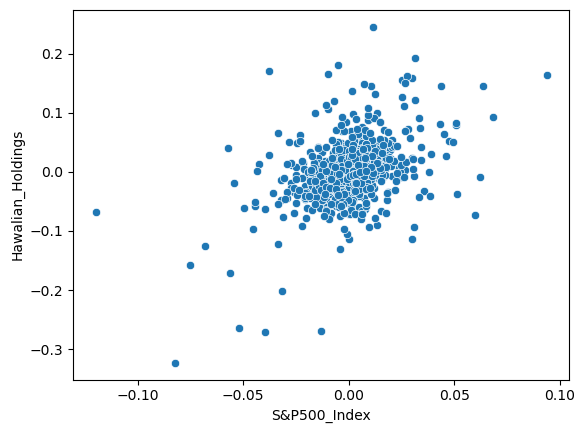

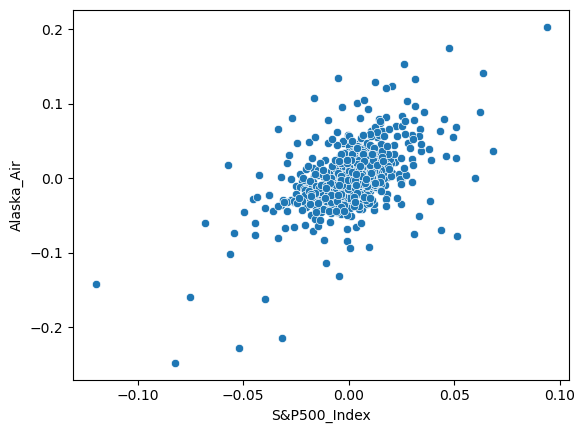

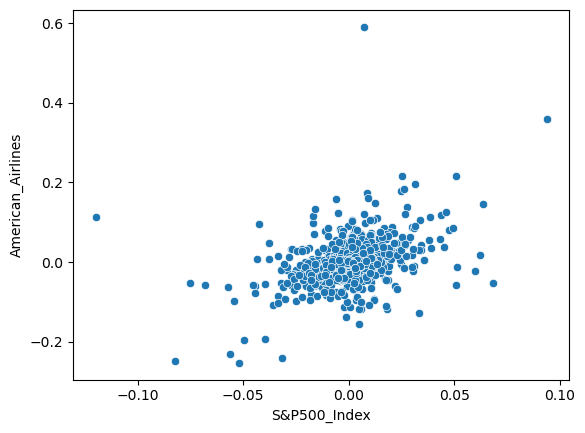

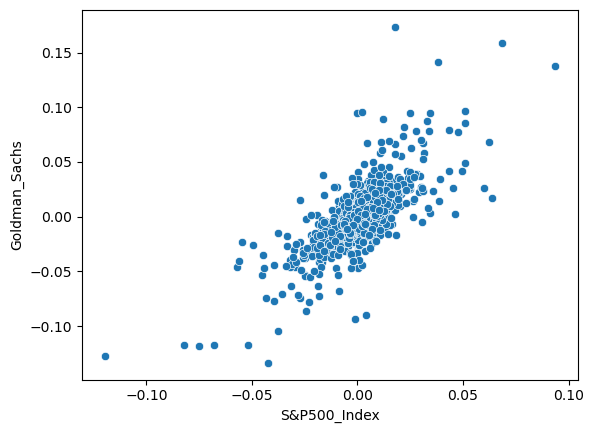

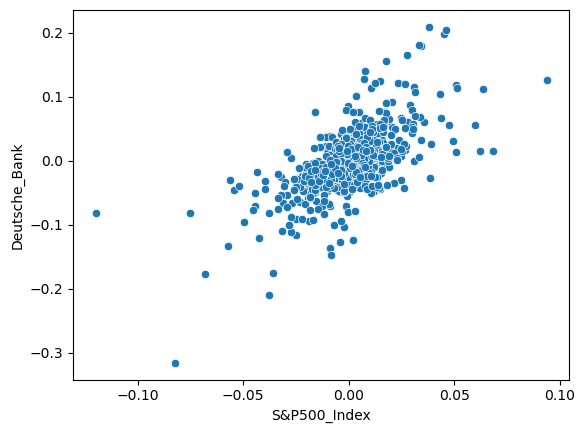

...

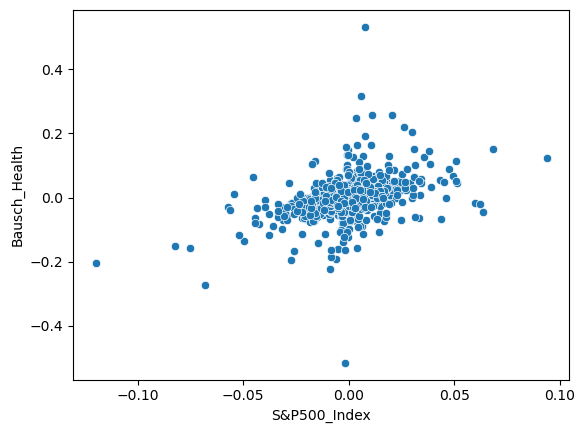

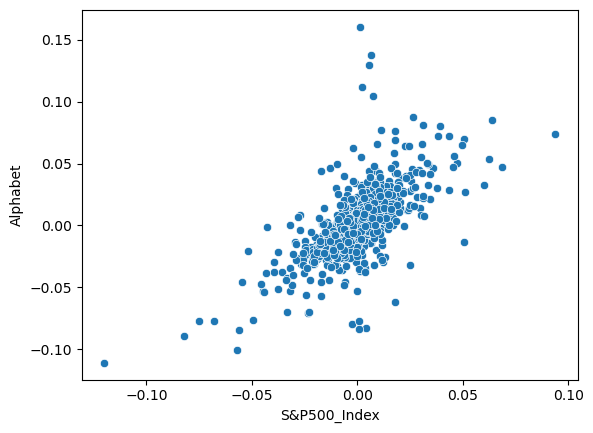

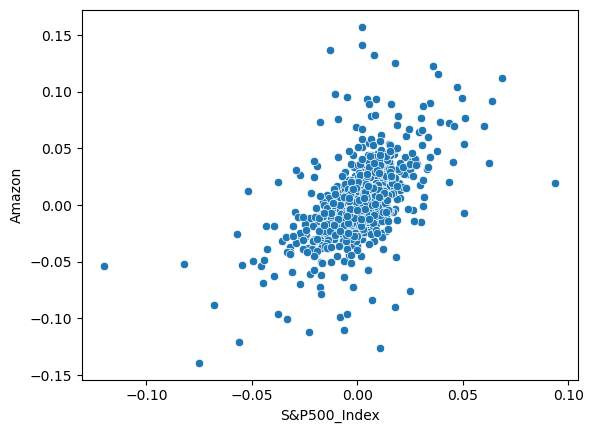

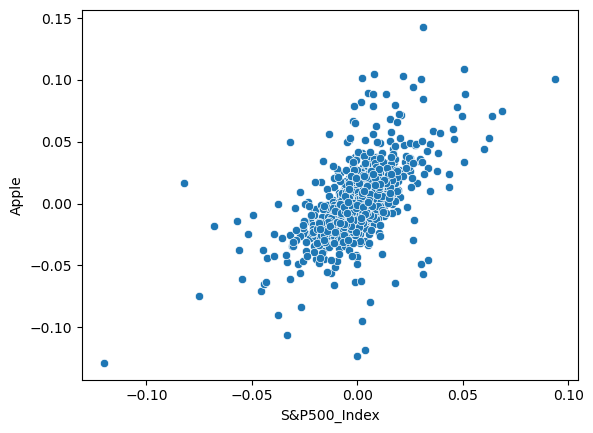

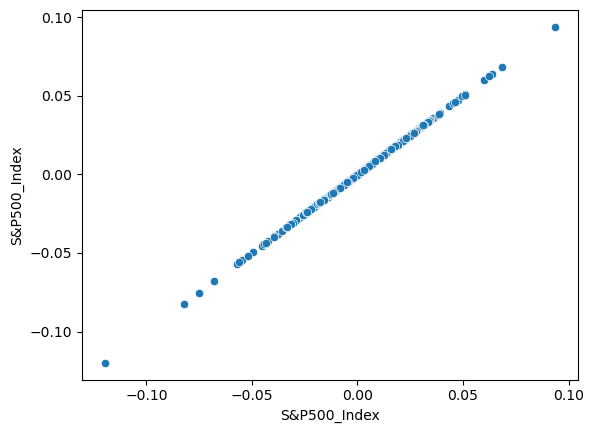

In [49]:
#Checking distribution of stock returns with SP500, we can see some linear trends.
list2= returns.columns
for i in list2:
    sns.scatterplot(data= returns, x= "S&P500_Index" , y= i)
    plt.show()

- All the stocks and Industries have a positive correlation with the market S&P500_Index
- Technology industry stocks have a high positive correlation with the market

<Figure size 1000x2000 with 0 Axes>

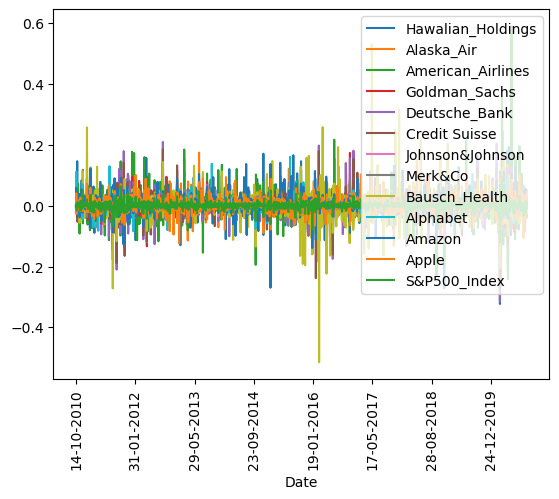

In [50]:
plt.figure(figsize=(10,20))
returns.plot()
plt.xticks(rotation=90)
plt.show()

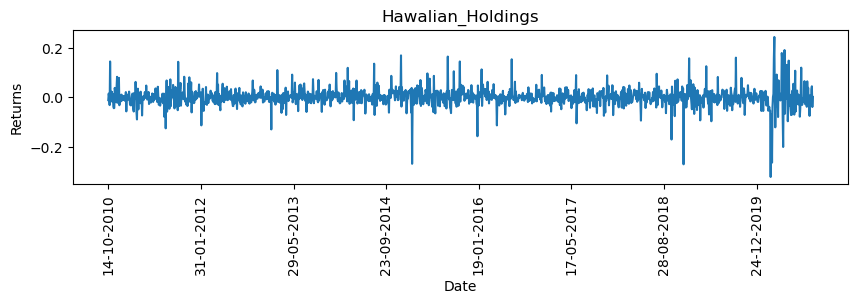

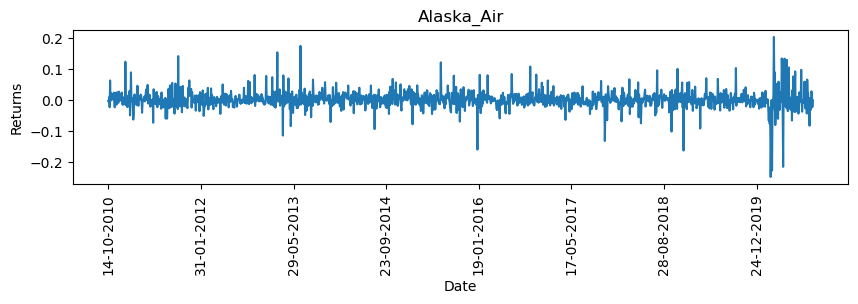

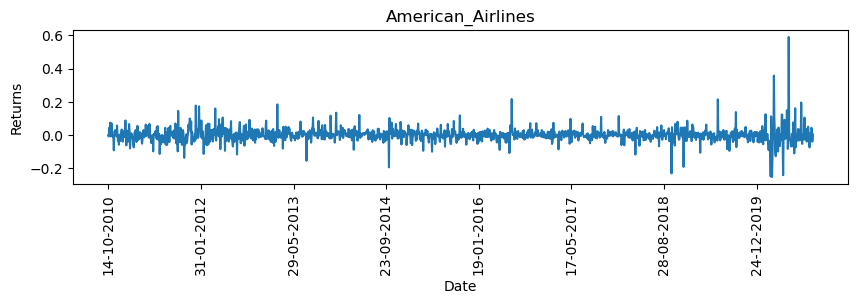

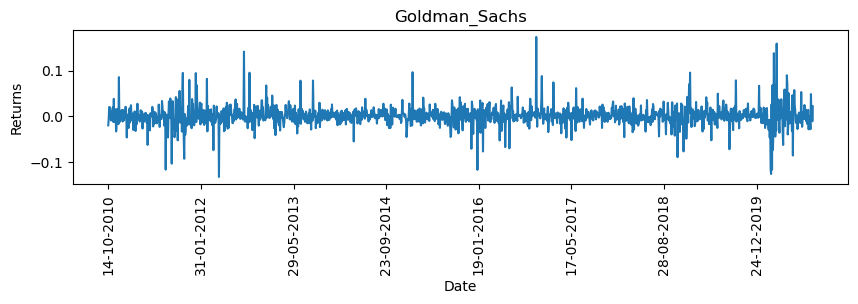

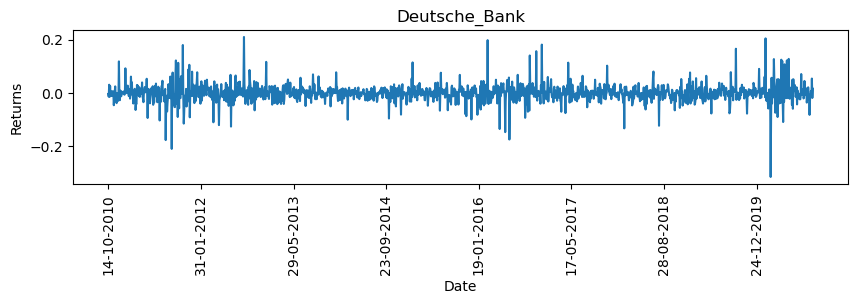

...

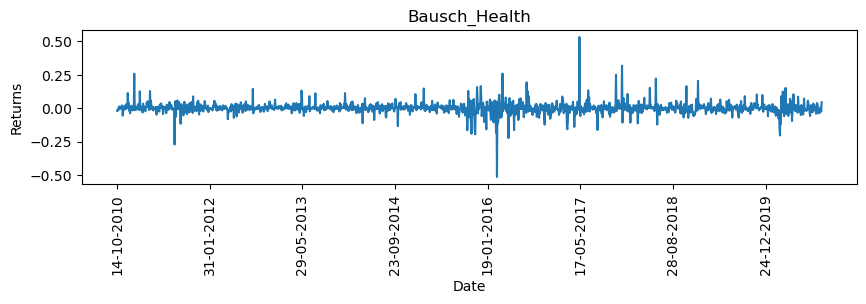

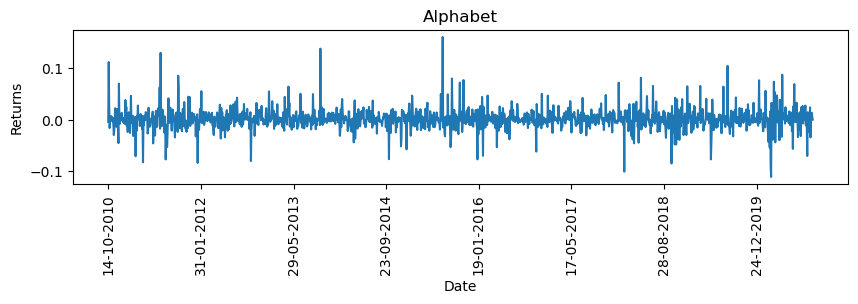

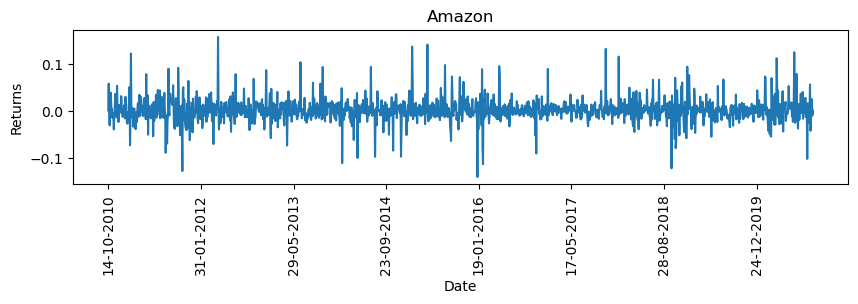

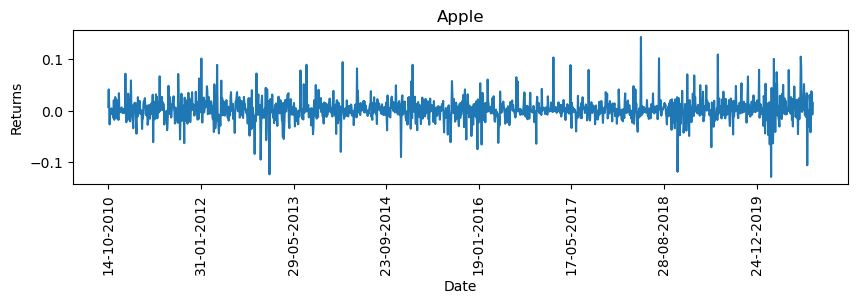

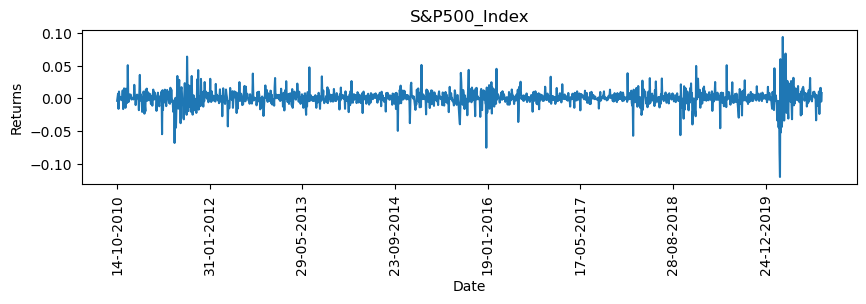

In [51]:
for i in returns.columns:
    plt.figure(figsize=(10,2))
    returns[i].plot()
    plt.title(i)
    plt.ylabel("Returns")
    plt.xticks(rotation=90)
    plt.show()

### Stationarity test for return series

In [53]:
from statsmodels.tsa.stattools import adfuller,kpss

for col in returns.columns:
    kpss_test = kpss(returns[col])
    adf = adfuller(returns[col])
    print(col)
    print("kpss statistic:%f"% kpss_test[0])
    print("critical_values @ 5%%:%.2f"% kpss_test[3]["5%"])
    print("p-value:",kpss_test[1])

    print("#"*10)
    print("adf statistic:%f"% adf[0])
    print("critical_values @ 5%%: %.2f"% adf[4]["5%"])
    print("p-value: %.2f"% adf[1])
    print("*"*10)
    if kpss_test[1]<0.05:
        print(f"The returns of {col} is non-stationary using kpss-test")
    else:
        print(f"The returns of {col} is stationary using kpss-test")
    if adf[1]<0.05:
        print(f"The returns of {col} is stationary using adf-test")
    else:
        print(f"The returns of {col} is non-stationary using adf-test")
    print("="*60)

C:\Users\josev\AppData\Local\Temp\ipykernel_21736\1711993379.py:4: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_test = kpss(returns[col])
C:\Users\josev\AppData\Local\Temp\ipykernel_21736\1711993379.py:4: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_test = kpss(returns[col])
C:\Users\josev\AppData\Local\Temp\ipykernel_21736\1711993379.py:4: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_test = kpss(returns[col])
C:\Users\josev\AppData\Local\Temp\ipykernel_21736\1711993379.py:4: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is g

Hawalian_Holdings
kpss statistic:0.250770
critical_values @ 5%:0.46
p-value: 0.1
##########
adf statistic:-8.422053
critical_values @ 5%: -2.86
p-value: 0.00
**********
The returns of Hawalian_Holdings is stationary using kpss-test
The returns of Hawalian_Holdings is stationary using adf-test
Alaska_Air
kpss statistic:0.372733
critical_values @ 5%:0.46
p-value: 0.08890802238769459
##########
adf statistic:-26.104072
critical_values @ 5%: -2.86
p-value: 0.00
**********
The returns of Alaska_Air is stationary using kpss-test
The returns of Alaska_Air is stationary using adf-test
American_Airlines
kpss statistic:0.266099
critical_values @ 5%:0.46
p-value: 0.1
##########
adf statistic:-12.920322
critical_values @ 5%: -2.86
p-value: 0.00
**********
The returns of American_Airlines is stationary using kpss-test
The returns of American_Airlines is stationary using adf-test
Goldman_Sachs
kpss statistic:0.045178
critical_values @ 5%:0.46
p-value: 0.1
##########
adf statistic:-26.004822
critical

C:\Users\josev\AppData\Local\Temp\ipykernel_21736\1711993379.py:4: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_test = kpss(returns[col])
C:\Users\josev\AppData\Local\Temp\ipykernel_21736\1711993379.py:4: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_test = kpss(returns[col])
C:\Users\josev\AppData\Local\Temp\ipykernel_21736\1711993379.py:4: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_test = kpss(returns[col])
C:\Users\josev\AppData\Local\Temp\ipykernel_21736\1711993379.py:4: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is g

### Checking for outliers of retruns series

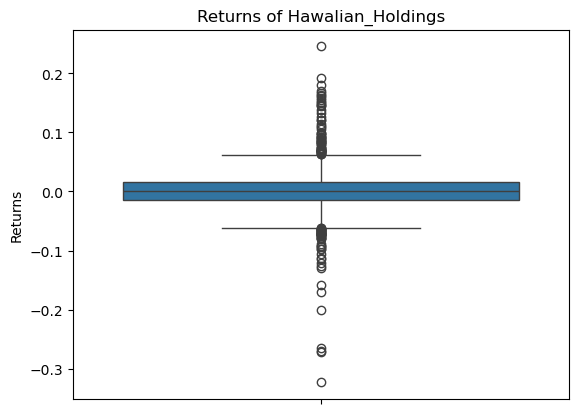

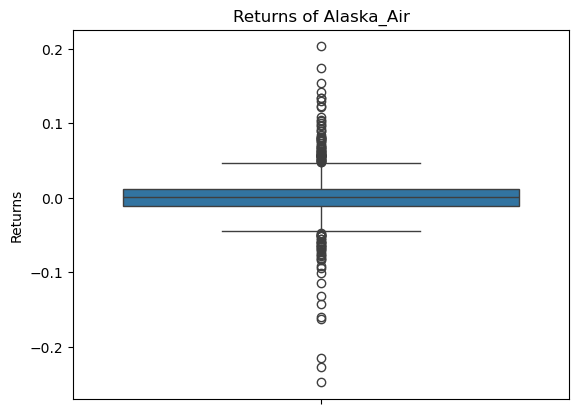

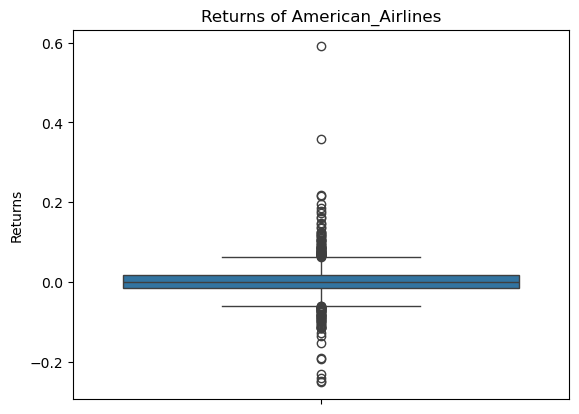

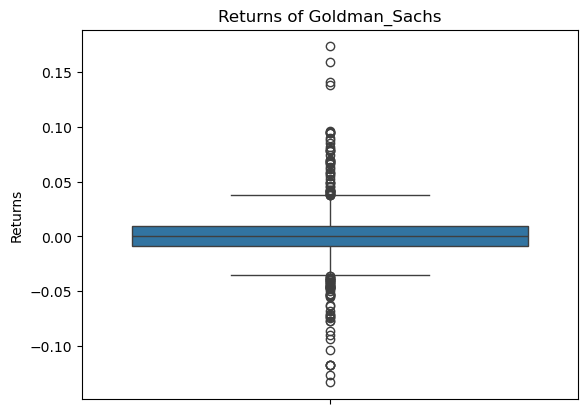

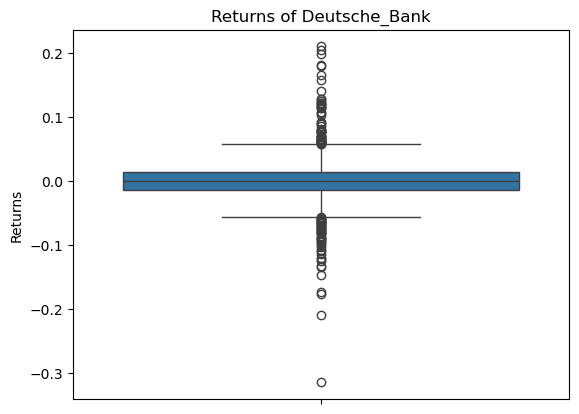

...

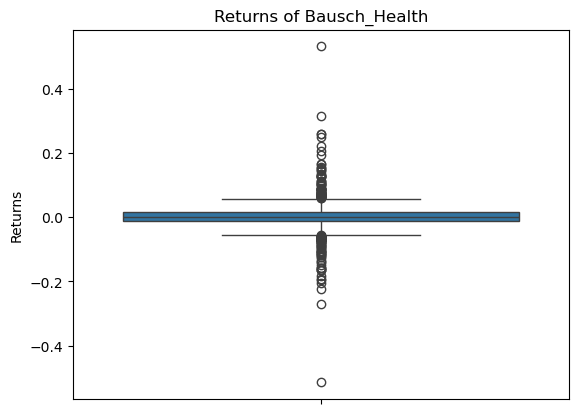

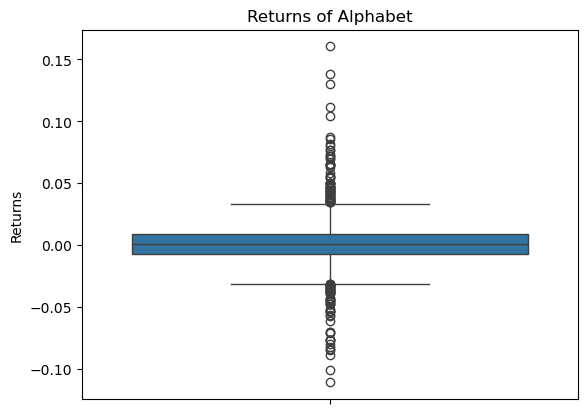

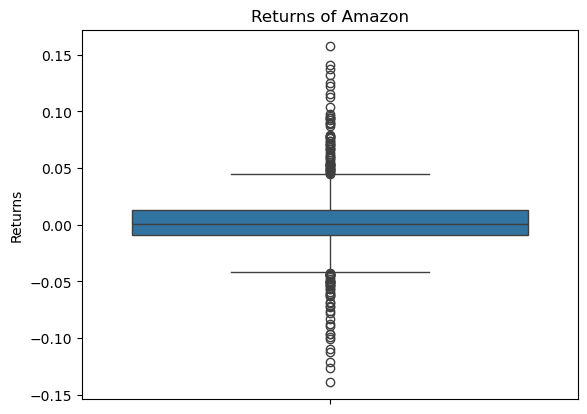

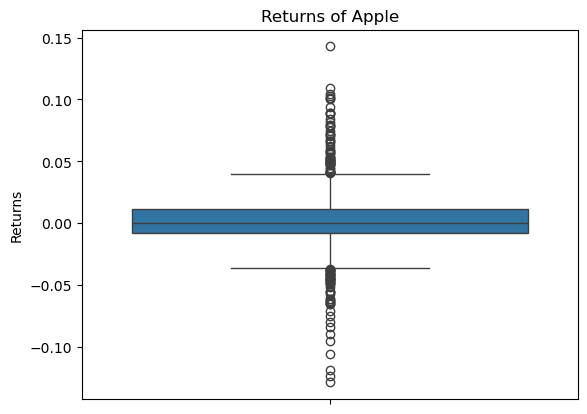

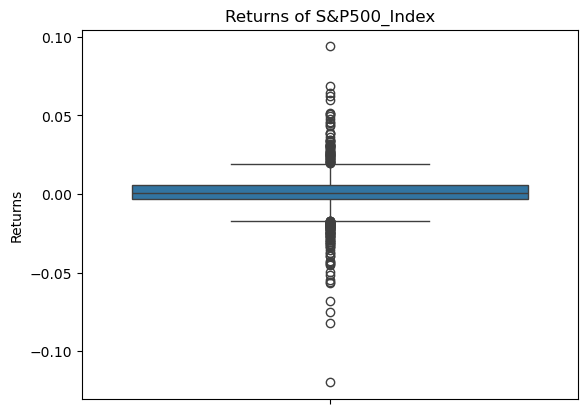

In [54]:
for i in returns.columns:
    sns.boxplot(returns[i]) 
    plt.ylabel("Returns")
    plt.title(f"Returns of {i}")
    plt.xticks(rotation=45)
    plt.show()

In [55]:
# mean of return series
mean_returns = returns.mean()
print(mean_returns)

Hawalian_Holdings    0.001211
Alaska_Air           0.001251
American_Airlines    0.001050
Goldman_Sachs        0.000531
Deutsche_Bank       -0.000538
Credit Suisse       -0.000304
Johnson&Johnson      0.000838
Merk&Co              0.000876
Bausch_Health        0.000681
Alphabet             0.001317
Amazon               0.002297
Apple                0.001911
S&P500_Index         0.000772
dtype: float64


### max Returns Date

In [56]:
returns.index = pd.to_datetime(returns.index)
for i in returns.columns:
    max_return = returns[i].max()  # ✅ Call .max() properly
    max_return_date = returns[returns[i] == max_return].index

    # Loop through all dates with the max return (in case of ties)
    for date in max_return_date:
        max_return_day = date.strftime("%A")  # ✅ Get day name from Timestamp
        print(f"Maximum return of stock \"{i}\" is {max_return:.5f} on {date.date()}, which is a {max_return_day}")

Maximum return of stock "Hawalian_Holdings" is 0.24584 on 2020-03-25, which is a Wednesday
Maximum return of stock "Alaska_Air" is 0.20308 on 2020-03-24, which is a Tuesday
Maximum return of stock "American_Airlines" is 0.59048 on 2020-06-15, which is a Monday
Maximum return of stock "Goldman_Sachs" is 0.17359 on 2016-11-14, which is a Monday
Maximum return of stock "Deutsche_Bank" is 0.20965 on 2012-09-13, which is a Thursday
Maximum return of stock "Credit Suisse" is 0.18536 on 2012-09-13, which is a Thursday
Maximum return of stock "Johnson&Johnson" is 0.07998 on 2020-03-30, which is a Monday
Maximum return of stock "Merk&Co" is 0.10307 on 2018-01-16, which is a Tuesday
Maximum return of stock "Bausch_Health" is 0.53189 on 2017-05-15, which is a Monday
Maximum return of stock "Alphabet" is 0.16052 on 2015-07-17, which is a Friday
Maximum return of stock "Amazon" is 0.15746 on 2012-04-27, which is a Friday
Maximum return of stock "Apple" is 0.14290 on 2018-05-14, which is a Monday
Ma

C:\Users\josev\AppData\Local\Temp\ipykernel_21736\2324606176.py:1: UserWarning: Parsing dates in %d-%m-%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  returns.index = pd.to_datetime(returns.index)


### Min Returns Date and Day of Stocks

In [57]:
for i in returns.columns:
    min_return = returns[i].min()
    min_return_date= returns[returns[i]==min_return].index
    for date in min_return_date:
        min_return_day = date.strftime("%A")
        print(f"Minimum return of stock \"{i}\" is {min_return:.5f} on {date.date()}, which is a {min_return_day}")

Minimum return of stock "Hawalian_Holdings" is -0.32328 on 2020-03-13, which is a Friday
Minimum return of stock "Alaska_Air" is -0.24792 on 2020-03-13, which is a Friday
Minimum return of stock "American_Airlines" is -0.25225 on 2020-03-18, which is a Wednesday
Minimum return of stock "Goldman_Sachs" is -0.13356 on 2012-05-14, which is a Monday
Minimum return of stock "Deutsche_Bank" is -0.31537 on 2020-03-13, which is a Friday
Minimum return of stock "Credit Suisse" is -0.27660 on 2020-03-13, which is a Friday
Minimum return of stock "Johnson&Johnson" is -0.10038 on 2018-12-14, which is a Friday
Minimum return of stock "Merk&Co" is -0.08899 on 2020-03-16, which is a Monday
Minimum return of stock "Bausch_Health" is -0.51463 on 2016-03-15, which is a Tuesday
Minimum return of stock "Alphabet" is -0.11101 on 2020-03-16, which is a Monday
Minimum return of stock "Amazon" is -0.13919 on 2016-01-13, which is a Wednesday
Minimum return of stock "Apple" is -0.12865 on 2020-03-16, which is a

### Calculation of Returns from Each Industry

In [58]:
# By assuming each firms have equal weight in the industry, the returns of the industry can be calculated as follows;

returns["Aviation_Industry"] = (returns["Hawalian_Holdings"]+returns["Alaska_Air"]+returns["American_Airlines"])/3
returns["Finance_Industry"] = (returns["Goldman_Sachs"]+returns["Deutsche_Bank"]+ returns["Credit Suisse"])/3
returns["HealthCare_Industry"] = (returns["Johnson&Johnson"]+returns["Merk&Co"])/2
returns["Pharma_Industry"] = returns["Bausch_Health"]
returns["Technology_Industry"] = (returns['Alphabet'] + returns['Amazon']+returns['Apple'])/3
returns.head()

,Hawalian_Holdings,Alaska_Air,American_Airlines,Goldman_Sachs,Deutsche_Bank,Credit Suisse,Johnson&Johnson,Merk&Co,Bausch_Health,Alphabet,Amazon,Apple,S&P500_Index,Aviation_Industry,Finance_Industry,HealthCare_Industry,Pharma_Industry,Technology_Industry
Date,,,,,,,,,,,,,,,,,,
2010-10-14,-0.010954,-0.003366,-0.002041,-0.020293,-0.003812,-0.008889,0.002517,-0.000269,-0.020459,-0.004362,0.002320,0.007230,-0.003641,-0.005454,-0.010998,0.001124,-0.020459,0.001729
2010-10-15,0.015823,-0.004854,-0.008180,-0.005937,-0.014263,-0.017040,-0.002667,-0.005384,-0.021253,0.111881,0.058574,0.041117,0.002027,0.000930,-0.012414,-0.004025,-0.021253,0.070524
2010-10-18,0.000000,0.009332,0.043299,0.019974,0.030527,0.028285,0.004562,0.007578,-0.004493,0.027035,-0.006560,0.010358,0.007244,0.017544,0.026262,0.006070,-0.004493,0.010278
2010-10-19,-0.031153,-0.023324,-0.002964,0.019649,-0.014383,-0.013975,-0.008926,-0.019071,-0.013163,-0.015995,-0.029897,-0.026761,-0.015877,-0.019147,-0.002903,-0.013998,-0.013163,-0.024218
2010-10-20,0.146302,0.063038,0.074331,0.018377,0.026060,0.012823,0.004898,0.012870,0.012195,0.000247,0.000000,0.003360,0.010524,0.094557,0.019087,0.008884,0.012195,0.001202


### Cumulative Return of Stocks, Industry & Index

In [61]:
# Entire period return from 2010-Oct-14 to 2020-Sep-30
cum_sum_returns = (1 + returns).cumprod()
cum_sum_returns.tail()

,Hawalian_Holdings,Alaska_Air,American_Airlines,Goldman_Sachs,Deutsche_Bank,Credit Suisse,Johnson&Johnson,Merk&Co,Bausch_Health,Alphabet,Amazon,Apple,S&P500_Index,Aviation_Industry,Finance_Industry,HealthCare_Industry,Pharma_Industry,Technology_Industry
Date,,,,,,,,,,,,,,,,,,
2020-09-24,2.014021,3.407625,1.273966,1.464793,0.172205,0.306417,3.056465,3.143561,0.568199,5.277540,19.461172,11.683097,2.755785,2.665585,0.484857,3.210840,0.568199,12.173458
2020-09-25,2.078990,3.503077,1.330250,1.463592,0.169869,0.301957,3.077381,3.135244,0.571185,5.339135,19.946703,12.121402,2.799813,2.758391,0.480180,3.217578,0.571185,12.474289
2020-09-28,2.173194,3.583256,1.381122,1.494523,0.179000,0.315335,3.108015,3.128817,0.570065,5.411410,20.455308,12.410726,2.844920,2.856261,0.499257,3.230296,0.570065,12.735849
2020-09-29,2.088735,3.500213,1.325920,1.477406,0.175602,0.313106,3.106959,3.096304,0.555506,5.429182,20.267319,12.316803,2.831228,2.759141,0.493016,3.212963,0.555506,12.678649
2020-09-30,2.093608,3.496395,1.330250,1.508787,0.178363,0.317565,3.145410,3.136000,0.580145,5.430180,20.292131,12.502490,2.854596,2.763286,0.501431,3.253440,0.580145,12.748313


#### Observations of returns of stocks for the entire period
- The value below 1 represents the loss making stocks. They are Deutsche_Bank, Credit Suisse stocks in the Finance industry.
- All the Technology-stocks(Alphabet,Amazon & Apple) are the high return-stocks with an average of 280% returns over the 10 years
- In the Health Care Pharma Industry, All the stocks were moderately performed with an average of 121% return performance over 10 years
- The Health_care_pharma have an average of 121% , 280% return for Technology related stocks, 178% return for Aviation related stocks over 10 Years.
- while creating portfolio, we can avoid Deutsche_Bank, Credit Suisse stocks and give low priority to Health Care Pharma stocks.

In [62]:
new = returns.loc["2015-01-01":,:]
cum_returns_2015 = (1+new.cumsum(axis=0,skipna=True))
cum_returns_2015.tail()

,Hawalian_Holdings,Alaska_Air,American_Airlines,Goldman_Sachs,Deutsche_Bank,Credit Suisse,Johnson&Johnson,Merk&Co,Bausch_Health,Alphabet,Amazon,Apple,S&P500_Index,Aviation_Industry,Finance_Industry,HealthCare_Industry,Pharma_Industry,Technology_Industry
Date,,,,,,,,,,,,,,,,,,
2020-09-24,1.093640,1.031189,0.380236,1.345700,0.306789,0.698442,1.574701,1.683496,0.041117,2.192563,3.543843,2.683450,1.537357,0.835022,0.783644,1.629098,0.041117,2.806619
2020-09-25,1.125898,1.059200,0.424416,1.344880,0.293226,0.683889,1.581544,1.680850,0.046373,2.204235,3.568792,2.720966,1.553334,0.869838,0.773998,1.631197,0.046373,2.831331
2020-09-28,1.171211,1.082088,0.462659,1.366014,0.346976,0.728192,1.591499,1.678800,0.044413,2.217771,3.594290,2.744835,1.569444,0.905319,0.813727,1.635149,0.044413,2.852299
2020-09-29,1.132347,1.058913,0.422690,1.354561,0.327996,0.721122,1.591159,1.668408,0.018872,2.221056,3.585100,2.737267,1.564632,0.871317,0.801226,1.629784,0.018872,2.847808
2020-09-30,1.134680,1.057822,0.425955,1.375801,0.343716,0.735364,1.603535,1.681229,0.063227,2.221239,3.586324,2.752343,1.572885,0.872819,0.818294,1.642382,0.063227,2.853302


#### Observations of returns on stocks over last 5 years from 2015 onwards

- The American Airlines in Aviation industry, Deutsche_Bank & Credit_Suisse in Finance industry, Bausch_Health in Pharma industry shows a negative cumulative return.
- The best performed stocks from 2015 were , Amazon & Apple from Technology industry
- Among industries, Aviation and Finance industry shows loss, and Technology & Health_Care industry stocks were performed well.
- Technology industry have a 550% cumulative return over 5 years, the most growing stock.

### Most Risky Stock

In [63]:
returns.columns

Index(['Hawalian_Holdings', 'Alaska_Air', 'American_Airlines', 'Goldman_Sachs',
       'Deutsche_Bank', 'Credit Suisse', 'Johnson&Johnson', 'Merk&Co',
       'Bausch_Health', 'Alphabet', 'Amazon', 'Apple', 'S&P500_Index',
       'Aviation_Industry', 'Finance_Industry', 'HealthCare_Industry',
       'Pharma_Industry', 'Technology_Industry'],
      dtype='object')

In [64]:
for i in returns.columns:
    print(f"The risk/standard deviation of stock {i} is {returns[i].std()}")

The risk/standard deviation of stock Hawalian_Holdings is 0.03768094166541524
The risk/standard deviation of stock Alaska_Air is 0.02905050106709167
The risk/standard deviation of stock American_Airlines is 0.04226580448201978
The risk/standard deviation of stock Goldman_Sachs is 0.022867927956165872
The risk/standard deviation of stock Deutsche_Bank is 0.034297843536749986
The risk/standard deviation of stock Credit Suisse is 0.02963125839927746
The risk/standard deviation of stock Johnson&Johnson is 0.013000109904868763
The risk/standard deviation of stock Merk&Co is 0.015822927248491707
The risk/standard deviation of stock Bausch_Health is 0.045014345216512375
The risk/standard deviation of stock Alphabet is 0.020332994411965302
The risk/standard deviation of stock Amazon is 0.02527377016046618
The risk/standard deviation of stock Apple is 0.02242587991291999
The risk/standard deviation of stock S&P500_Index is 0.012783691415540158
The risk/standard deviation of stock Aviation_Indus

In [65]:
risk_list = []
for i in returns.columns:
    risk_list.append({"Stock":i,"Risk/SD":returns[i].std(),"Entire_Period_Returns":cum_sum_returns[i].loc["2020-09-30"],"Returns_from_2015":cum_returns_2015[i].loc["2020-09-30"]})
stock_risk = pd.DataFrame(risk_list)
stock_risk_sorted = stock_risk.sort_values(by="Risk/SD", ascending=False)
stock_risk_sorted

,Stock,Risk/SD,Entire_Period_Returns,Returns_from_2015
16,Pharma_Industry,0.045014,0.580145,0.063227
8,Bausch_Health,0.045014,0.580145,0.063227
2,American_Airlines,0.042266,1.330250,0.425955
0,Hawalian_Holdings,0.037681,2.093608,1.134680
4,Deutsche_Bank,0.034298,0.178363,0.343716
13,Aviation_Industry,0.031564,2.763286,0.872819
5,Credit Suisse,0.029631,0.317565,0.735364
1,Alaska_Air,0.029051,3.496395,1.057822
14,Finance_Industry,0.026331,0.501431,0.818294
10,Amazon,0.025274,20.292131,3.586324


- Bausch Health, American Airlines, Alaska Air were underperformed after 2015, first 2 were faced losses during this period.
- Deutsche Bank and Credit Suisse were performed comparatively better but still faces loss.
- Finance Industry stocks face losses to the entire, but Aviation industry stocks faces losses after 2015.

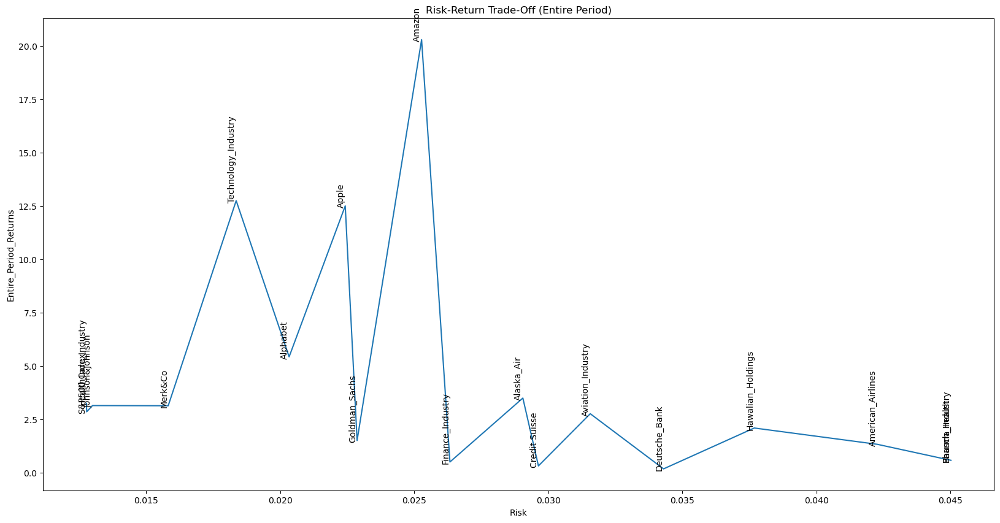

In [66]:
plt.figure(figsize=(20,10))
sns.lineplot(data=stock_risk_sorted,x=stock_risk_sorted["Risk/SD"],y=stock_risk_sorted["Entire_Period_Returns"])
plt.title("Risk-Return Trade-Off (Entire Period)")
plt.xlabel("Risk")
for i in range(len(stock_risk_sorted)):
    plt.text(
        x=stock_risk_sorted["Risk/SD"].iloc[i],
        y=stock_risk_sorted["Entire_Period_Returns"].iloc[i],
        s=stock_risk_sorted["Stock"].iloc[i],
        fontsize=10,
        ha='right',rotation=90
    )
plt.show()

- From the entire period risk-return trade-off, we can not derive a specific pattern
- moderate risky stocks performs better

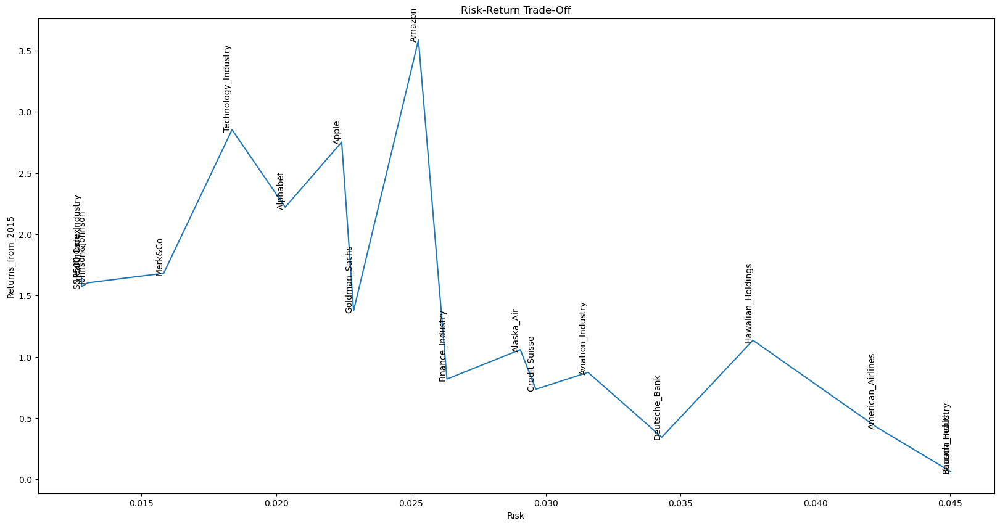

In [67]:
plt.figure(figsize=(20,10))
sns.lineplot(data=stock_risk_sorted,x=stock_risk_sorted["Risk/SD"],y=stock_risk_sorted["Returns_from_2015"])
plt.title("Risk-Return Trade-Off")
plt.xlabel("Risk")
for i in range(len(stock_risk_sorted)):
    plt.text(
        x=stock_risk_sorted["Risk/SD"].iloc[i],
        y=stock_risk_sorted["Returns_from_2015"].iloc[i],
        s=stock_risk_sorted["Stock"].iloc[i],
        fontsize=10,
        ha='right',rotation=90
    )
plt.show()

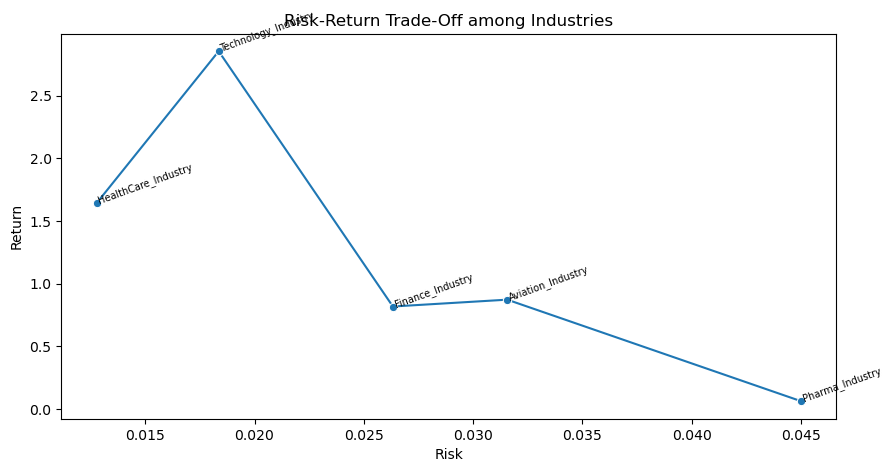

In [71]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter the data
industries = ['Aviation_Industry', 'Finance_Industry', 'HealthCare_Industry', 'Technology_Industry','Pharma_Industry']
filtered_data = stock_risk_sorted[stock_risk_sorted["Stock"].isin(industries)]

# Plot
plt.figure(figsize=(10,5))
sns.lineplot(data=filtered_data, x="Risk/SD", y="Returns_from_2015", marker='o')
plt.title("Risk-Return Trade-Off among Industries")
plt.xlabel("Risk")
plt.ylabel("Return")

# Add labels
for i in range(len(filtered_data)):
    plt.text(
        x=filtered_data["Risk/SD"].iloc[i],
        y=filtered_data["Returns_from_2015"].iloc[i],
        s=filtered_data["Stock"].iloc[i],
        fontsize=7,
        ha='left',
        rotation=20
    )

plt.show()

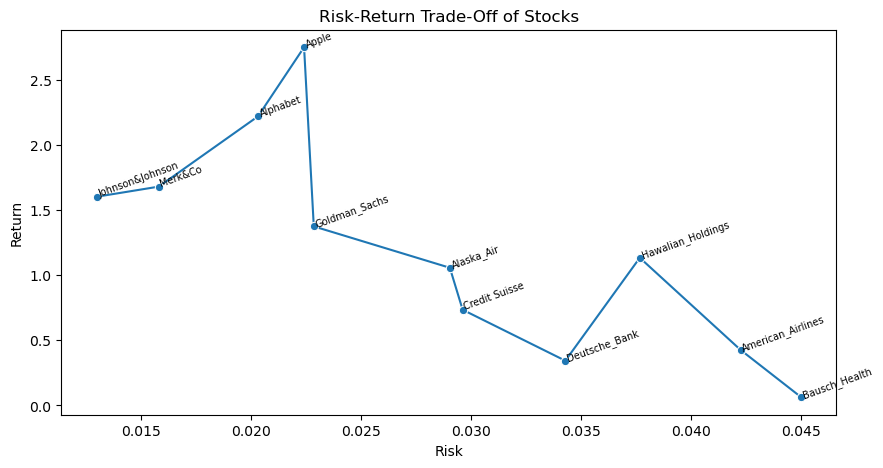

In [72]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter the data
stock = ['Bausch_Health','American_Airlines','Hawalian_Holdings','Deutsche_Bank','Credit Suisse','Alaska_Air',' Amazon','Goldman_Sachs',
         'Apple','Alphabet','Merk&Co','Johnson&Johnson']
filtered_data1 = stock_risk_sorted[stock_risk_sorted["Stock"].isin(stock)]

# Plot
plt.figure(figsize=(10,5))
sns.lineplot(data=filtered_data1, x="Risk/SD", y="Returns_from_2015", marker='o')
plt.title("Risk-Return Trade-Off of Stocks")
plt.xlabel("Risk")
plt.ylabel("Return")

# Add labels
for i in range(len(filtered_data1)):
    plt.text(
        x=filtered_data1["Risk/SD"].iloc[i],
        y=filtered_data1["Returns_from_2015"].iloc[i],
        s=filtered_data1["Stock"].iloc[i],
        fontsize=7,
        ha='left',
        rotation=20
    )

plt.show()

#### Risk-Return Trade off & Portfolio selection from 2015 

- Johnson&Johnson, MercK&Co,Alphabet, Apple, Goldman Sachs & Amazon have low risk and comparative above average return
- Among the above mentioned stocks Alphabet, Apple & Amazon stocks have a higher return to the rest stocks
- by considering industry, Technology & HealthcarePharma industry have a better return prospects
- Finance & Aviation industry have

### Correlation of Stocks with Industries & Market

In [74]:
returns.columns

Index(['Hawalian_Holdings', 'Alaska_Air', 'American_Airlines', 'Goldman_Sachs',
       'Deutsche_Bank', 'Credit Suisse', 'Johnson&Johnson', 'Merk&Co',
       'Bausch_Health', 'Alphabet', 'Amazon', 'Apple', 'S&P500_Index',
       'Aviation_Industry', 'Finance_Industry', 'HealthCare_Industry',
       'Pharma_Industry', 'Technology_Industry'],
      dtype='object')

In [75]:
aviation_returns = returns[['Hawalian_Holdings', 'Alaska_Air', 'American_Airlines','Aviation_Industry','S&P500_Index']]
finance_returns = returns[['Goldman_Sachs','Deutsche_Bank', 'Credit Suisse','Finance_Industry','S&P500_Index']]
health_returns = returns[['Johnson&Johnson', 'Merk&Co','HealthCare_Industry','S&P500_Index']]
pharma_returns = returns[['Bausch_Health','Pharma_Industry','S&P500_Index']]
tech_returns = returns[['Alphabet', 'Amazon', 'Apple','Technology_Industry','S&P500_Index']]

In [76]:
# Aviation Industry
aviation_returns.corr()

,Hawalian_Holdings,Alaska_Air,American_Airlines,Aviation_Industry,S&P500_Index
Hawalian_Holdings,1.000000,0.645244,0.597772,0.862702,0.418897
Alaska_Air,0.645244,1.000000,0.651431,0.854319,0.540573
American_Airlines,0.597772,0.651431,1.000000,0.884075,0.410545
Aviation_Industry,0.862702,0.854319,0.884075,1.000000,0.515782
S&P500_Index,0.418897,0.540573,0.410545,0.515782,1.000000


In [77]:
# Finance Industry
finance_returns.corr()

,Goldman_Sachs,Deutsche_Bank,Credit Suisse,Finance_Industry,S&P500_Index
Goldman_Sachs,1.000000,0.666512,0.707640,0.844345,0.739777
Deutsche_Bank,0.666512,1.000000,0.815640,0.933113,0.645408
Credit Suisse,0.707640,0.815640,1.000000,0.934128,0.686876
Finance_Industry,0.844345,0.933113,0.934128,1.000000,0.752058
S&P500_Index,0.739777,0.645408,0.686876,0.752058,1.000000


In [78]:
# Healthcare Industry
health_returns.corr()

,Johnson&Johnson,Merk&Co,HealthCare_Industry,S&P500_Index
Johnson&Johnson,1.000000,0.566984,0.860057,0.615583
Merk&Co,0.566984,1.000000,0.907904,0.532810
HealthCare_Industry,0.860057,0.907904,1.000000,0.643267
S&P500_Index,0.615583,0.532810,0.643267,1.000000


In [79]:
# Pharma Industry
pharma_returns.corr()

,Bausch_Health,Pharma_Industry,S&P500_Index
Bausch_Health,1.000000,1.000000,0.412134
Pharma_Industry,1.000000,1.000000,0.412134
S&P500_Index,0.412134,0.412134,1.000000


In [80]:
# Technology Industry
tech_returns.corr()

,Alphabet,Amazon,Apple,Technology_Industry,S&P500_Index
Alphabet,1.000000,0.577486,0.483833,0.831199,0.663758
Amazon,0.577486,1.000000,0.391165,0.831369,0.563845
Apple,0.483833,0.391165,1.000000,0.765312,0.590041
Technology_Industry,0.831199,0.831369,0.765312,1.000000,0.744050
S&P500_Index,0.663758,0.563845,0.590041,0.744050,1.000000


## Beta Values of Stocks

In [89]:
import statsmodels.api as sm

In [81]:
returns1 = returns.drop(columns=['Aviation_Industry', 'Finance_Industry', 'HealthCare_Industry','Pharma_Industry',
       'Technology_Industry'])
returns1.columns

Index(['Hawalian_Holdings', 'Alaska_Air', 'American_Airlines', 'Goldman_Sachs',
       'Deutsche_Bank', 'Credit Suisse', 'Johnson&Johnson', 'Merk&Co',
       'Bausch_Health', 'Alphabet', 'Amazon', 'Apple', 'S&P500_Index'],
      dtype='object')

In [82]:
import statsmodels.api as sm
betas = {}
for stock in returns1.columns:
    if stock!="S&P500_Index":
        X = returns1["S&P500_Index"]
        y=returns1[stock]
        X = sm.add_constant(X)
        model = sm.OLS(y,X).fit()
        beta = model.params["S&P500_Index"]
        betas[stock]=beta
        
beta_df = pd.DataFrame.from_dict(betas, orient='index', columns=['Beta'])
print(beta_df.sort_values(by="Beta", ascending=False))    

                       Beta
Deutsche_Bank      1.731588
Credit Suisse      1.592107
Bausch_Health      1.451221
American_Airlines  1.357356
Goldman_Sachs      1.323340
Hawalian_Holdings  1.234731
Alaska_Air         1.228435
Amazon             1.114740
Alphabet           1.055735
Apple              1.035083
Merk&Co            0.659481
Johnson&Johnson    0.626004


In [83]:
# Ensure 'Stock' is a column in both DataFrames
beta_df = beta_df.reset_index().rename(columns={"index": "Stock"})

# Merge beta with risk & return data on 'Stock'
stock_info_df = pd.merge(beta_df, stock_risk_sorted, on="Stock", how="inner")


In [84]:
stock_info_df.sort_values(by="Risk/SD",ascending=False)

,Stock,Beta,Risk/SD,Entire_Period_Returns,Returns_from_2015
8,Bausch_Health,1.451221,0.045014,0.580145,0.063227
2,American_Airlines,1.357356,0.042266,1.330250,0.425955
0,Hawalian_Holdings,1.234731,0.037681,2.093608,1.134680
4,Deutsche_Bank,1.731588,0.034298,0.178363,0.343716
5,Credit Suisse,1.592107,0.029631,0.317565,0.735364
1,Alaska_Air,1.228435,0.029051,3.496395,1.057822
10,Amazon,1.114740,0.025274,20.292131,3.586324
3,Goldman_Sachs,1.323340,0.022868,1.508787,1.375801
11,Apple,1.035083,0.022426,12.502490,2.752343
9,Alphabet,1.055735,0.020333,5.430180,2.221239


- dropping the following stocks for the portfolio creation Bausch_Health, Deutsche_Bank, Credit_suisse,American_Airlines with negative returns
- The top stocks which is good with better returns for the portfolio creation is the Johnson&Johnson, Merk&Co, Alphabet, Apple
- Hawalian_Holdings and Alaska_Air have a high risk with lower positive returns which can be least preferred for the portfolio creation.
- Amazon have higher risk, with higher return which is good for portfolio
- Goldman_Sachs have a higher beta and risk with positive return, also can be added to the portfolio
                        

### Stock Performance Analysis using 'Alpha', 'Beta',Expected return & Market Return

In [86]:
# Evaluating beta for all stocks using linear regression.
from sklearn.linear_model import LinearRegression

risk_free_return = 0.75  # in percentage
market_return = returns['S&P500_Index'].mean() * 252 * 100  # annualized market return in %

model = LinearRegression()
x_train = returns['S&P500_Index'].values.reshape(-1, 1)
list1 = returns.columns
for stock in list1:
    y_train = returns[stock].values.reshape(-1, 1)
    
    model.fit(x_train, y_train)
    
    alpha = model.intercept_[0] * 100  # convert to percentage
    beta = model.coef_[0][0]
    
    expected_return = risk_free_return + beta * (market_return - risk_free_return)
    
    print("\n******************######################******************")
    print(f"                       {stock}")
    print("******************######################******************")
    print("Alpha: {:.5f}%".format(alpha))
    print("Beta: {:.5f}".format(beta))
    print("Risk-Free Return: {:.2f}%".format(risk_free_return))
    print("Market Return: {:.2f}%".format(market_return))
    print("Expected Return (CAPM): {:.2f}%".format(expected_return))


******************######################******************
                       Hawalian_Holdings
******************######################******************
Alpha: 0.02587%
Beta: 1.23473
Risk-Free Return: 0.75%
Market Return: 19.44%
Expected Return (CAPM): 23.83%

******************######################******************
                       Alaska_Air
******************######################******************
Alpha: 0.03028%
Beta: 1.22843
Risk-Free Return: 0.75%
Market Return: 19.44%
Expected Return (CAPM): 23.71%

******************######################******************
                       American_Airlines
******************######################******************
Alpha: 0.00029%
Beta: 1.35736
Risk-Free Return: 0.75%
Market Return: 19.44%
Expected Return (CAPM): 26.12%

******************######################******************
                       Goldman_Sachs
******************######################******************
Alpha: -0.04902%
Beta: 1.32334
Risk-Free Return: 0

### Observations
- Amazon - High Growth stock with strong performance beyond market expectations
- Apple - Stable tech stock offering excellent long-term value
- Alphabet - Consistent performer with balanced risk&riward
- American Airlines - High return potential but with elevated market risk
- Goldman Sachs - Expected to perform well, but slightly underperforms market adjusted return
- Deutsche Bank - Very risky and underperforming - avoid for conservative investors
- Credit Suisse - Negative alpha suggests inefficiency despite high beta returns
- Bausch Health - Unstable return performance - caution advised
- Johnson&Johnson - low risk, reliable returns
- Merk & Co - Steady and low-risk investment
- **Decision**
 - Buy/Hold: Amazon, Apple, Alphabet
 - Cautious Considerations: American Airlines, Goldman Sachs
 - Avoid or Reduce Exposure: Deutsche Bank, Credit Suisse, Bausch Health
 - Add for stability: Johnson & Johnson, Merk&Co

In [249]:
returns.columns

Index(['Hawalian_Holdings', 'Alaska_Air', 'American_Airlines', 'Goldman_Sachs',
       'Deutsche_Bank', 'Credit Suisse', 'Johnson&Johnson', 'Merk&Co',
       'Bausch_Health', 'Alphabet', 'Amazon', 'Apple', 'S&P500_Index',
       'Aviation_Industry', 'Finance_Industry', 'HealthCare_Industry',
       'Pharma_Industry', 'Technology_Industry'],
      dtype='object')

In [251]:
return_stocks = returns.copy()
return_stocks.drop(columns=[
       'Aviation_Industry', 'Finance_Industry', 'HealthCare_Industry',
       'Pharma_Industry', 'Technology_Industry'],inplace=True)

In [252]:
import pandas as pd
from sklearn.linear_model import LinearRegression

risk_free_return = 0.75  # in percentage
market_return = return_stocks['S&P500_Index'].mean() * 252 * 100  # annualized market return in %

model = LinearRegression()
x_train = return_stocks['S&P500_Index'].values.reshape(-1, 1)

results = []

for i, stock in enumerate(return_stocks.columns):
    if stock == 'S&P500_Index':
        continue  # Skip market index from stock-wise regression

    y_train = return_stocks[stock].values.reshape(-1, 1)
    model.fit(x_train, y_train)

    alpha = model.intercept_[0] * 100                   # convert to %
    beta = model.coef_[0][0]

    expected_return = risk_free_return + beta * (market_return - risk_free_return)

    # Annualized return & std dev for Sharpe Ratio
    stock_mean_return = return_stocks[stock].mean() * 252 * 100
    stock_std = return_stocks[stock].std() * (252 ** 0.5) * 100

    sharpe_ratio = (stock_mean_return - risk_free_return) / stock_std if stock_std != 0 else None

    results.append({
        'Sl No.': len(results) + 1,
        'Stock Name': stock,
        'Alpha (%)': round(alpha, 4),
        'Beta': round(beta, 4),
        'Risk-Free Return (%)': round(risk_free_return, 2),
        'Market Return (%)': round(market_return, 2),
        'Expected Return (CAPM) (%)': round(expected_return, 2),
        'Sharpe Ratio': round(sharpe_ratio, 4) if sharpe_ratio is not None else 'NA'
    })

# Create DataFrame
capm_df = pd.DataFrame(results)

# Display the table
capm_df


,Sl No.,Stock Name,Alpha (%),Beta,Risk-Free Return (%),Market Return (%),Expected Return (CAPM) (%),Sharpe Ratio
0,1,Hawalian_Holdings,0.0259,1.2347,0.75,19.44,23.83,0.4978
1,2,Alaska_Air,0.0303,1.2284,0.75,19.44,23.71,0.6671
2,3,American_Airlines,0.0003,1.3574,0.75,19.44,26.12,0.3832
3,4,Goldman_Sachs,-0.0490,1.3233,0.75,19.44,25.49,0.3478
4,5,Deutsche_Bank,-0.1874,1.7316,0.75,19.44,33.12,-0.2626
5,6,Credit Suisse,-0.1532,1.5921,0.75,19.44,30.51,-0.1787
6,7,Johnson&Johnson,0.0355,0.6260,0.75,19.44,12.45,0.9866
7,8,Merk&Co,0.0367,0.6595,0.75,19.44,13.08,0.8488
8,9,Bausch_Health,-0.0439,1.4512,0.75,19.44,27.88,0.2297
9,10,Alphabet,0.0503,1.0557,0.75,19.44,20.48,1.0051


,Hawalian_Holdings,Alaska_Air,American_Airline,S&P500
Date,,,,
13-10-2010,1.000000,1.000000,1.000000,1.000000
14-10-2010,0.989046,0.996634,0.997959,0.996359
15-10-2010,1.004695,0.991796,0.989796,0.998379
18-10-2010,1.004695,1.001052,1.032653,1.005611
19-10-2010,0.973396,0.977703,1.029592,0.989644
...,...,...,...,...
24-09-2020,2.014021,3.407625,1.273966,2.755785
25-09-2020,2.078990,3.503077,1.330250,2.799813
28-09-2020,2.173194,3.583256,1.381122,2.844920


## Portfolio Optimization with Whole Data

In [87]:
portfolio2010 = returns[["Apple","Alphabet","Amazon","Johnson&Johnson","Merk&Co","Goldman_Sachs"]]

In [88]:
weights = [
    [0.2, 0.2, 0.2, 0.2, 0.15, 0.05],
    [0.3, 0.3, 0.2, 0.1, 0.05, 0.05],
    [0.25, 0.25, 0.25, 0.15, 0.05, 0.05],
    [0.2, 0.2, 0.4, 0.1, 0.05, 0.05],
    [0.2, 0.2, 0.3, 0.1, 0.1, 0.1]
]

In [89]:
for i, w in enumerate(weights):
    portfolio2010[f"Portfolio_{i+1}"] = portfolio2010.iloc[:, :6].dot(w)

C:\Users\josev\AppData\Local\Temp\ipykernel_21736\1650228777.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  portfolio2010[f"Portfolio_{i+1}"] = portfolio2010.iloc[:, :6].dot(w)
C:\Users\josev\AppData\Local\Temp\ipykernel_21736\1650228777.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  portfolio2010[f"Portfolio_{i+1}"] = portfolio2010.iloc[:, :6].dot(w)
C:\Users\josev\AppData\Local\Temp\ipykernel_21736\1650228777.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

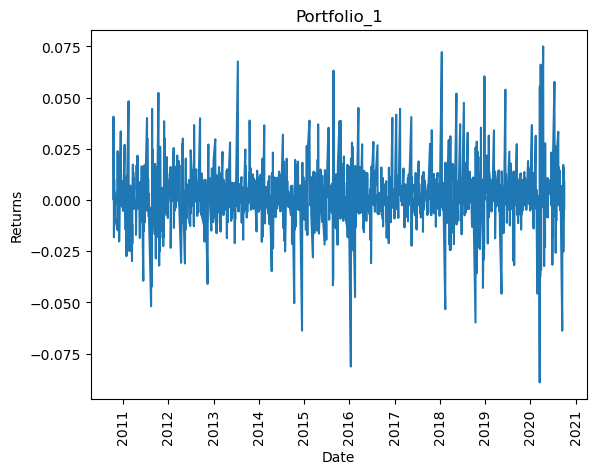

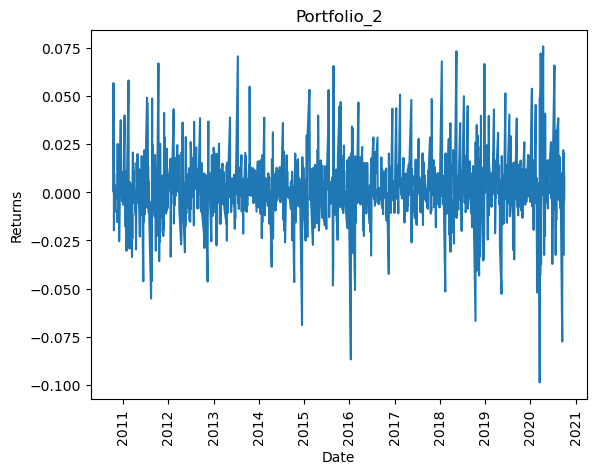

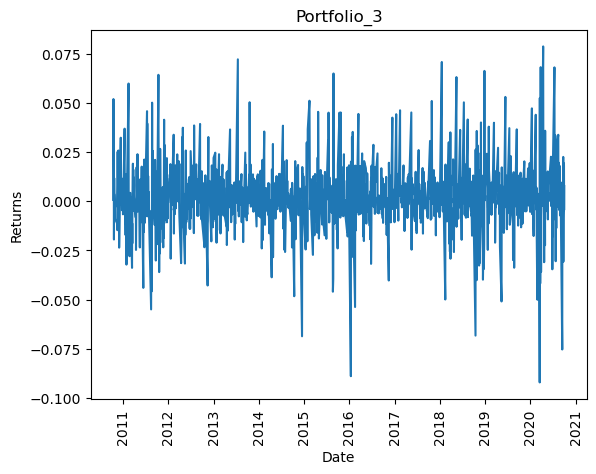

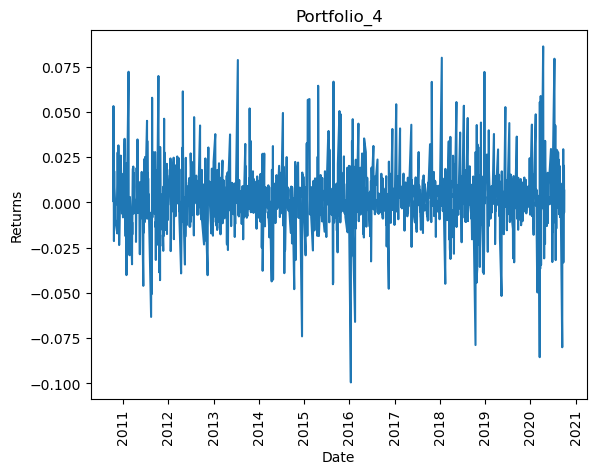

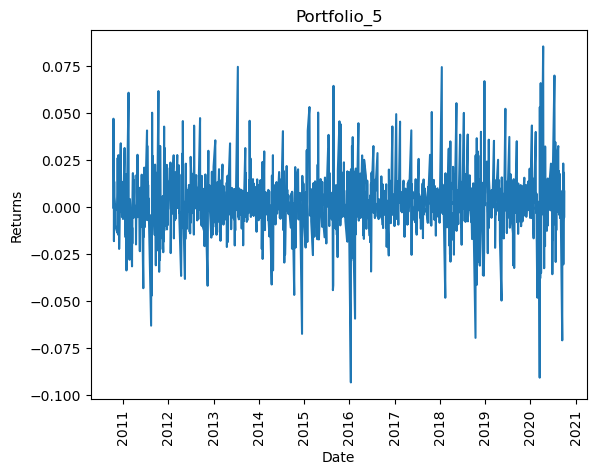

In [90]:
portfolio_df2010 = portfolio2010[['Portfolio_1', 'Portfolio_2', 'Portfolio_3',
       'Portfolio_4', 'Portfolio_5']]
for i in portfolio_df2010.columns:
    plt.plot(portfolio_df2010[i])
    plt.title(i)
    plt.xlabel("Date")
    plt.ylabel("Returns")
    plt.xticks(rotation=90)
    plt.show()

### Covariance Matrix

In [113]:
annual_covariance_metrix_2010 = (portfolio2010[['Apple', 'Alphabet', 'Amazon', 'Johnson&Johnson', 'Merk&Co',
       'Goldman_Sachs']].cov())*252
annual_covariance_metrix_2010

,Apple,Alphabet,Amazon,Johnson&Johnson,Merk&Co,Goldman_Sachs
Apple,3.993969,0.024025,0.036246,0.018016,0.012538,0.048997
Alphabet,0.024025,0.104185,0.013356,0.024352,0.022634,0.050578
Amazon,0.036246,0.013356,4.022167,0.000176,0.017566,0.034912
Johnson&Johnson,0.018016,0.024352,0.000176,0.042589,0.029390,0.027734
Merk&Co,0.012538,0.022634,0.017566,0.029390,0.063092,0.032233
Goldman_Sachs,0.048997,0.050578,0.034912,0.027734,0.032233,0.131781


### Cumulative Returns of the Portfolio

In [91]:
cum_returns_portfolio2010 = (1 + portfolio_df2010).cumprod()
cum_returns_portfolio2010.tail(5)

,Portfolio_1,Portfolio_2,Portfolio_3,Portfolio_4,Portfolio_5
Date,,,,,
2020-09-24,7.326932,8.768927,8.797125,10.560323,8.569706
2020-09-25,7.442389,8.946559,8.967677,10.774993,8.721045
2020-09-28,7.556413,9.110021,9.130649,10.986507,8.878324
2020-09-29,7.519431,9.071309,9.089455,10.924334,8.826544
2020-09-30,7.585280,9.141734,9.159266,10.995148,8.897711


### Sharpe Ratio, Return, Risk of Portfolio

In [92]:
import numpy as np
sharpe_risk_list = []

for i in portfolio_df2010.columns:
    daily_risk = portfolio_df2010[i].std()
    annual_risk = daily_risk*np.sqrt(252)
    daily_mean_return = portfolio_df2010[i].mean()
    yearly_geom_return = (np.prod(1 + portfolio_df2010[i]) ** (252 / len(portfolio_df2010[i]))) - 1
    total_return = portfolio_df2010[i].sum()
    sharpe = (yearly_geom_return-0.0075) / annual_risk  # assuming risk-free rate = 0.75%

    sharpe_risk_list.append({
        "Portfolio": i,
        "Daily Mean Returns":daily_mean_return,
        "Annual Returns": yearly_geom_return,
        "Risk": daily_risk,
        "Annual Risk": annual_risk,
        "Sharpe_Ratio": sharpe,
        "Total_Return":total_return
    })

# Convert list to DataFrame
sharpe_risk_df2010 = pd.DataFrame(sharpe_risk_list)

sharpe_risk_df2010

,Portfolio,Daily Mean Returns,Annual Returns,Risk,Annual Risk,Sharpe_Ratio,Total_Return
0,Portfolio_1,0.001430,0.398615,0.014036,0.222815,1.755334,2.177181
1,Portfolio_2,0.001582,0.442511,0.015958,0.253324,1.717210,2.407753
2,Portfolio_3,0.001577,0.442968,0.015578,0.247295,1.760927,2.400592
3,Portfolio_4,0.001718,0.487282,0.016880,0.267962,1.790483,2.615469
4,Portfolio_5,0.001559,0.436063,0.015635,0.248193,1.726732,2.372965


- From above portfolio_4 performs better

### Portfolio Optimization from 2015

In [93]:
returns.index = pd.to_datetime(returns.index)

In [94]:
portfolio = returns[["Apple","Alphabet","Amazon","Johnson&Johnson","Merk&Co","Goldman_Sachs"]]
portfolio1 = portfolio.loc["2015-01-01":]

In [95]:
weights = [
    [0.2, 0.2, 0.2, 0.2, 0.15, 0.05],
    [0.3, 0.3, 0.2, 0.1, 0.05, 0.05],
    [0.25, 0.25, 0.25, 0.15, 0.05, 0.05],
    [0.2, 0.2, 0.4, 0.1, 0.05, 0.05],
    [0.2, 0.2, 0.3, 0.1, 0.1, 0.1]
]


In [96]:
for i, w in enumerate(weights):
    portfolio1[f"Portfolio_{i+1}"] = portfolio1.iloc[:, :6].dot(w)

C:\Users\josev\AppData\Local\Temp\ipykernel_21736\3763986428.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  portfolio1[f"Portfolio_{i+1}"] = portfolio1.iloc[:, :6].dot(w)
C:\Users\josev\AppData\Local\Temp\ipykernel_21736\3763986428.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  portfolio1[f"Portfolio_{i+1}"] = portfolio1.iloc[:, :6].dot(w)
C:\Users\josev\AppData\Local\Temp\ipykernel_21736\3763986428.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
T

In [97]:
portfolio1.head()

,Apple,Alphabet,Amazon,Johnson&Johnson,Merk&Co,Goldman_Sachs,Portfolio_1,Portfolio_2,Portfolio_3,Portfolio_4,Portfolio_5
Date,,,,,,,,,,,
2015-01-13,-0.001450,-0.057409,-0.050298,0.001817,0.095087,-0.045917,-0.009501,-0.025077,-0.024558,-0.029251,-0.021762
2015-01-14,-0.003810,0.009452,-0.004987,-0.007255,0.007236,-0.025415,-0.001505,-0.000939,-0.001834,-0.002501,-0.002911
2015-01-15,-0.027141,0.001837,-0.021550,-0.014519,-0.012133,-0.009654,-0.014577,-0.014442,-0.014981,-0.016222,-0.015156
2015-01-16,-0.007770,0.012535,0.013208,0.015123,0.018584,-0.007059,0.009054,0.006160,0.007338,0.008325,0.007580
2015-01-20,0.025758,-0.002322,-0.004471,-0.026432,-0.006663,-0.009028,-0.002945,0.002708,-0.000008,-0.000529,-0.000867


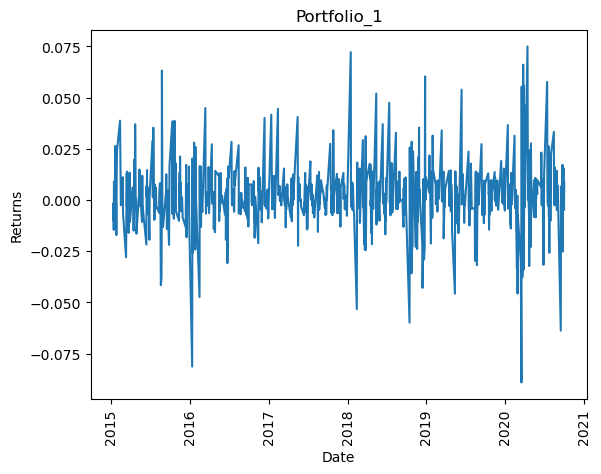

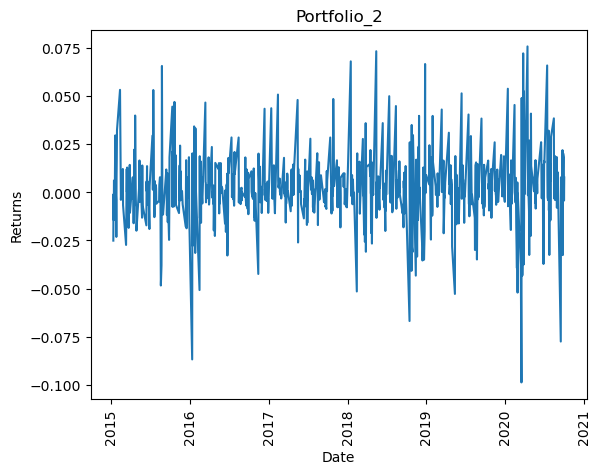

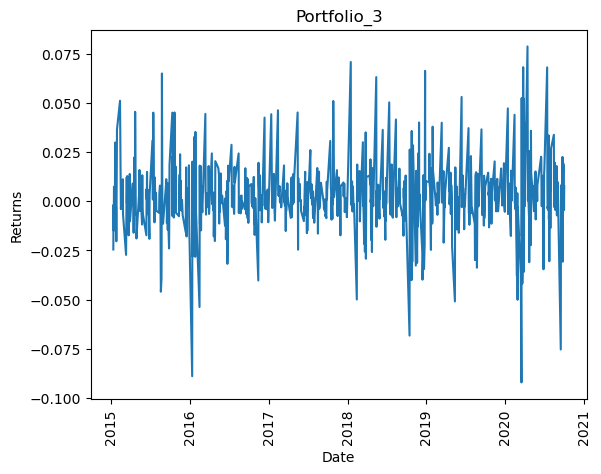

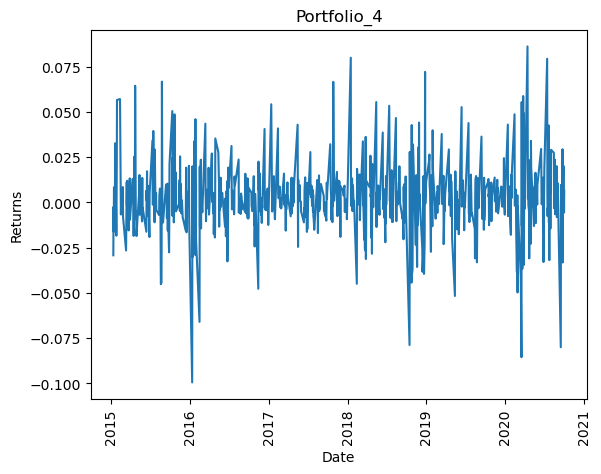

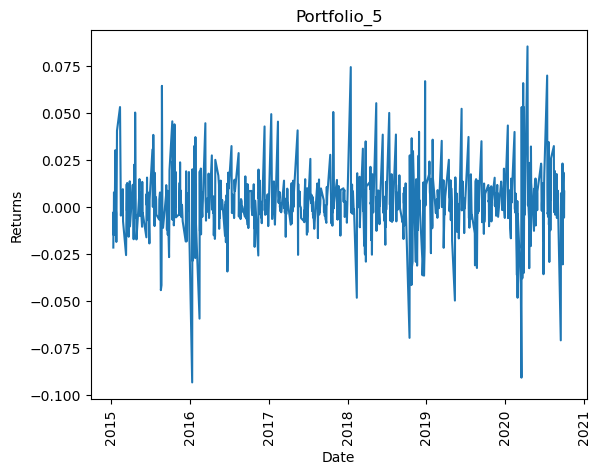

In [98]:
portfolio_df = portfolio1[['Portfolio_1', 'Portfolio_2', 'Portfolio_3',
       'Portfolio_4', 'Portfolio_5']]
for i in portfolio_df.columns:
    plt.plot(portfolio_df[i])
    plt.title(i)
    plt.xlabel("Date")
    plt.ylabel("Returns")
    plt.xticks(rotation=90)
    plt.show()

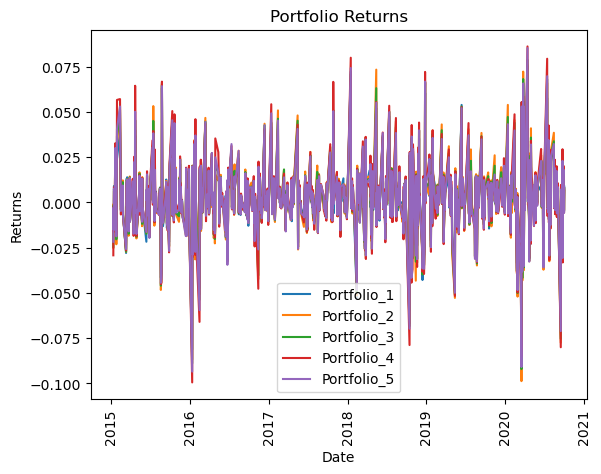

In [99]:
plt.plot(portfolio_df)
plt.title("Portfolio Returns")
plt.xlabel("Date")
plt.ylabel("Returns")
plt.xticks(rotation=90)
plt.legend(portfolio_df.columns)
plt.show()

#### Covariance of Stocks in the portfolio

In [100]:
annual_covariance_metrix = (portfolio1[['Apple', 'Alphabet', 'Amazon', 'Johnson&Johnson', 'Merk&Co',
       'Goldman_Sachs']].cov())*252
annual_covariance_metrix

,Apple,Alphabet,Amazon,Johnson&Johnson,Merk&Co,Goldman_Sachs
Apple,0.130316,0.068163,0.069134,0.028599,0.029000,0.064715
Alphabet,0.068163,0.110507,0.087333,0.029600,0.025990,0.061250
Amazon,0.069134,0.087333,0.154684,0.029434,0.017724,0.054635
Johnson&Johnson,0.028599,0.029600,0.029434,0.053328,0.035732,0.030984
Merk&Co,0.029000,0.025990,0.017724,0.035732,0.073320,0.033684
Goldman_Sachs,0.064715,0.061250,0.054635,0.030984,0.033684,0.142124


- The diagonal elements shows the variance of each stocks and the off diagonal values shows the covariance between the stocks

### Cumulative Return of Each Portfolio

In [102]:
cum_returns_portfolio = (1+portfolio_df).cumprod()
cum_returns_portfolio.tail(5)

,Portfolio_1,Portfolio_2,Portfolio_3,Portfolio_4,Portfolio_5
Date,,,,,
2020-09-24,3.388820,3.872985,3.945759,4.783889,3.972978
2020-09-25,3.442221,3.951440,4.022256,4.881136,4.043140
2020-09-28,3.494959,4.023637,4.095354,4.976953,4.116056
2020-09-29,3.477854,4.006539,4.076877,4.948788,4.092050
2020-09-30,3.508310,4.037643,4.108189,4.980868,4.125044


### Sharpe Ratio Analysis

In [103]:
sharpe_risk_list = []

for i in portfolio_df.columns:
    daily_risk = portfolio_df[i].std()
    annual_risk = daily_risk*np.sqrt(252)
    daily_mean_return = portfolio_df[i].mean()
    yearly_geom_return = (np.prod(1 + portfolio_df[i]) ** (252 / len(portfolio_df[i]))) - 1
    total_return = portfolio_df[i].sum()
    sharpe = (yearly_geom_return-0.0075) / annual_risk  # assuming risk-free rate = 0.75%

    sharpe_risk_list.append({
        "Portfolio": i,
        "Daily Mean Returns":daily_mean_return,
        "Annual Returns": yearly_geom_return,
        "Risk": daily_risk,
        "Annual Risk": annual_risk,
        "Sharpe_Ratio": sharpe,
        "Total_Return":total_return
    })

# Convert list to DataFrame
sharpe_risk_df = pd.DataFrame(sharpe_risk_list)

sharpe_risk_df

,Portfolio,Daily Mean Returns,Annual Returns,Risk,Annual Risk,Sharpe_Ratio,Total_Return
0,Portfolio_1,0.001542,0.433679,0.014931,0.237030,1.797995,1.353663
1,Portfolio_2,0.001734,0.492686,0.016945,0.268997,1.803683,1.522545
2,Portfolio_3,0.001746,0.500125,0.016500,0.261937,1.880700,1.533358
3,Portfolio_4,0.001985,0.585396,0.017590,0.279238,2.069546,1.742451
4,Portfolio_5,0.001750,0.501889,0.016445,0.261061,1.893765,1.536670


- portfolio_4 is the best portfolio which have a best highest sharpe ratio and the highest return even though it have a comparatively higher market risk

# Multivariate Time Series Analysis

In [104]:
#Normalising the dataset by dividing each row with the value of stock in first row. This will help in proper comaprision between stocks.
#portfolio_sp500= prices.div(prices.iloc[0])

In [105]:
final_df = portfolio2010[["Apple","Alphabet","Amazon","Johnson&Johnson","Merk&Co","Goldman_Sachs"]]

In [106]:
portfolio_4_weights = [0.2, 0.2, 0.4, 0.1, 0.05, 0.05]
portfolio_assets = ['Apple', 'Alphabet', 'Amazon', 'Johnson&Johnson', 'Merk&Co', 'Goldman_Sachs']

# Compute the weighted portfolio return
final_df['Portfolio_4'] = final_df[portfolio_assets].dot(portfolio_4_weights)

C:\Users\josev\AppData\Local\Temp\ipykernel_21736\1042115259.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_df['Portfolio_4'] = final_df[portfolio_assets].dot(portfolio_4_weights)


In [107]:
final_df.head()

,Apple,Alphabet,Amazon,Johnson&Johnson,Merk&Co,Goldman_Sachs,Portfolio_4
Date,,,,,,,
2010-10-14,0.007230,-0.004362,0.002320,0.002517,-0.000269,-0.020293,0.000725
2010-10-15,0.041117,0.111881,0.058574,-0.002667,-0.005384,-0.005937,0.053196
2010-10-18,0.010358,0.027035,-0.006560,0.004562,0.007578,0.019974,0.006688
2010-10-19,-0.026761,-0.015995,-0.029897,-0.008926,-0.019071,0.019649,-0.021374
2010-10-20,0.003360,0.000247,0.000000,0.004898,0.012870,0.018377,0.002773


In [131]:
final_df = final_df.reset_index("Date")

In [133]:
#returns.reset_index(level="Date",inplace=True)

In [134]:
final_df["Date"] = pd.to_datetime(final_df["Date"],format="mixed", dayfirst=True, errors="coerce")

In [136]:
# merged_df = final_df

# # Merge volume columns one by one
# merged_df = pd.merge(merged_df, tech_AAPL_df[["Date", "AAPL_Volume"]], on="Date", how="inner")
# merged_df = pd.merge(merged_df, tech_GOOG_df[["Date", "GOOG_Volume"]], on="Date", how="inner")
# merged_df = pd.merge(merged_df, tech_AMZN_df[["Date", "AMZN_Volume"]], on="Date", how="inner")
# merged_df = pd.merge(merged_df, health_JNJ_df[["Date", "JNJ_Volume"]], on="Date", how="inner")
# merged_df = pd.merge(merged_df, health_MRK_df[["Date", "MRK_Volume"]], on="Date", how="inner")
# merged_df = pd.merge(merged_df, fin_GS_df[["Date", "GS_Volume"]], on="Date", how="inner")

merged_df=pd.merge(merged_df,returns[["Date","S&P500_Index"]],on="Date",how="inner")

In [108]:
price_vol = price_vol_df[['Apple','Alphabet','Amazon','Johnson&Johnson','Merk&Co','Goldman_Sachs',
              'Apple_Vol','Alphabet_Vol','Amazon_Vol','Johnson&Johnson_Vol', 'Merk&Co_Vol',
              'Goldman_Sachs_Vol','S&P500']]

Index(['Hawalian_Holdings', 'Alaska_Air', 'American_Airline', 'Goldman_Sachs',
       'Deutsche_Bank', 'Credit_Suisse', 'Johnson&Johnson', 'Merk&Co',
       'Bausch_Health', 'Alphabet', 'Amazon', 'Apple', 'S&P500',
       'Hawalian_Holdings_Vol', 'Alaksa_Air_Vol', 'American_Airline_Vol',
       'Goldman_Sachs_Vol', 'Deutsche_Bank_Vol', 'Credit_Suisse_Vol',
       'Johnson&Johnson_Vol', 'Merk&Co_Vol', 'Bausch_Health_Vol',
       'Alphabet_Vol', 'Amazon_Vol', 'Apple_Vol'],
      dtype='object')

In [124]:
final_df.reset_index(inplace=True)

In [126]:
price_vol = price_vol_df[
    ['Apple', 'Alphabet', 'Amazon', 'Johnson&Johnson', 'Merk&Co', 'Goldman_Sachs',
     'Apple_Vol', 'Alphabet_Vol', 'Amazon_Vol', 'Johnson&Johnson_Vol',
     'Merk&Co_Vol', 'Goldman_Sachs_Vol', 'S&P500']
]

price_vol.reset_index(inplace=True)
# --- 3. Concatenate along columns, matching on the index
merged_df = pd.concat([price_vol, final_df[['Portfolio_4']]],
    axis=1,   join='inner')

merged_df = merged_df.dropna()


print(merged_df.head())
print(merged_df.shape)

         Date     Apple    Alphabet      Amazon  Johnson&Johnson    Merk&Co  \
0  13-10-2010  9.262955  270.635590  155.169998        47.332462  26.450895   
1  14-10-2010  9.329926  269.455017  155.529999        47.451584  26.443783   
2  15-10-2010  9.713540  299.602020  164.639999        47.325027  26.301414   
3  18-10-2010  9.814152  307.701660  163.559998        47.540920  26.500723   
4  19-10-2010  9.551516  302.780121  158.669998        47.116585  25.995331   

   Goldman_Sachs   Apple_Vol  Alphabet_Vol  Amazon_Vol  Johnson&Johnson_Vol  \
0     133.199677   630092400     6134000.0   5632800.0           10104700.0   
1     130.496597   435296400    13317800.0   4024100.0            8632700.0   
2     129.721832   922194000    29760600.0  10135500.0           13265100.0   
3     132.312943  1093010800    14249500.0   6331300.0           10814100.0   
4     134.912766  1232784000     9210100.0   7525000.0           17235400.0   

   Merk&Co_Vol  Goldman_Sachs_Vol       S&P500  Po

In [127]:
merged_df=merged_df[["Date",'Apple', 'Alphabet', 'Amazon', 'Johnson&Johnson', 'Merk&Co', 'Goldman_Sachs',
     'Portfolio_4','Apple_Vol', 'Alphabet_Vol', 'Amazon_Vol', 'Johnson&Johnson_Vol',
     'Merk&Co_Vol', 'Goldman_Sachs_Vol', 'S&P500']]

In [128]:
merged_df.set_index("Date",inplace=True)

In [129]:
merged_df.head()

,Apple,Alphabet,Amazon,Johnson&Johnson,Merk&Co,Goldman_Sachs,Portfolio_4,Apple_Vol,Alphabet_Vol,Amazon_Vol,Johnson&Johnson_Vol,Merk&Co_Vol,Goldman_Sachs_Vol,S&P500
Date,,,,,,,,,,,,,,
13-10-2010,9.262955,270.635590,155.169998,47.332462,26.450895,133.199677,0.000725,630092400,6134000.0,5632800.0,10104700.0,9762300.0,5626200.0,1178.099976
14-10-2010,9.329926,269.455017,155.529999,47.451584,26.443783,130.496597,0.053196,435296400,13317800.0,4024100.0,8632700.0,9544400.0,6891100.0,1173.810059
15-10-2010,9.713540,299.602020,164.639999,47.325027,26.301414,129.721832,0.006688,922194000,29760600.0,10135500.0,13265100.0,15025400.0,6901500.0,1176.189941
18-10-2010,9.814152,307.701660,163.559998,47.540920,26.500723,132.312943,-0.021374,1093010800,14249500.0,6331300.0,10814100.0,10601100.0,6972300.0,1184.709961
19-10-2010,9.551516,302.780121,158.669998,47.116585,25.995331,134.912766,0.002773,1232784000,9210100.0,7525000.0,17235400.0,10372100.0,14491200.0,1165.900024


In [130]:
merged_df.isnull().sum()

Apple                  0
Alphabet               0
Amazon                 0
Johnson&Johnson        0
Merk&Co                0
Goldman_Sachs          0
Portfolio_4            0
Apple_Vol              0
Alphabet_Vol           0
Amazon_Vol             0
Johnson&Johnson_Vol    0
Merk&Co_Vol            0
Goldman_Sachs_Vol      0
S&P500                 0
dtype: int64

In [131]:
#merged_df.set_index("Date",inplace=True)

In [132]:
merged_df.columns

Index(['Apple', 'Alphabet', 'Amazon', 'Johnson&Johnson', 'Merk&Co',
       'Goldman_Sachs', 'Portfolio_4', 'Apple_Vol', 'Alphabet_Vol',
       'Amazon_Vol', 'Johnson&Johnson_Vol', 'Merk&Co_Vol', 'Goldman_Sachs_Vol',
       'S&P500'],
      dtype='object')

In [133]:
merged_df.columns = ['Apple', 'Alphabet', 'Amazon', 'Johnson&Johnson', 'Merk&Co',
       'Goldman_Sachs', 'Portfolio_4', 'Apple_Vol', 'Alphabet_Vol',
       'Amazon_Vol', 'Johnson&Johnson_Vol', 'Merk&Co_Vol', 'Goldman_Sachs_Vol',"S&P500_Index"]

In [134]:
merged_df.corr()

,Apple,Alphabet,Amazon,Johnson&Johnson,Merk&Co,Goldman_Sachs,Portfolio_4,Apple_Vol,Alphabet_Vol,Amazon_Vol,Johnson&Johnson_Vol,Merk&Co_Vol,Goldman_Sachs_Vol,S&P500_Index
Apple,1.000000,0.912023,0.952299,0.844351,0.866982,0.644008,0.004707,-0.467767,-0.407743,0.000915,-0.215040,-0.218738,-0.249975,0.888903
Alphabet,0.912023,1.000000,0.952909,0.966463,0.938656,0.810186,-0.004392,-0.625110,-0.527341,-0.025349,-0.297753,-0.248063,-0.335197,0.980967
Amazon,0.952299,0.952909,1.000000,0.884034,0.884318,0.674128,0.002706,-0.503958,-0.417092,0.030770,-0.215353,-0.195848,-0.233872,0.913324
Johnson&Johnson,0.844351,0.966463,0.884034,1.000000,0.944471,0.839899,0.003419,-0.685652,-0.588405,-0.058645,-0.332920,-0.273755,-0.386614,0.977380
Merk&Co,0.866982,0.938656,0.884318,0.944471,1.000000,0.741517,0.002387,-0.628305,-0.549049,-0.074560,-0.278786,-0.282140,-0.386339,0.958002
Goldman_Sachs,0.644008,0.810186,0.674128,0.839899,0.741517,1.000000,-0.008237,-0.655566,-0.553539,-0.105442,-0.384314,-0.239841,-0.422808,0.858911
Portfolio_4,0.004707,-0.004392,0.002706,0.003419,0.002387,-0.008237,1.000000,-0.019013,-0.011482,0.001650,-0.032794,-0.011972,-0.005504,-0.002977
Apple_Vol,-0.467767,-0.625110,-0.503958,-0.685652,-0.628305,-0.655566,-0.019013,1.000000,0.619300,0.167959,0.358504,0.370672,0.470313,-0.666201
Alphabet_Vol,-0.407743,-0.527341,-0.417092,-0.588405,-0.549049,-0.553539,-0.011482,0.619300,1.000000,0.217273,0.397915,0.381131,0.456971,-0.576434
Amazon_Vol,0.000915,-0.025349,0.030770,-0.058645,-0.074560,-0.105442,0.001650,0.167959,0.217273,1.000000,0.192544,0.240998,0.269591,-0.073907


In [135]:
merged_df.tail()

,Apple,Alphabet,Amazon,Johnson&Johnson,Merk&Co,Goldman_Sachs,Portfolio_4,Apple_Vol,Alphabet_Vol,Amazon_Vol,Johnson&Johnson_Vol,Merk&Co_Vol,Goldman_Sachs_Vol,S&P500_Index
Date,,,,,,,,,,,,,,
23-09-2020,107.120003,1415.209961,2999.860107,144.440002,82.629997,186.119995,0.009449,150718700,1657400.0,5652700.0,8784400.0,6761300.0,3116100.0,3236.919922
24-09-2020,108.220001,1428.290039,3019.790039,144.669998,83.150002,195.110001,0.020328,167743300,1450200.0,5529400.0,5614800.0,7485000.0,5114600.0,3246.590088
25-09-2020,112.279999,1444.959961,3095.129883,145.660004,82.930000,194.949997,0.019630,149981400,1323000.0,4615200.0,5531200.0,6614600.0,3106000.0,3298.459961
28-09-2020,114.959999,1464.520020,3174.050049,147.110001,82.760002,199.070007,-0.005659,137672400,2007900.0,4224200.0,5843200.0,5843200.0,3280100.0,3351.600098
29-09-2020,114.089996,1469.329956,3144.879883,147.059998,81.900002,196.789993,0.006482,99382200,978200.0,3495800.0,6768600.0,6433600.0,2400000.0,3335.469971


## Stationarity test

In [136]:
from statsmodels.tsa.stattools import adfuller,kpss

for col in merged_df.columns:
    kpss_test = kpss(merged_df[col])
    adf = adfuller(merged_df[col])
    print(col)
    print("kpss statistic:%f"% kpss_test[0])
    print("critical_values @ 5%%:%.2f"% kpss_test[3]["5%"])
    print("p-value:",kpss_test[1])

    print("#"*10)
    print("adf statistic:%f"% adf[0])
    print("critical_values @ 5%%: %.2f"% adf[4]["5%"])
    print("p-value: %.2f"% adf[1])
    print("*"*10)
    if kpss_test[1]<0.05:
        print(f"{col} is non-stationary using kpss-test")
    else:
        print(f"{col} is stationary using kpss-test")
    if adf[1]<0.05:
        print(f"{col} is stationary using adf-test")
    else:
        print(f"{col} is non-stationary using adf-test")
    print("="*60)

C:\Users\josev\AppData\Local\Temp\ipykernel_21736\2633210786.py:4: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_test = kpss(merged_df[col])
C:\Users\josev\AppData\Local\Temp\ipykernel_21736\2633210786.py:4: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_test = kpss(merged_df[col])
C:\Users\josev\AppData\Local\Temp\ipykernel_21736\2633210786.py:4: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_test = kpss(merged_df[col])
C:\Users\josev\AppData\Local\Temp\ipykernel_21736\2633210786.py:4: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-valu

Apple
kpss statistic:4.536776
critical_values @ 5%:0.46
p-value: 0.01
##########
adf statistic:2.545832
critical_values @ 5%: -2.86
p-value: 1.00
**********
Apple is non-stationary using kpss-test
Apple is non-stationary using adf-test
Alphabet
kpss statistic:5.730720
critical_values @ 5%:0.46
p-value: 0.01
##########
adf statistic:-0.039857
critical_values @ 5%: -2.86
p-value: 0.96
**********
Alphabet is non-stationary using kpss-test
Alphabet is non-stationary using adf-test
Amazon
kpss statistic:5.068956
critical_values @ 5%:0.46
p-value: 0.01
##########
adf statistic:2.318429
critical_values @ 5%: -2.86
p-value: 1.00
**********
Amazon is non-stationary using kpss-test
Amazon is non-stationary using adf-test
Johnson&Johnson
kpss statistic:5.833308
critical_values @ 5%:0.46
p-value: 0.01
##########
adf statistic:-0.552760
critical_values @ 5%: -2.86
p-value: 0.88
**********
Johnson&Johnson is non-stationary using kpss-test
Johnson&Johnson is non-stationary using adf-test
Merk&Co
kpss

C:\Users\josev\AppData\Local\Temp\ipykernel_21736\2633210786.py:4: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_test = kpss(merged_df[col])


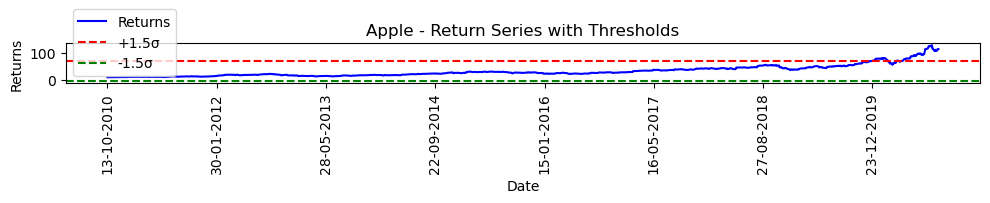

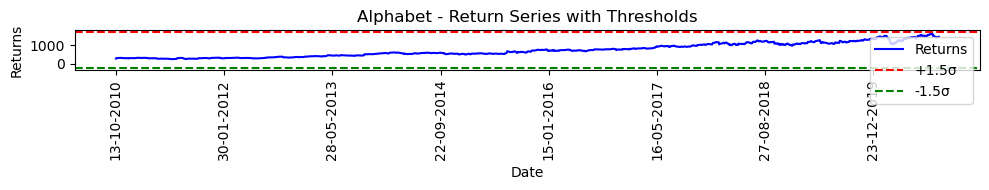

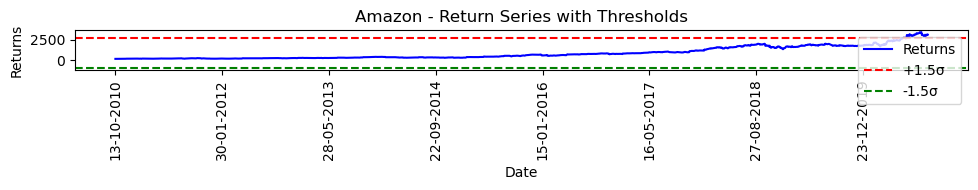

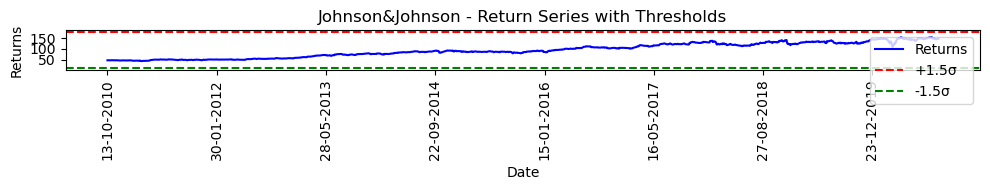

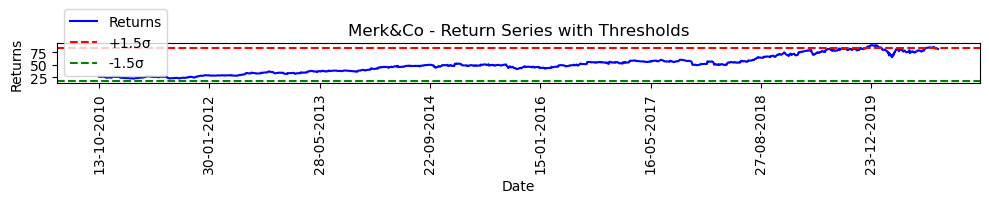

...

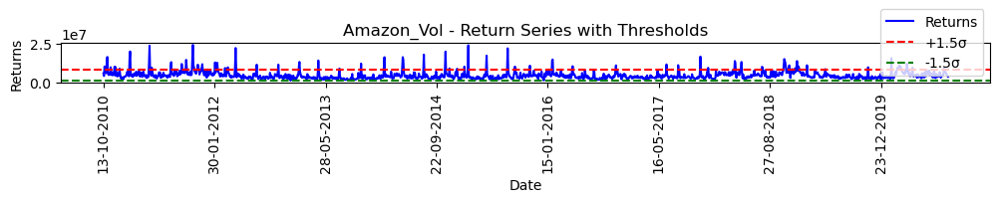

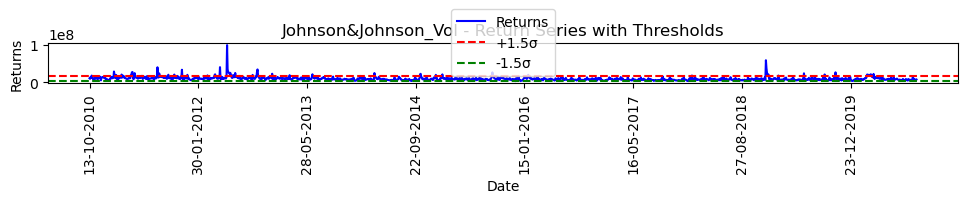

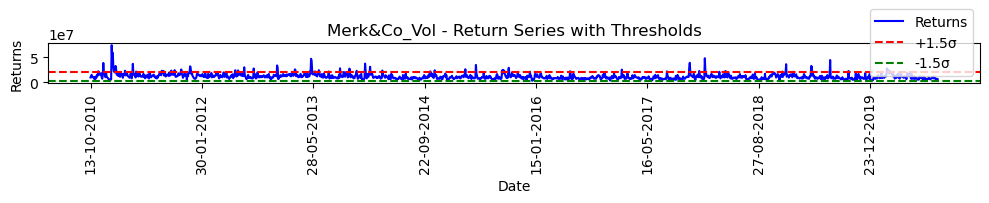

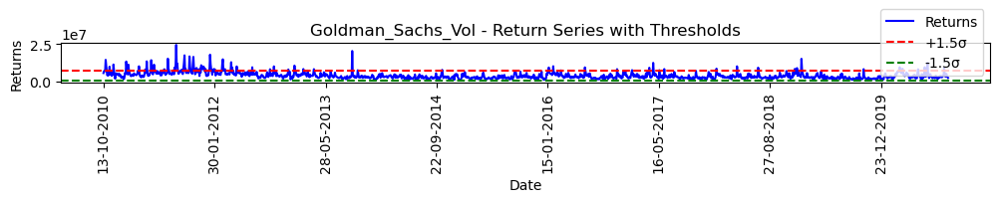

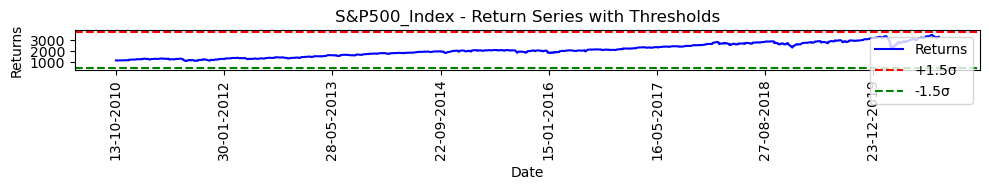

In [137]:
import matplotlib.pyplot as plt

for i in merged_df.columns:
    plt.figure(figsize=(10, 2))
    
    # Plot the returns time series
    merged_df[i].plot(label="Returns", color='blue')
    
    # Calculate thresholds
    mean = merged_df[i].mean()
    std = merged_df[i].std()
    Q1 = merged_df[i].quantile(0.25)
    Q3 = merged_df[i].quantile(0.75)
    IQR = Q3-Q1
    upper = mean + 1.5 * IQR
    lower = mean - 1.5 * IQR

    # Add horizontal lines for thresholds
    plt.axhline(upper, color='red', linestyle='--', label="+1.5σ")
    plt.axhline(lower, color='green', linestyle='--', label="-1.5σ")
    
    # Plot details
    plt.title(f"{i} - Return Series with Thresholds")
    plt.ylabel("Returns")
    plt.xticks(rotation=90)
    plt.legend()
    plt.tight_layout()
    plt.show()

In [138]:
merged_df.columns

Index(['Apple', 'Alphabet', 'Amazon', 'Johnson&Johnson', 'Merk&Co',
       'Goldman_Sachs', 'Portfolio_4', 'Apple_Vol', 'Alphabet_Vol',
       'Amazon_Vol', 'Johnson&Johnson_Vol', 'Merk&Co_Vol', 'Goldman_Sachs_Vol',
       'S&P500_Index'],
      dtype='object')

In [98]:
# # Log transformation of Volume colums in the Data Set
# vol_colums = ['Apple_Vol', 'Alphabet_Vol',
#        'Amazon_Vol', 'Johnson&Johnson_Vol', 'Merk&Co_Vol', 'Goldman_Sachs_Vol']
# for i in vol_colums:
#     merged_df[i] = np.log10(merged_df[i])

In [99]:
# # Convert Non-stationary series by differencing
# merged_df["Apple_Vol_diff"]=merged_df["Apple_Vol"].diff(1)
# merged_df["Alphabet_Vol_diff"]=merged_df["Alphabet_Vol"].diff(1)
# merged_df["Johnson&Johnson_Vol_diff"]=merged_df['Johnson&Johnson_Vol'].diff(1)
# #merged_df['Merk&Co_Vol_diff'] = merged_df['Merk&Co_Vol'].diff(1)
# #merged_df['Goldman_Sachs_Vol_diff'] = merged_df['Goldman_Sachs_Vol'].diff(1)

In [139]:
# diff_cols = ["Apple_Vol_diff","Alphabet_Vol_diff","Johnson&Johnson_Vol_diff"]#'Merk&Co_Vol_diff','Goldman_Sachs_Vol_diff'
# for i in diff_cols:
#     merged_df[i].dropna().plot()
#     plt.show()

In [101]:
# # dropping Apple_Vol & Alphabet_Vol columns
# merged_df.drop(columns = ['Apple_Vol', 'Alphabet_Vol','Johnson&Johnson_Vol'],inplace=True)#,'Merk&Co_Vol','Goldman_Sachs_Vol'

In [102]:
# # replace the outliers with median
# columns = ["Apple_Vol_diff","Alphabet_Vol_diff","Johnson&Johnson_Vol_diff"]#,'Merk&Co_Vol_diff','Goldman_Sachs_Vol_diff'
# for i in columns:
#     Q1 = merged_df[i].quantile(0.25)
#     Q3 = merged_df[i].quantile(0.75)
#     IQR = Q3 - Q1
#     median = merged_df[i].median()

#     lower_bound = Q1 - 1.5 * IQR
#     upper_bound = Q3 + 1.5 * IQR

#     merged_df[i] = merged_df[i].apply(
#         lambda x: median if x < lower_bound or x > upper_bound else x
#     )

In [140]:
# col = ["Apple_Vol_diff","Alphabet_Vol_diff","Johnson&Johnson_Vol_diff"]#,'Merk&Co_Vol_diff','Goldman_Sachs_Vol_diff'
# for i in col:
#     adf = adfuller(merged_df[i].dropna())
#     if adf[1]<0.05:
#         print(f"{i} is stationary")
#     else:
#         print(f"{i} is non-stationary")

In [141]:
# #plot the differenced stationary columns
# diff_cols = ["Apple_Vol_diff","Alphabet_Vol_diff","Johnson&Johnson_Vol_diff"]#,'Merk&Co_Vol_diff','Goldman_Sachs_Vol_diff'
# for i in diff_cols:
#     merged_df[i].dropna().plot()
#     plt.show()

In [142]:
# col =["Apple_Vol_diff","Alphabet_Vol_diff","Johnson&Johnson_Vol_diff"]#,'Merk&Co_Vol_diff','Goldman_Sachs_Vol_diff'
# for i in col:
#     sns.boxplot(merged_df[i])
#     plt.show()

In [143]:
# # replace the outliers with median
# columns = ['Apple', 'Alphabet', 'Amazon', 'Johnson&Johnson', 'Merk&Co',
#        'Goldman_Sachs', 'Portfolio_4','Amazon_Vol',
#        'S&P500_Index']
# for i in columns:
#     Q1 = merged_df[i].quantile(0.25)
#     Q3 = merged_df[i].quantile(0.75)
#     IQR = Q3 - Q1
#     median = merged_df[i].median()

#     lower_bound = Q1 - 1.5 * IQR
#     upper_bound = Q3 + 1.5 * IQR

#     merged_df[i] = merged_df[i].apply(
#         lambda x: median if x < lower_bound or x > upper_bound else x
#     )

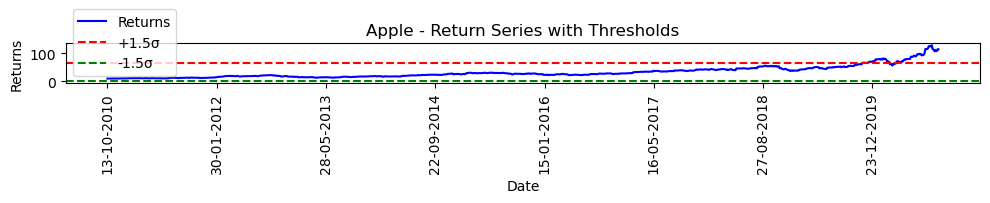

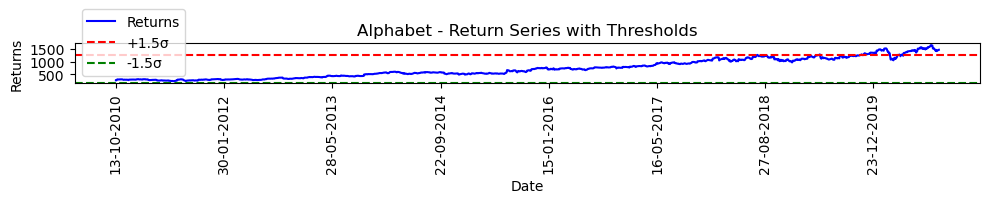

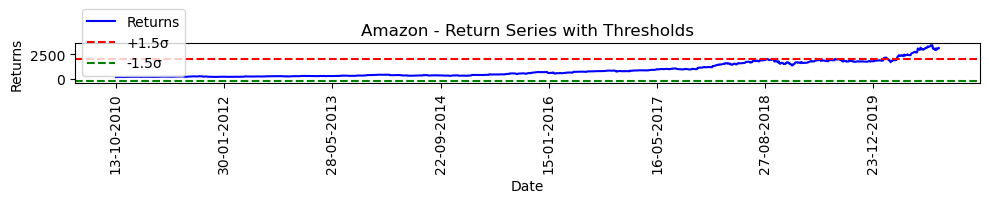

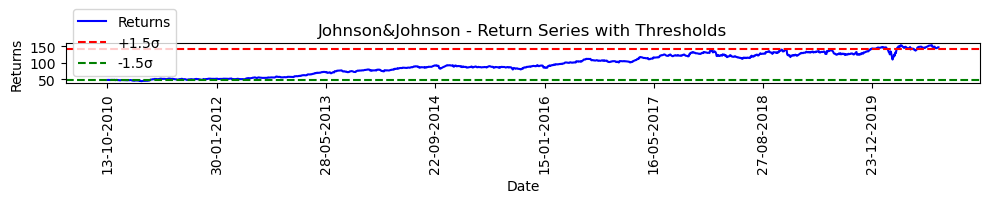

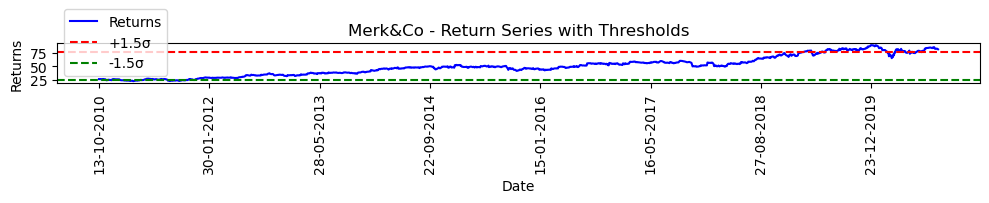

...

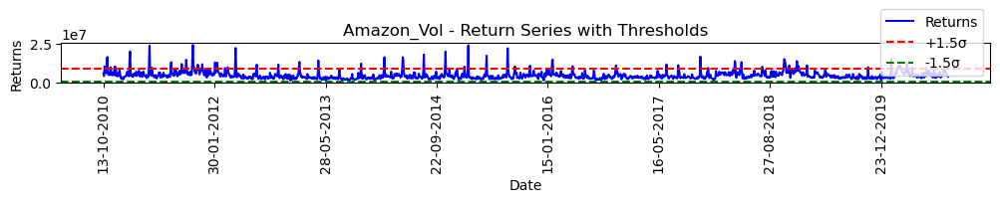

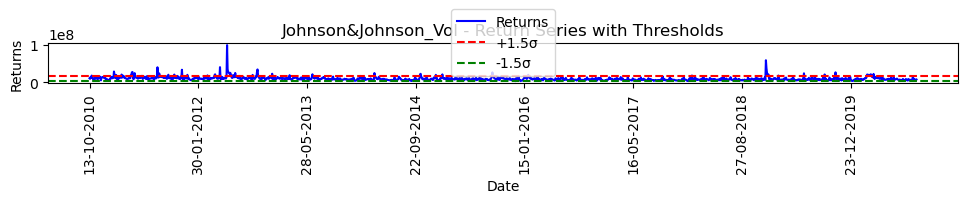

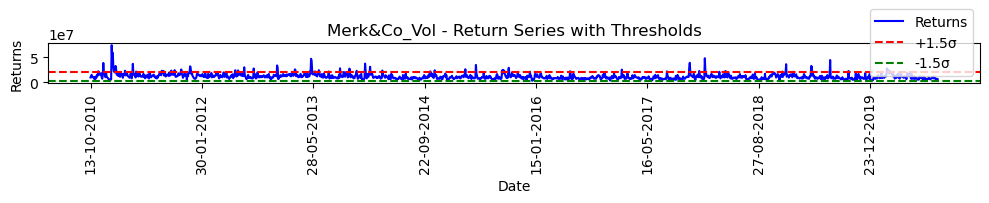

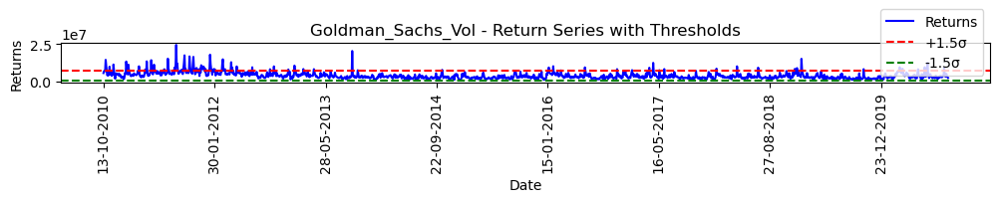

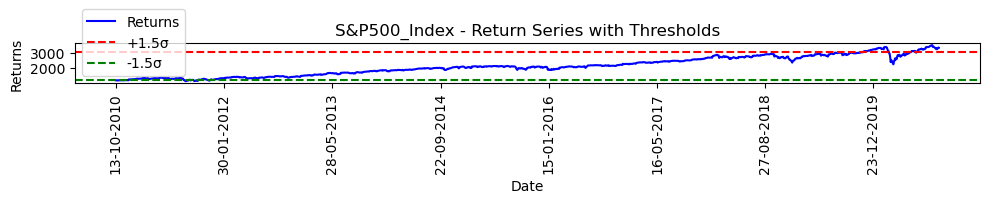

In [144]:
import matplotlib.pyplot as plt

for i in merged_df.columns:
    plt.figure(figsize=(10, 2))
    
    # Plot the returns time series
    merged_df[i].plot(label="Returns", color='blue')
    
    # Calculate thresholds
    mean = merged_df[i].mean()
    std = merged_df[i].std()
    Q1 = merged_df[i].quantile(0.25)
    Q3 = merged_df[i].quantile(0.75)
    IQR = Q3-Q1
    upper = mean + 1.5 * std
    lower = mean - 1.5 * std

    # Add horizontal lines for thresholds
    plt.axhline(upper, color='red', linestyle='--', label="+1.5σ")
    plt.axhline(lower, color='green', linestyle='--', label="-1.5σ")
    
    # Plot details
    plt.title(f"{i} - Return Series with Thresholds")
    plt.ylabel("Returns")
    plt.xticks(rotation=90)
    plt.legend()
    plt.tight_layout()
    plt.show()

In [145]:
merged_df.head()

,Apple,Alphabet,Amazon,Johnson&Johnson,Merk&Co,Goldman_Sachs,Portfolio_4,Apple_Vol,Alphabet_Vol,Amazon_Vol,Johnson&Johnson_Vol,Merk&Co_Vol,Goldman_Sachs_Vol,S&P500_Index
Date,,,,,,,,,,,,,,
13-10-2010,9.262955,270.635590,155.169998,47.332462,26.450895,133.199677,0.000725,630092400,6134000.0,5632800.0,10104700.0,9762300.0,5626200.0,1178.099976
14-10-2010,9.329926,269.455017,155.529999,47.451584,26.443783,130.496597,0.053196,435296400,13317800.0,4024100.0,8632700.0,9544400.0,6891100.0,1173.810059
15-10-2010,9.713540,299.602020,164.639999,47.325027,26.301414,129.721832,0.006688,922194000,29760600.0,10135500.0,13265100.0,15025400.0,6901500.0,1176.189941
18-10-2010,9.814152,307.701660,163.559998,47.540920,26.500723,132.312943,-0.021374,1093010800,14249500.0,6331300.0,10814100.0,10601100.0,6972300.0,1184.709961
19-10-2010,9.551516,302.780121,158.669998,47.116585,25.995331,134.912766,0.002773,1232784000,9210100.0,7525000.0,17235400.0,10372100.0,14491200.0,1165.900024


In [146]:
merged_df.dropna(axis=0,inplace=True)

In [147]:
!pip install arch

In [148]:
# Checking Unitroot of Each Series
from statsmodels.tsa.stattools import adfuller,kpss
from arch.unitroot import PhillipsPerron
for col in merged_df.columns:
    kpss_test = kpss(merged_df[col])
    adf = adfuller(merged_df[col])
    pp_test = PhillipsPerron(merged_df[col])
    print(col)
    print("H0: Series is Stationary")
    print("kpss statistic:%f"% kpss_test[0])
    print("critical_values @ 5%%:%.2f"% kpss_test[3]["5%"])
    print("p-value:",kpss_test[1])

    print("#"*10)
    print("H0: Series is Non-stationary")
    print("adf statistic:%f"% adf[0])
    print("critical_values @ 5%%: %.2f"% adf[4]["5%"])
    print("p-value: %.2f"% adf[1])

    print("-" * 10)
    print("Null Hypothesis: %s" % pp_test.null_hypothesis)
    print("PP Statistic: %f" % pp_test.stat)
    print("Critical Value @ 5%%: %.2f" % pp_test.critical_values["5%"])
    print("p-value: %.4f" % pp_test.pvalue)
    print("*" * 10)

    
    if kpss_test[1]<=0.05:
        print(f"{col} is non-stationary using kpss-test")
    else:
        print(f"{col} is stationary using kpss-test")
    if adf[1]<=0.05:
        print(f"{col} is stationary using adf-test")
    else:
        print(f"{col} is non-stationary using adf-test")
    if pp_test.pvalue<=0.05:
        print(f"{col} is stationary using pp_test")
    else:
        print(f"{col} is non-stationary using pp-test")
    print("="*60)

C:\Users\josev\AppData\Local\Temp\ipykernel_21736\3167811234.py:5: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_test = kpss(merged_df[col])
C:\Users\josev\AppData\Local\Temp\ipykernel_21736\3167811234.py:5: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_test = kpss(merged_df[col])
C:\Users\josev\AppData\Local\Temp\ipykernel_21736\3167811234.py:5: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_test = kpss(merged_df[col])
C:\Users\josev\AppData\Local\Temp\ipykernel_21736\3167811234.py:5: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-valu

Apple
H0: Series is Stationary
kpss statistic:4.536776
critical_values @ 5%:0.46
p-value: 0.01
##########
H0: Series is Non-stationary
adf statistic:2.545832
critical_values @ 5%: -2.86
p-value: 1.00
----------
Null Hypothesis: The process contains a unit root.
PP Statistic: 2.641780
Critical Value @ 5%: -2.86
p-value: 0.9991
**********
Apple is non-stationary using kpss-test
Apple is non-stationary using adf-test
Apple is non-stationary using pp-test
Alphabet
H0: Series is Stationary
kpss statistic:5.730720
critical_values @ 5%:0.46
p-value: 0.01
##########
H0: Series is Non-stationary
adf statistic:-0.039857
critical_values @ 5%: -2.86
p-value: 0.96
----------
Null Hypothesis: The process contains a unit root.
PP Statistic: -0.091632
Critical Value @ 5%: -2.86
p-value: 0.9503
**********
Alphabet is non-stationary using kpss-test
Alphabet is non-stationary using adf-test
Alphabet is non-stationary using pp-test
Amazon
H0: Series is Stationary
kpss statistic:5.068956
critical_values @ 

C:\Users\josev\AppData\Local\Temp\ipykernel_21736\3167811234.py:5: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_test = kpss(merged_df[col])
C:\Users\josev\AppData\Local\Temp\ipykernel_21736\3167811234.py:5: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_test = kpss(merged_df[col])
C:\Users\josev\AppData\Local\Temp\ipykernel_21736\3167811234.py:5: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_test = kpss(merged_df[col])


- From the above unit root tests and plots, it has been confirmed that all the series were stationary

### Hetroskedasticity Related Tests

In [149]:
from statsmodels.stats.diagnostic import het_arch

for col in merged_df.columns:
    arch_test = het_arch(merged_df[col], nlags=12)
    print(f"\nARCH test for {col}")
    print(f"LM Stat: {arch_test[0]:.4f}, p-value: {arch_test[1]:.4f}")


ARCH test for Apple
LM Stat: 1502.2573, p-value: 0.0000

ARCH test for Alphabet
LM Stat: 1503.8482, p-value: 0.0000

ARCH test for Amazon
LM Stat: 1503.6863, p-value: 0.0000

ARCH test for Johnson&Johnson
LM Stat: 1505.1631, p-value: 0.0000

ARCH test for Merk&Co
LM Stat: 1504.9178, p-value: 0.0000

ARCH test for Goldman_Sachs
LM Stat: 1497.7399, p-value: 0.0000

ARCH test for Portfolio_4
LM Stat: 58.4578, p-value: 0.0000

ARCH test for Apple_Vol
LM Stat: 671.2622, p-value: 0.0000

ARCH test for Alphabet_Vol
LM Stat: 301.2622, p-value: 0.0000

ARCH test for Amazon_Vol
LM Stat: 198.6022, p-value: 0.0000

ARCH test for Johnson&Johnson_Vol
LM Stat: 80.2394, p-value: 0.0000

ARCH test for Merk&Co_Vol
LM Stat: 233.2852, p-value: 0.0000

ARCH test for Goldman_Sachs_Vol
LM Stat: 316.5770, p-value: 0.0000

ARCH test for S&P500_Index
LM Stat: 1505.6728, p-value: 0.0000


- From the test it has been found that 'Alphabet', 'Johnson&Johnson','Merk&Co', 'Amazon_Vol', 'Johnson&Johnson_Vol', 'Merk&Co_Vol', 'Goldman_Sachs_Vol', 'Apple_Vol_diff', 'Alphbet_Vol_diff' have hetroskedasticity

- we can not simple use VAR models, but to use VAR GARCH models

In [150]:
merged_df.shape

(1522, 14)

In [151]:
final_df = merged_df.copy()

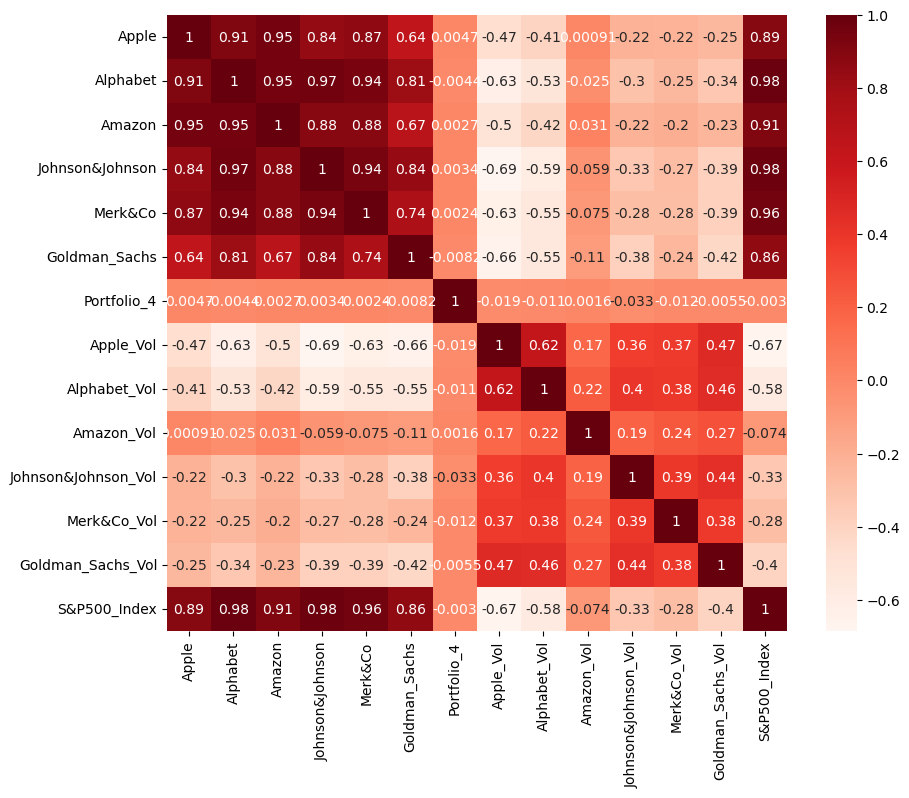

In [152]:
plt.figure(figsize=(10, 8))
sns.heatmap(final_df.corr(), annot=True, cmap='Reds')
plt.show()

### Time Series Decomposition

In [153]:
portfolio.columns
portfolio_price = prices[portfolio.columns]

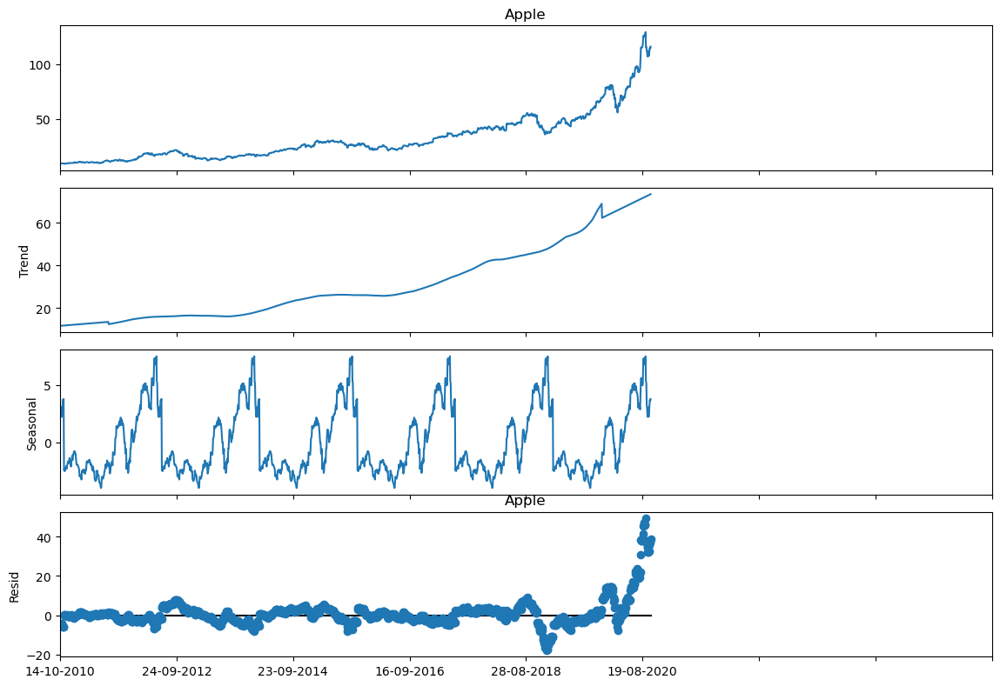

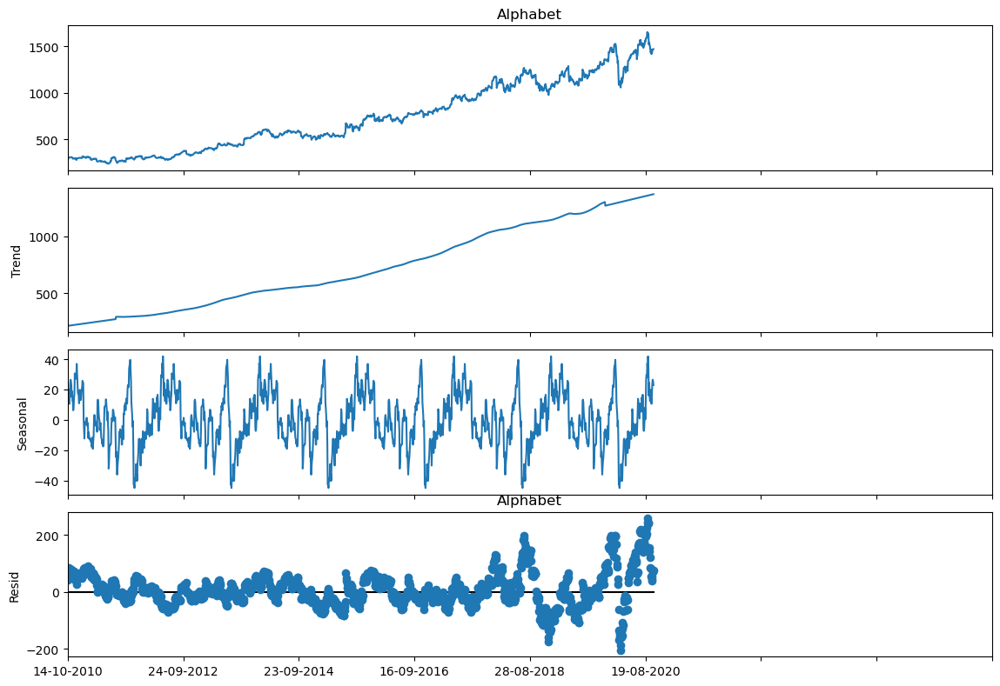

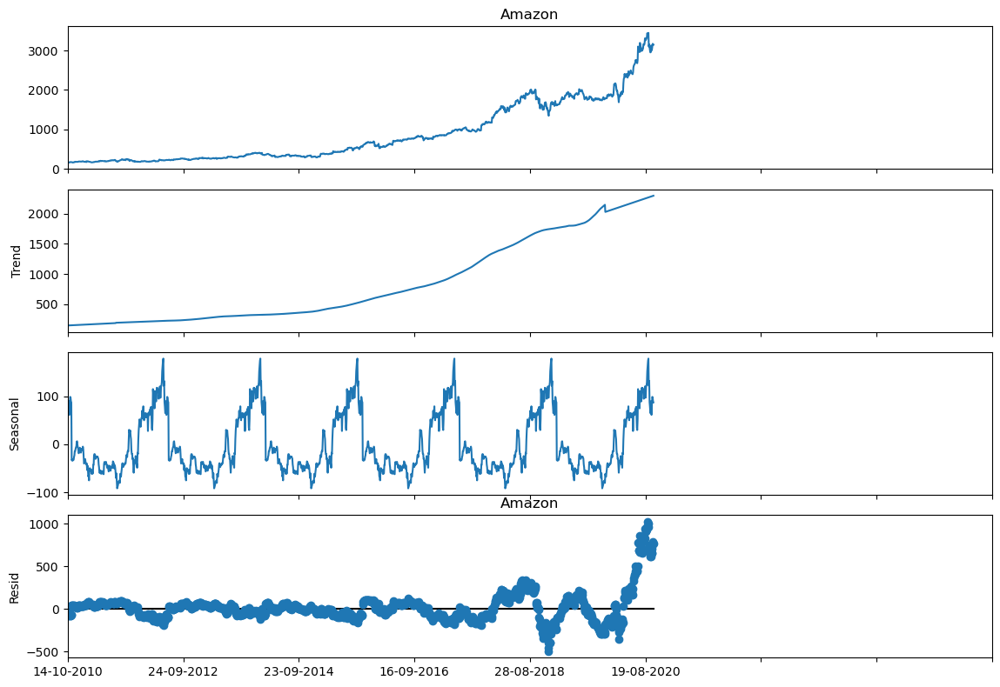

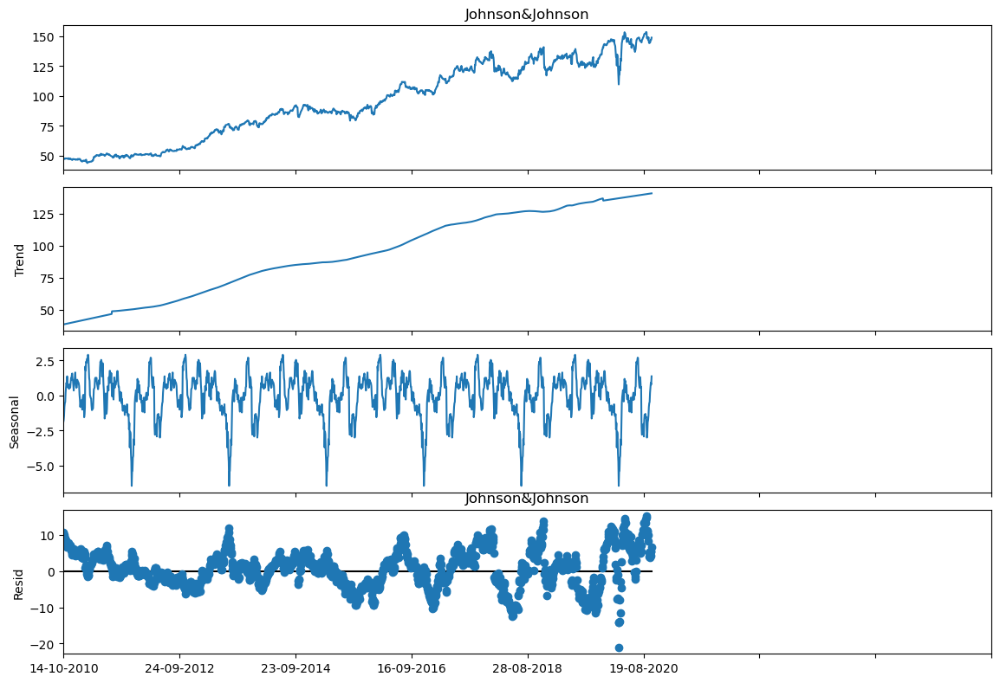

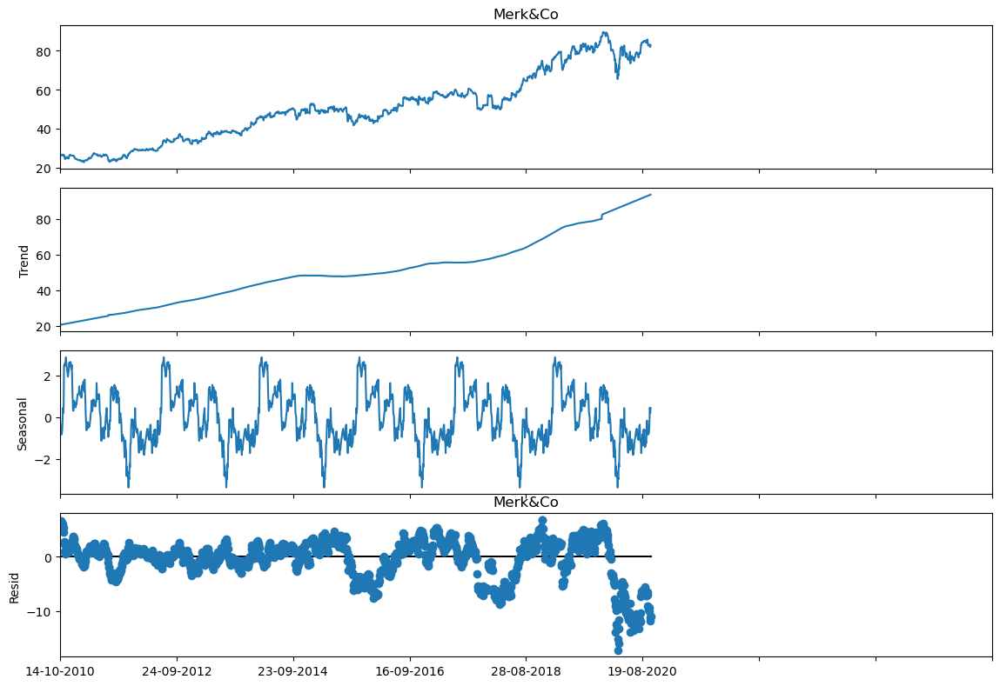

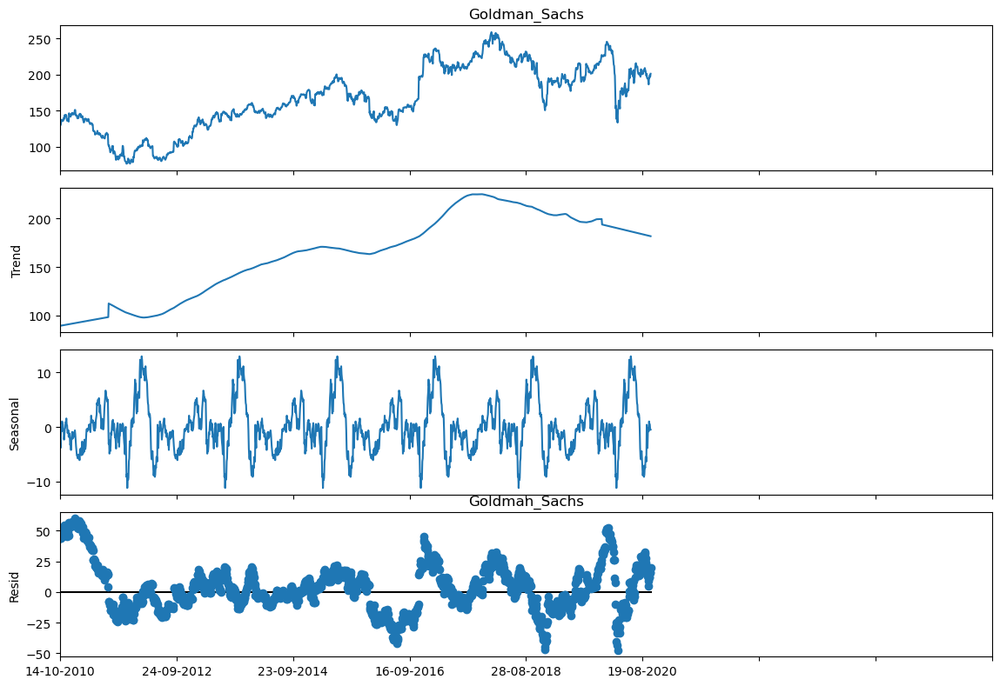

In [155]:
import statsmodels.api as sm
import matplotlib.pyplot as plt
import numpy as np
from pylab import rcParams
for i in portfolio_price.columns:
    plt.subplot(3,2,i+1)
    rcParams['figure.figsize'] = 12, 8
    decomposition = sm.tsa.seasonal_decompose(portfolio_price[i], model='additive',extrapolate_trend='freq', period=252) # additive seasonal index
    fig = decomposition.plot()
    plt.title(i)
    plt.xticks(np.arange(1, 2518, step=300))
    plt.show()

C:\Users\josev\AppData\Local\Temp\ipykernel_21736\593492055.py:8: UserWarning: Parsing dates in %d-%m-%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  portfolio_price.index = pd.to_datetime(portfolio_price.index)


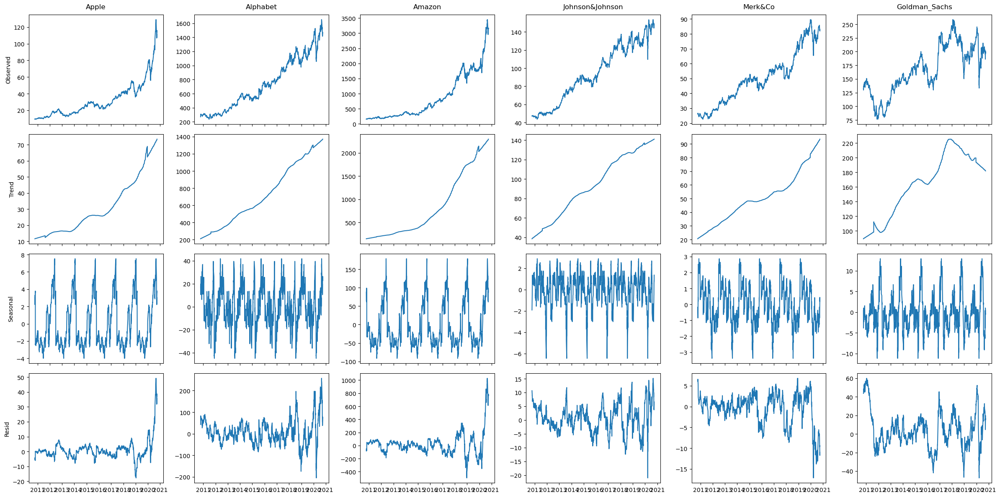

In [242]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
import matplotlib.dates as mdates

# --- Make sure index is datetime, otherwise seasonal_decompose complains ---
portfolio_price.index = pd.to_datetime(portfolio_price.index)
period = 252                     # trading days in a year
n_assets = len(portfolio_price.columns)

fig, axes = plt.subplots(
    nrows=4,                     # observed / trend / seasonal / resid
    ncols=n_assets,
    figsize=(4 * n_assets, 12),
    sharex='col'
)

components = ['observed', 'trend', 'seasonal', 'resid']

for col_idx, col_name in enumerate(portfolio_price.columns):
    result = sm.tsa.seasonal_decompose(
        portfolio_price[col_name],
        model='additive',
        period=period,
        extrapolate_trend='freq'
    )

    for row_idx, comp in enumerate(components):
        ax = axes[row_idx, col_idx]
        ax.plot(getattr(result, comp))
        if row_idx == 0:                       # top row
            ax.set_title(col_name, fontsize=12, pad=10)
        if col_idx == 0:                      # leftmost column
            ax.set_ylabel(comp.capitalize())

        # nice yearly ticks
        ax.xaxis.set_major_locator(mdates.YearLocator())
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

plt.tight_layout()
plt.show()

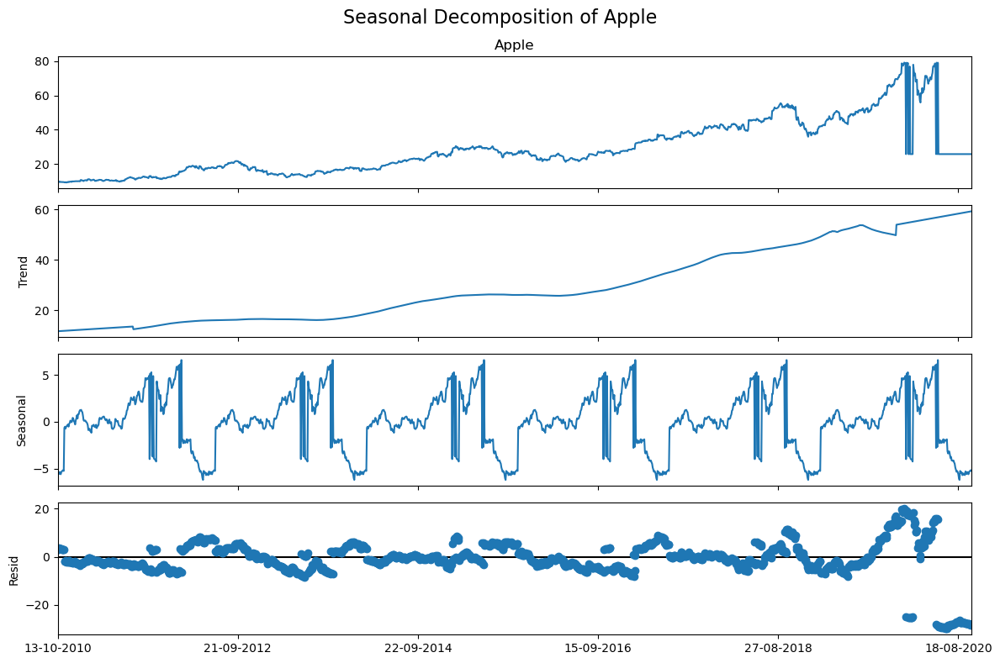

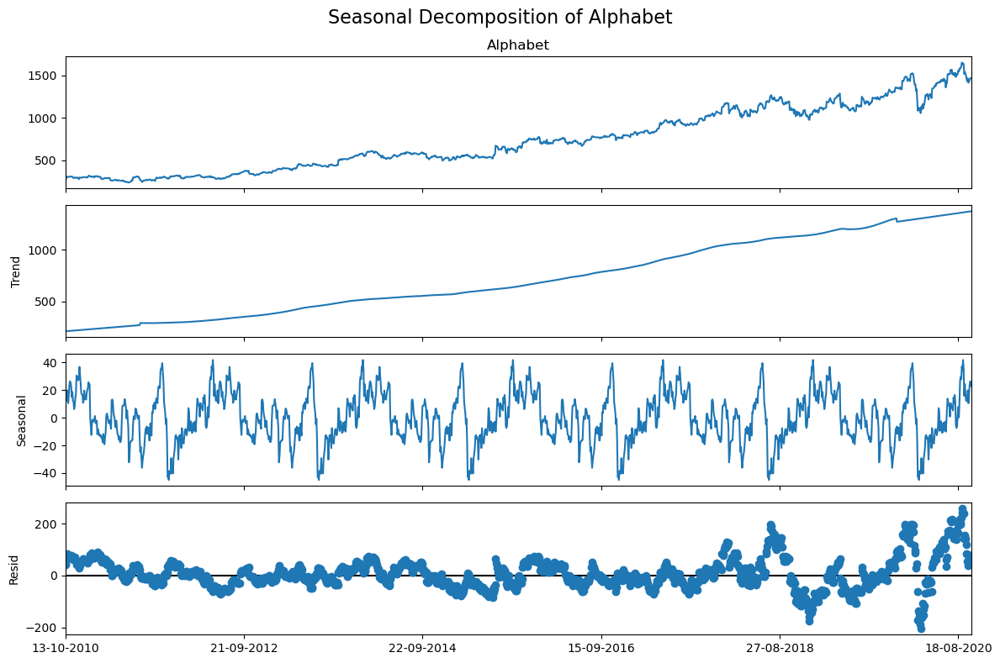

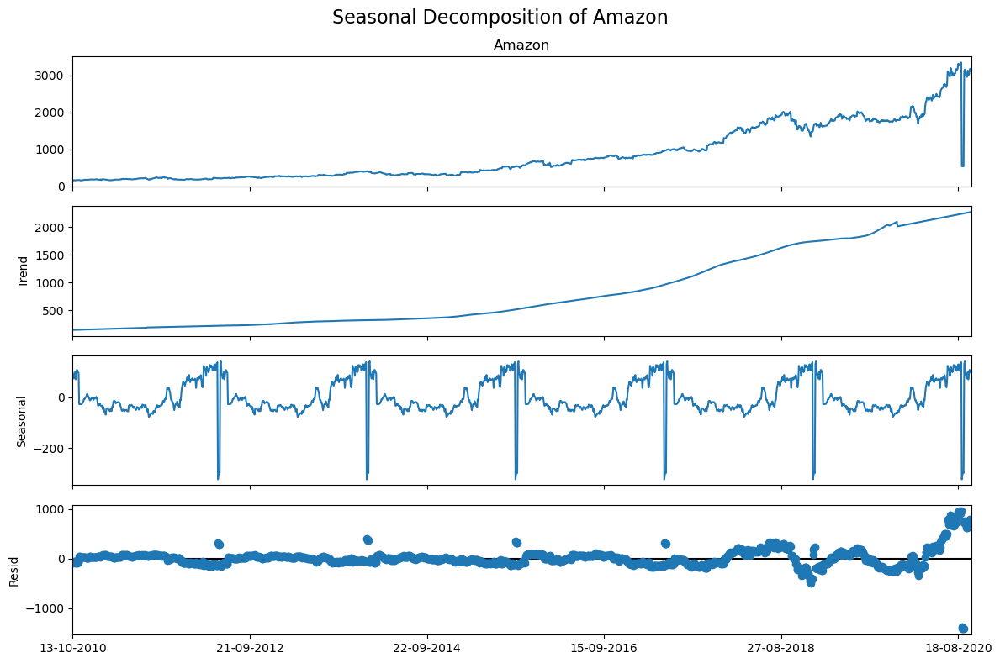

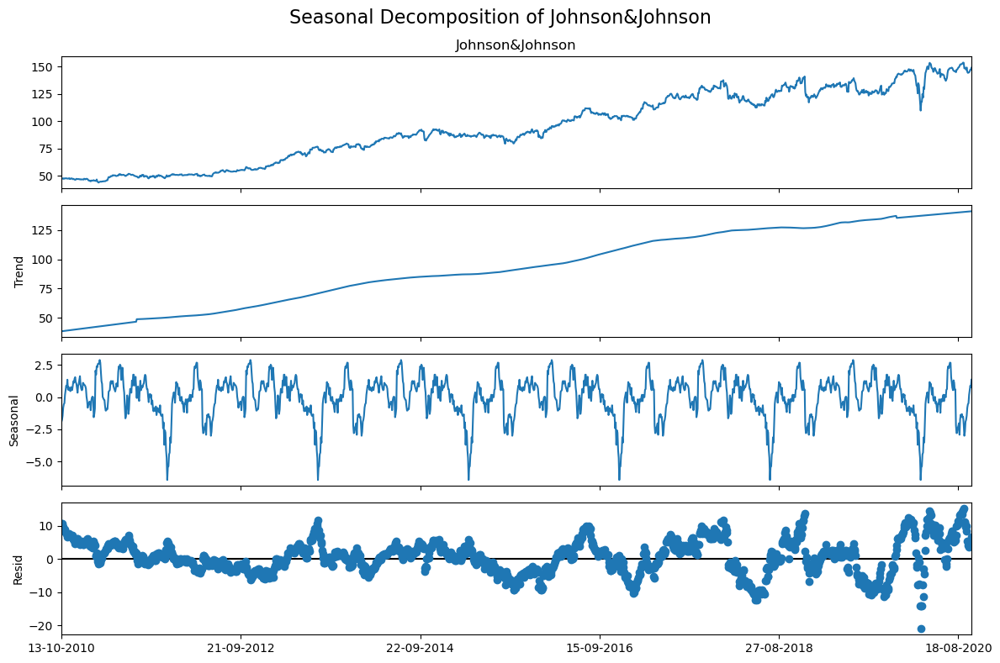

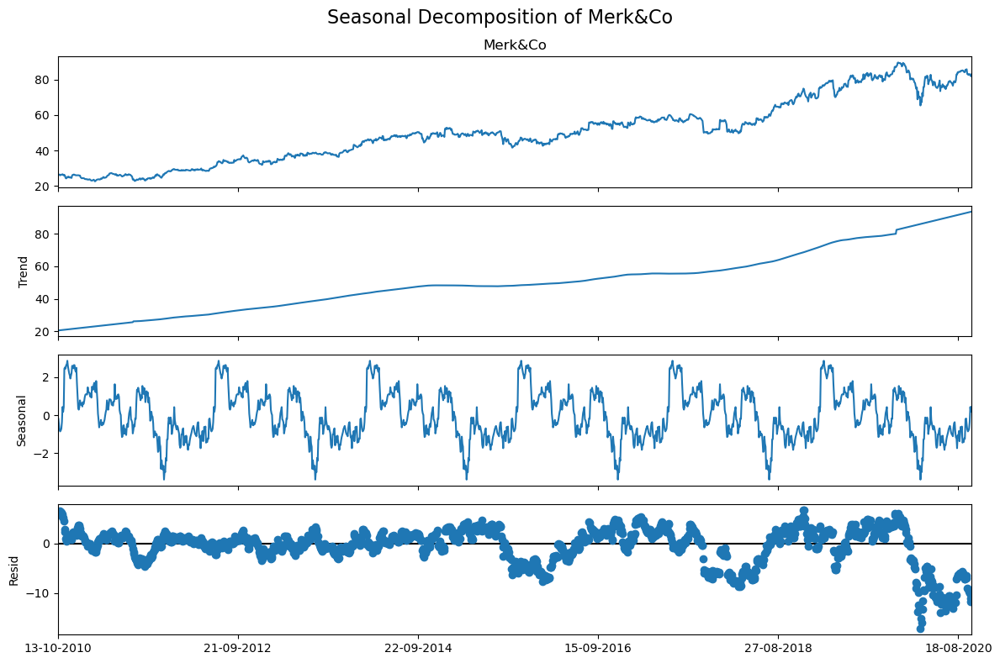

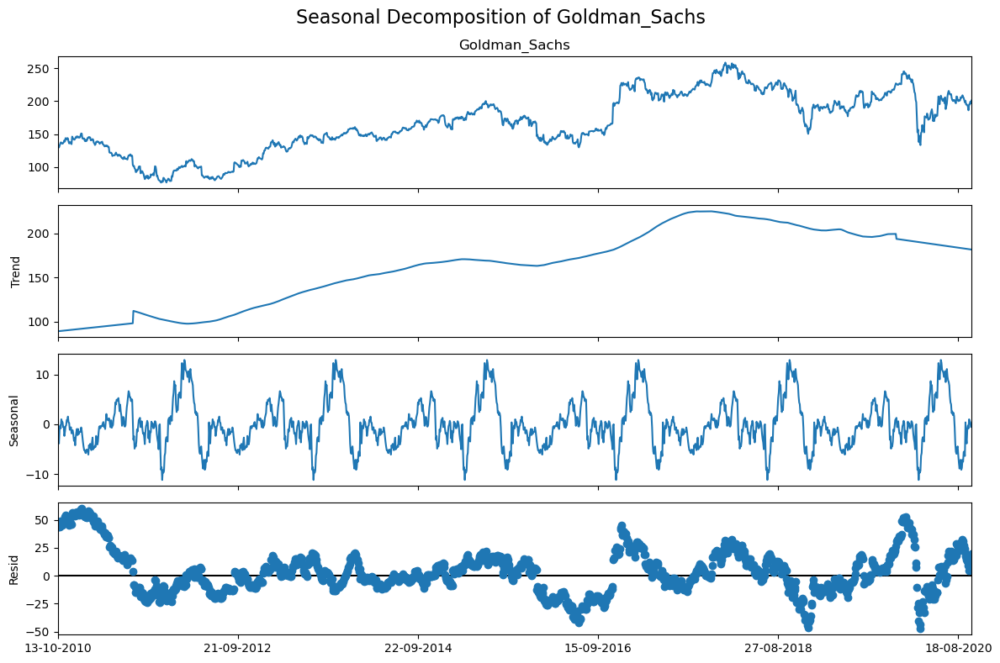

In [154]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt
from pylab import rcParams
import numpy as np

rcParams['figure.figsize'] = 12, 8

for i in portfolio_price.columns:
    series = portfolio_price[i].dropna()  # drop NA values for safe decomposition

    try:
        decomposition = seasonal_decompose(
            series,
            model='additive',
            period=252,  # roughly 1 trading year
            extrapolate_trend='freq'
        )

        fig = decomposition.plot()
        plt.suptitle(f"Seasonal Decomposition of {i}", fontsize=16)
        plt.xticks(np.arange(0, len(series), step=300))
        plt.tight_layout()
        plt.show()

    except ValueError as e:
        print(f"Skipping {i} due to error: {e}")

### Train - Test Split

In [156]:
# Keeping 70% values as train
train_len = int(portfolio_price.shape[0]*0.7)
test_len = int(portfolio_price.shape[0]) - int(portfolio_price.shape[0]*0.7)

# Train data
train_data = portfolio_price[:train_len] 

# Test data
test_data = portfolio_price[train_len:]

#### Holts method with trend

In [157]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error
import numpy as np
import matplotlib.pyplot as plt

C:\Users\josev\AppData\Local\Temp\ipykernel_21736\3294248986.py:10: FutureWarning: the 'smoothing_slope' keyword is deprecated, use 'smoothing_trend' instead.
  model_fit = model.fit(smoothing_level=0.2, smoothing_slope=0.01, optimized=False)



Model Parameters for Apple:
{'smoothing_level': 0.2, 'smoothing_trend': 0.01, 'smoothing_seasonal': None, 'damping_trend': nan, 'initial_level': 9.475820533333328, 'initial_trend': 0.010502612121212701, 'initial_seasons': array([], dtype=float64), 'use_boxcox': False, 'lamda': None, 'remove_bias': False} 

RMSE for Apple: 18.06
MAPE for Apple: 14.68%



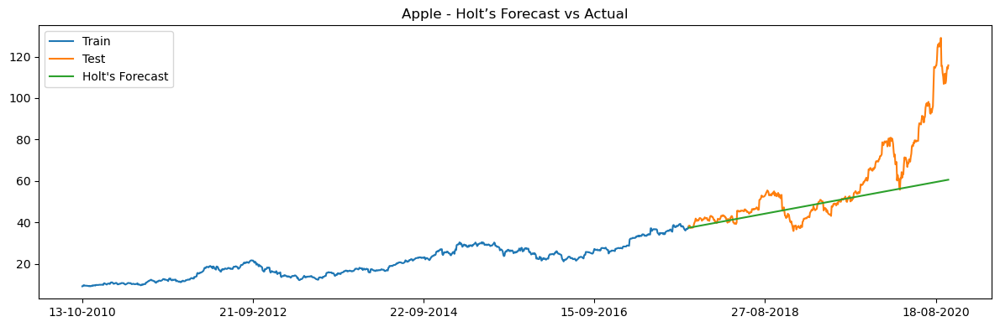

C:\Users\josev\AppData\Local\Temp\ipykernel_21736\3294248986.py:10: FutureWarning: the 'smoothing_slope' keyword is deprecated, use 'smoothing_trend' instead.
  model_fit = model.fit(smoothing_level=0.2, smoothing_slope=0.01, optimized=False)



Model Parameters for Alphabet:
{'smoothing_level': 0.2, 'smoothing_trend': 0.01, 'smoothing_seasonal': None, 'damping_trend': nan, 'initial_level': 277.1508423999998, 'initial_trend': 3.7588794727272936, 'initial_seasons': array([], dtype=float64), 'use_boxcox': False, 'lamda': None, 'remove_bias': False} 

RMSE for Alphabet: 98.19
MAPE for Alphabet: 6.62%



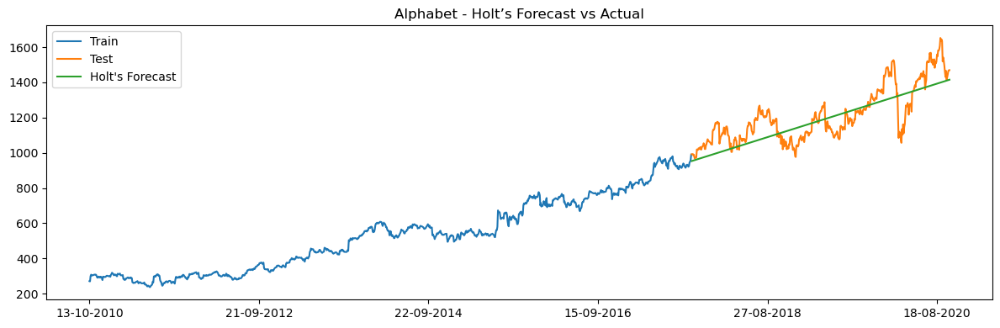

C:\Users\josev\AppData\Local\Temp\ipykernel_21736\3294248986.py:10: FutureWarning: the 'smoothing_slope' keyword is deprecated, use 'smoothing_trend' instead.
  model_fit = model.fit(smoothing_level=0.2, smoothing_slope=0.01, optimized=False)



Model Parameters for Amazon:
{'smoothing_level': 0.2, 'smoothing_trend': 0.01, 'smoothing_seasonal': None, 'damping_trend': nan, 'initial_level': 154.46266473333324, 'initial_trend': 1.5393335575757687, 'initial_seasons': array([], dtype=float64), 'use_boxcox': False, 'lamda': None, 'remove_bias': False} 

RMSE for Amazon: 777.68
MAPE for Amazon: 32.73%



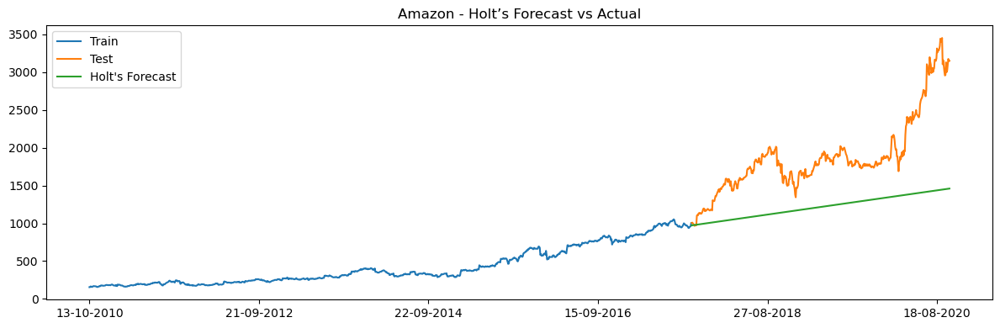

C:\Users\josev\AppData\Local\Temp\ipykernel_21736\3294248986.py:10: FutureWarning: the 'smoothing_slope' keyword is deprecated, use 'smoothing_trend' instead.
  model_fit = model.fit(smoothing_level=0.2, smoothing_slope=0.01, optimized=False)



Model Parameters for Johnson&Johnson:
{'smoothing_level': 0.2, 'smoothing_trend': 0.01, 'smoothing_seasonal': None, 'damping_trend': nan, 'initial_level': 47.294251599999974, 'initial_trend': 0.02671076363636704, 'initial_seasons': array([], dtype=float64), 'use_boxcox': False, 'lamda': None, 'remove_bias': False} 

RMSE for Johnson&Johnson: 16.19
MAPE for Johnson&Johnson: 10.99%



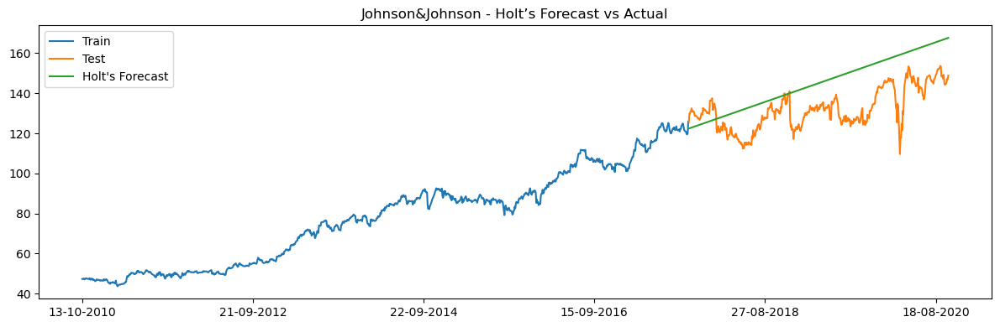

C:\Users\josev\AppData\Local\Temp\ipykernel_21736\3294248986.py:10: FutureWarning: the 'smoothing_slope' keyword is deprecated, use 'smoothing_trend' instead.
  model_fit = model.fit(smoothing_level=0.2, smoothing_slope=0.01, optimized=False)



Model Parameters for Merk&Co:
{'smoothing_level': 0.2, 'smoothing_trend': 0.01, 'smoothing_seasonal': None, 'damping_trend': nan, 'initial_level': 26.340802333333315, 'initial_trend': 0.008239593939395495, 'initial_seasons': array([], dtype=float64), 'use_boxcox': False, 'lamda': None, 'remove_bias': False} 

RMSE for Merk&Co: 9.04
MAPE for Merk&Co: 11.17%



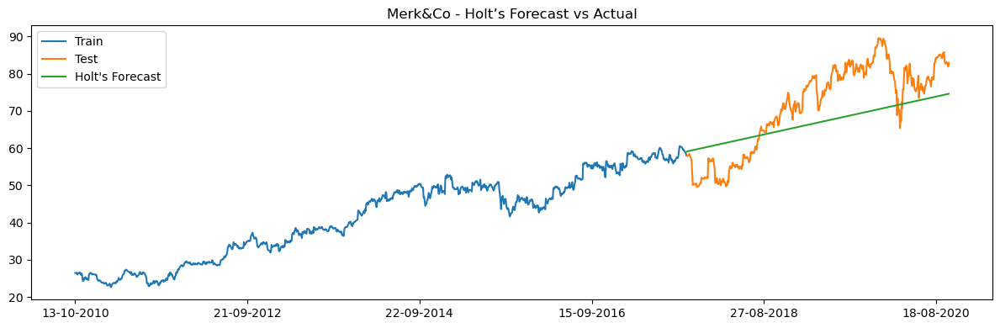

C:\Users\josev\AppData\Local\Temp\ipykernel_21736\3294248986.py:10: FutureWarning: the 'smoothing_slope' keyword is deprecated, use 'smoothing_trend' instead.
  model_fit = model.fit(smoothing_level=0.2, smoothing_slope=0.01, optimized=False)



Model Parameters for Goldman_Sachs:
{'smoothing_level': 0.2, 'smoothing_trend': 0.01, 'smoothing_seasonal': None, 'damping_trend': nan, 'initial_level': 130.60963766666657, 'initial_trend': 0.6660952242424327, 'initial_seasons': array([], dtype=float64), 'use_boxcox': False, 'lamda': None, 'remove_bias': False} 

RMSE for Goldman_Sachs: 77.74
MAPE for Goldman_Sachs: 34.09%



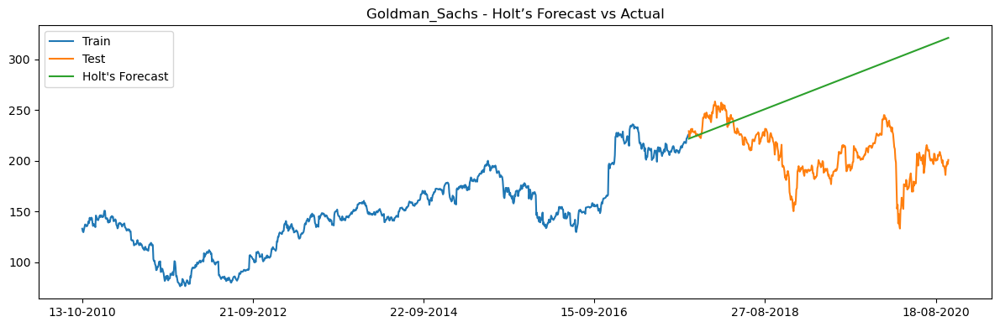

In [158]:
for i in portfolio_price.columns:
    try:
        # Convert to array and fit the model
        model = ExponentialSmoothing(
            np.asarray(train_data[i]), 
            seasonal_periods=252, 
            trend='additive', 
            seasonal=None
        )
        model_fit = model.fit(smoothing_level=0.2, smoothing_slope=0.01, optimized=False)

        print(f"\nModel Parameters for {i}:")
        print(model_fit.params, "\n")

        # Forecast
        y_hat_holt = test_data[[i]].copy()
        y_hat_holt['holt_forecast'] = model_fit.forecast(len(test_data))

        # Evaluation
        rmse = np.sqrt(mean_squared_error(test_data[i], y_hat_holt['holt_forecast'])).round(2)
        mape = np.round(np.mean(np.abs(test_data[i] - y_hat_holt['holt_forecast']) / test_data[i]) * 100, 2)

        print(f"RMSE for {i}: {rmse}")
        print(f"MAPE for {i}: {mape}%\n")

        # Plotting
        plt.figure(figsize=(12, 4))
        plt.plot(train_data[i], label='Train')
        plt.plot(test_data[i], label='Test')
        plt.plot(y_hat_holt['holt_forecast'], label="Holt's Forecast")
        plt.legend(loc='best')
        plt.title(f"{i} - Holt’s Forecast vs Actual")
        plt.xticks(np.arange(0, len(train_data) + len(test_data), step=300))
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Error processing {i}: {e}")

### Holt-Winters Method Trend with Seasonality

C:\AnacondaNew2024\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:903: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


RMSE - Apple: 22.71
MAPE - Apple: 20.22%



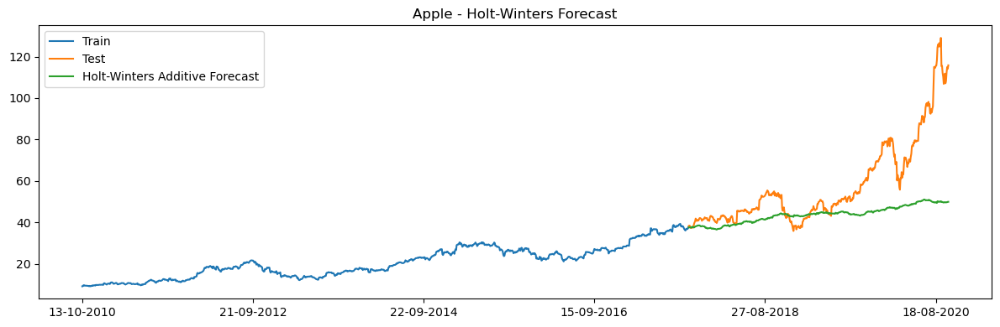

C:\AnacondaNew2024\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:903: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


RMSE - Alphabet: 137.02
MAPE - Alphabet: 8.43%



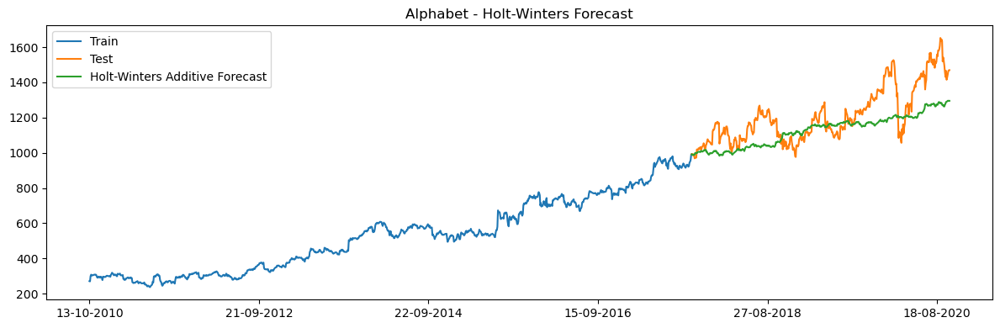

C:\AnacondaNew2024\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:903: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


RMSE - Amazon: 790.48
MAPE - Amazon: 32.75%



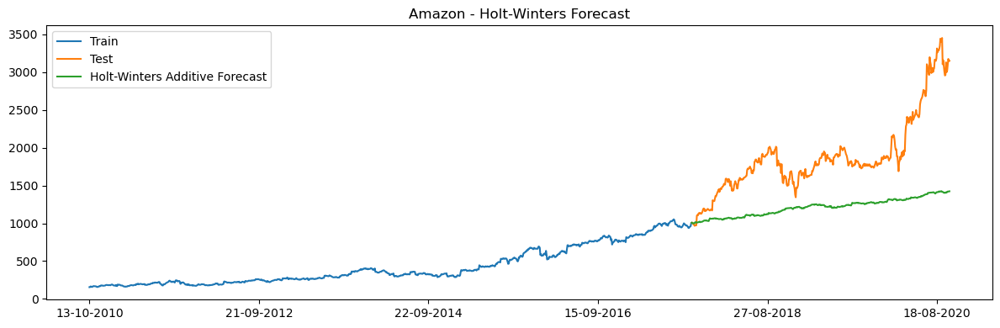

C:\AnacondaNew2024\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:903: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


RMSE - Johnson&Johnson: 11.2
MAPE - Johnson&Johnson: 7.06%



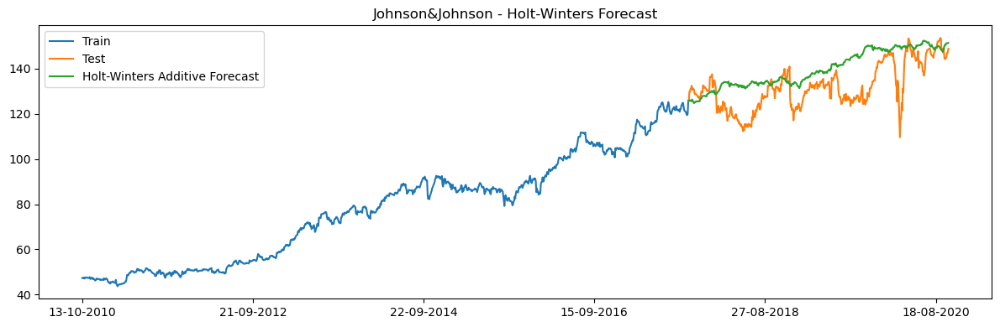

C:\AnacondaNew2024\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:903: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


RMSE - Merk&Co: 11.19
MAPE - Merk&Co: 13.26%



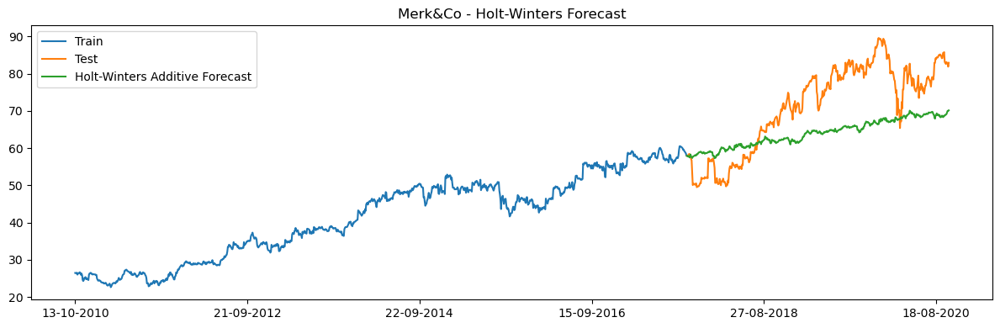

C:\AnacondaNew2024\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:903: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


RMSE - Goldman_Sachs: 73.8
MAPE - Goldman_Sachs: 32.62%



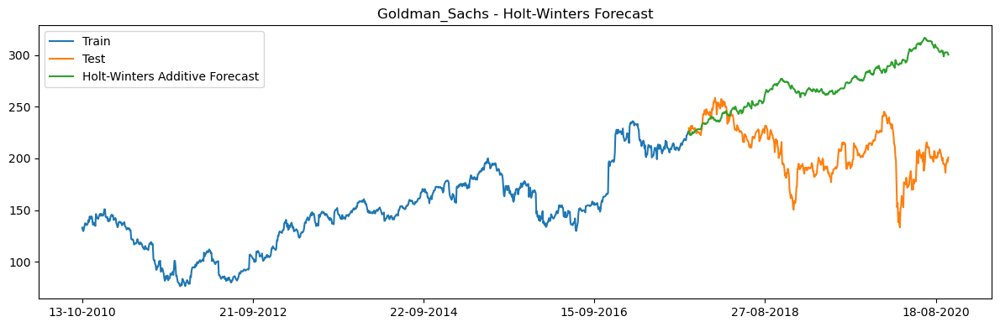

In [159]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error
import numpy as np
import matplotlib.pyplot as plt

for i in portfolio_price.columns:
    try:
        y_hat_hwa = test_data[[i]].copy()  # safer indexing
        
        # Define and fit the model
        model = ExponentialSmoothing(
            np.asarray(train_data[i]),
            seasonal_periods=252,
            trend='add',
            seasonal='add'
        )
        model_fit = model.fit(optimized=True)

        # Forecast
        y_hat_hwa['hw_forecast'] = model_fit.forecast(len(test_data))

        # Evaluation metrics
        rmse = np.sqrt(mean_squared_error(test_data[i], y_hat_hwa['hw_forecast'])).round(2)
        mape = np.round(np.mean(np.abs(test_data[i] - y_hat_hwa['hw_forecast']) / test_data[i]) * 100, 2)

        print(f"RMSE - {i}: {rmse}")
        print(f"MAPE - {i}: {mape}%\n")

        # Plot
        plt.figure(figsize=(12, 4))
        plt.plot(train_data[i], label='Train')
        plt.plot(test_data[i], label='Test')
        plt.plot(y_hat_hwa['hw_forecast'], label="Holt-Winters Additive Forecast")
        plt.legend(loc='best')
        plt.xticks(np.arange(0, len(train_data) + len(test_data), step=300))
        plt.title(f"{i} - Holt-Winters Forecast")
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Error processing {i}: {e}")

## VAR Modelling

In [160]:
# Fitting the VAR model to the data
from statsmodels.tsa.api import VAR

model = VAR(train_data)

C:\AnacondaNew2024\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:559: UserWarning: Parsing dates in %d-%m-%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  _index = to_datetime(index)
C:\AnacondaNew2024\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [161]:
# To select the lag order
x = model.select_order(maxlags=50)
x.summary()

,AIC,BIC,FPE,HQIC
0,32.63,32.66,1.482e+14,32.64
1,7.361*,7.565*,1574.*,7.439*
2,7.395,7.773,1628.,7.539
3,7.434,7.986,1692.,7.643
4,7.470,8.197,1755.,7.746
5,7.509,8.410,1824.,7.851
6,7.532,8.608,1868.,7.941
7,7.560,8.811,1921.,8.035
8,7.605,9.030,2009.,8.146
9,7.658,9.257,2119.,8.266


In [162]:
# Providing maxlags as 1 (minimum AIC vaue)
results = model.fit(maxlags = 1, ic = 'aic')

In [163]:
# Printing the results - Evaluation parameters, lag coefficients, etc.
results.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 21, Jul, 2025
Time:                     00:48:01
--------------------------------------------------------------------
No. of Equations:         6.00000    BIC:                    7.38842
Nobs:                     1065.00    HQIC:                   7.26667
Log likelihood:          -12855.0    FPE:                    1329.28
AIC:                      7.19239    Det(Omega_mle):         1278.05
--------------------------------------------------------------------
Results for equation Apple
                        coefficient       std. error           t-stat            prob
-------------------------------------------------------------------------------------
const                     -0.087623         0.072278           -1.212           0.225
L1.Apple                   0.992641         0.004537          218.793           0.000
L1.Alphabet               -0.000795     

In [164]:
# Forecasting using the VAR model
# Selecting the lag value from the above results
lag_order = 1

In [165]:
# Obtaining the forecast values
predicted = results.forecast(train_data.values[-lag_order:], test_len)
forecast = pd.DataFrame(predicted, index = portfolio_price.index[train_len:], columns = portfolio_price.columns)

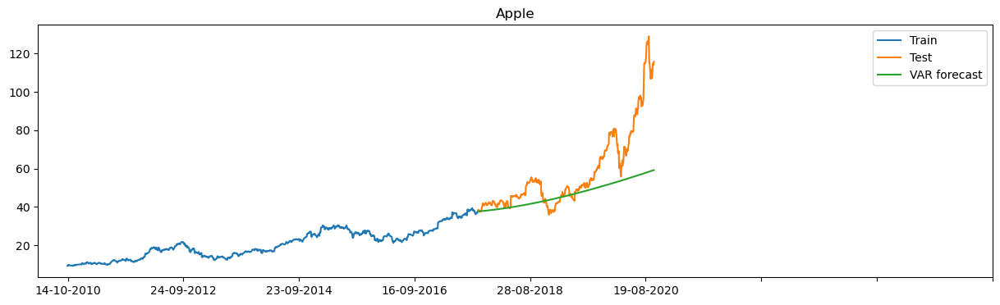

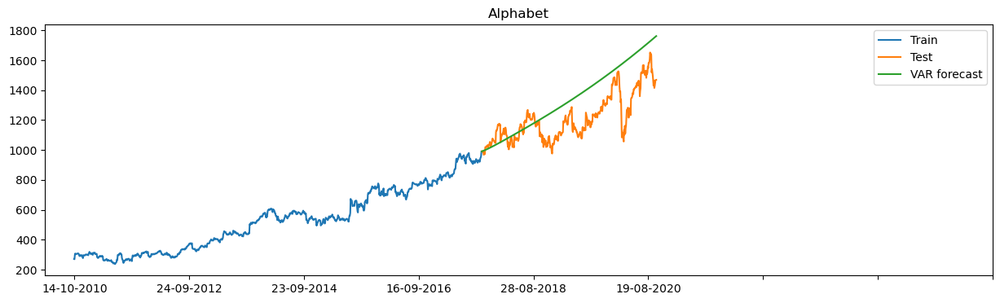

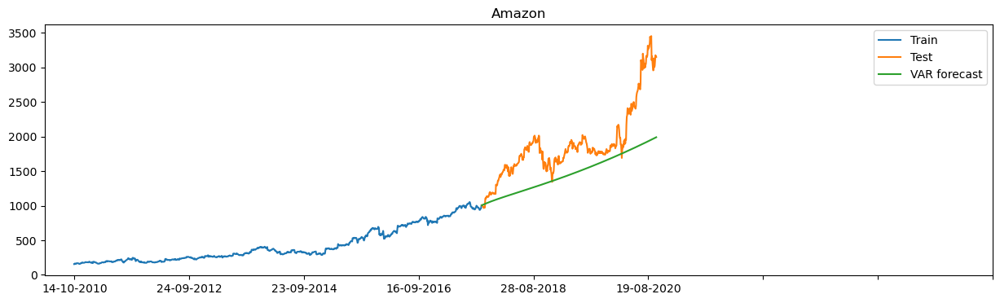

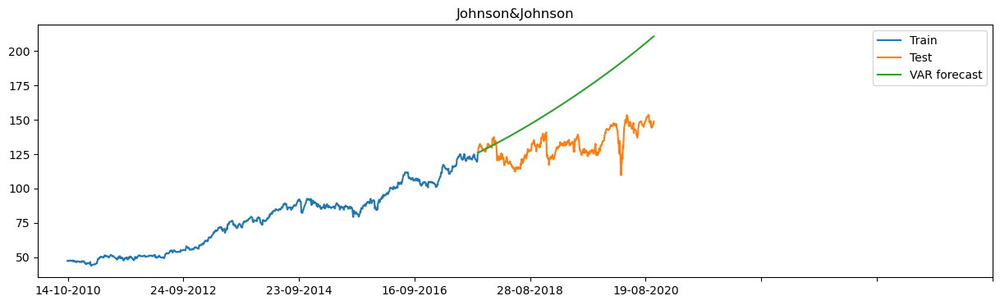

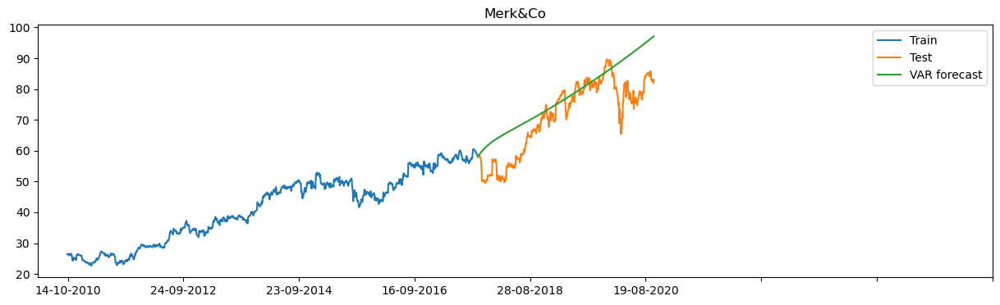

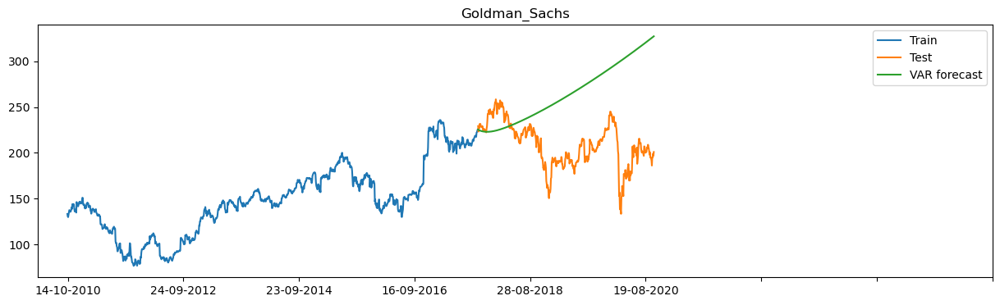

In [166]:
# Printing the train, test and forecasted values
for col in portfolio_price.columns:
    plt.figure(figsize=(15,4))
    plt.plot(portfolio_price[col][:train_len], label='Train')
    plt.plot(portfolio_price[col][train_len:], label='Test')
    plt.plot(forecast[col][:], label='VAR forecast')
    plt.legend(loc='best')
    plt.xticks(np.arange(1, 2518, step=300))
    plt.title(col)
    plt.show()

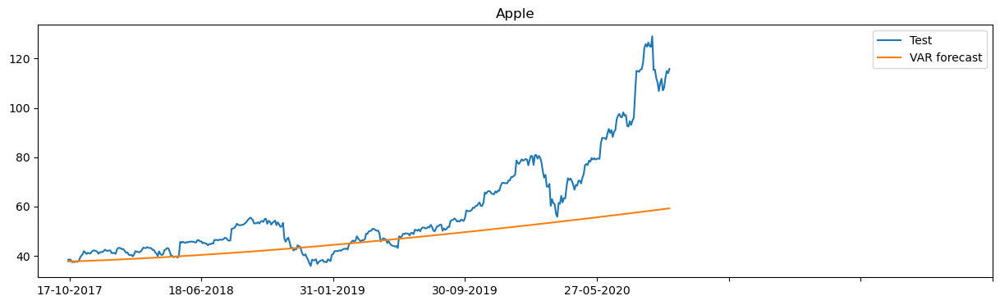

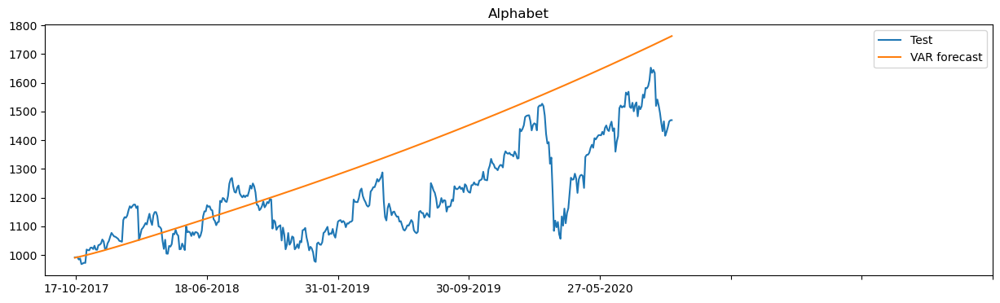

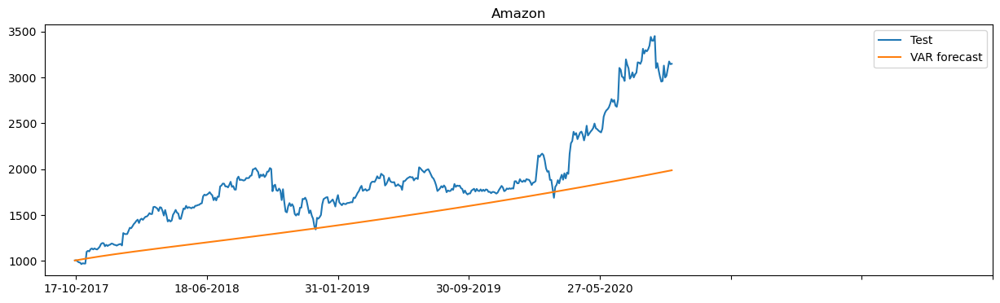

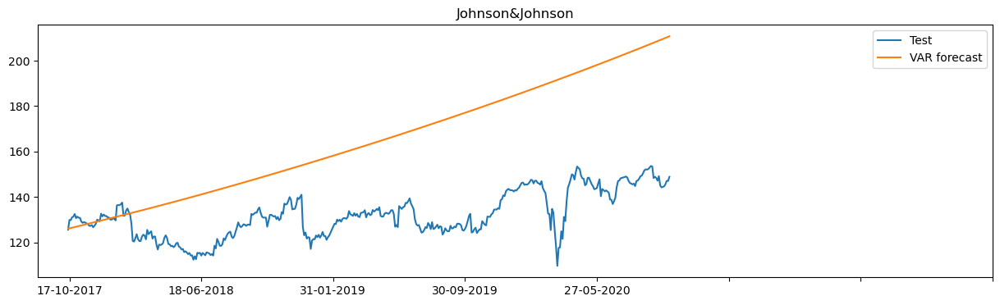

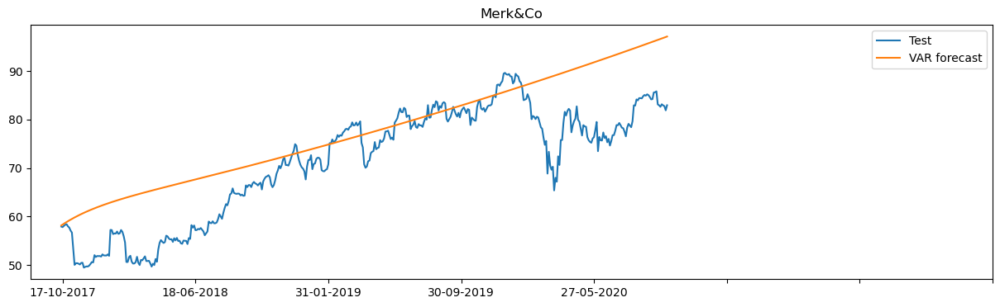

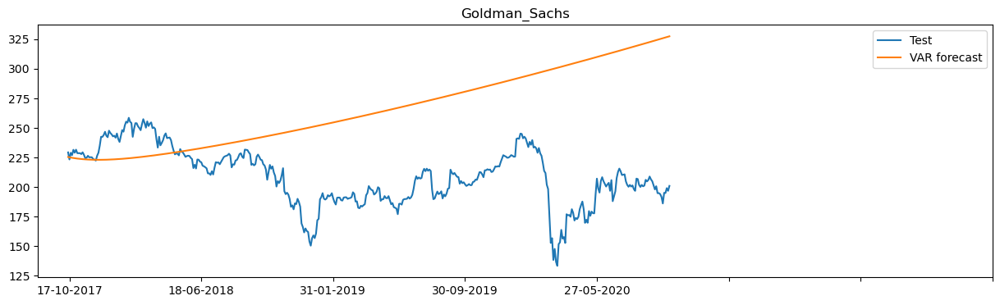

In [167]:
# Comparing the test and forecasted values
for col in portfolio_price.columns:
    plt.figure(figsize=(15,4))
    plt.plot(portfolio_price[col][train_len:], label='Test')
    plt.plot(forecast[col][:], label='VAR forecast')
    plt.legend(loc='best')
    plt.title(col)
    plt.xticks(np.arange(1, 800, step=100))
    plt.show()

In [168]:
# Model Evaluation
from sklearn.metrics import mean_squared_error

eval_results = pd.DataFrame(columns=['Column', 'RMSE', 'MAPE'])
tempResults = pd.DataFrame(columns=['Column', 'RMSE', 'MAPE'])

for col in portfolio_price.columns:
    rmse = np.sqrt(mean_squared_error(test_data[col], forecast[col][:])).round(2)
    mape = np.round(np.mean(np.abs(test_data[col]-forecast[col][:])/test_data[col])*100,2)

    tempResults = pd.DataFrame({'Column':[col], 'RMSE': [rmse],'MAPE': [mape] })
    eval_results = pd.concat([eval_results, tempResults])
    
eval_results

#MAPE values are good suggesting model is accurate

C:\Users\josev\AppData\Local\Temp\ipykernel_21736\1356018258.py:12: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  eval_results = pd.concat([eval_results, tempResults])


,Column,RMSE,MAPE
0,Apple,19.22,16.52
0,Alphabet,184.61,12.45
0,Amazon,522.18,20.35
0,Johnson&Johnson,37.89,24.90
0,Merk&Co,8.90,10.82
0,Goldman_Sachs,74.26,31.82


In [169]:
portfolio_price.describe()

,Apple,Alphabet,Amazon,Johnson&Johnson,Merk&Co,Goldman_Sachs
count,1523.000000,1523.000000,1523.000000,1523.000000,1523.000000,1523.000000
mean,32.017812,734.205330,862.795883,94.149435,50.319125,166.686350
std,21.423262,366.755812,752.607069,31.888343,17.589104,44.136948
min,9.262955,236.553345,155.169998,43.686241,22.620430,76.414085
25%,16.888199,404.130219,267.914993,67.792183,36.638022,138.554702
50%,25.810194,661.739990,538.869995,89.711517,49.331291,163.768570
75%,41.806408,1064.449951,1507.904968,123.217586,58.433300,204.461548
max,129.039993,1652.380005,3450.959961,153.639999,89.618973,258.556732


In [170]:
portfolio2010_df = portfolio2010[['Apple', 'Alphabet', 'Amazon', 'Johnson&Johnson', 'Merk&Co',
       'Goldman_Sachs','Portfolio_4']]

In [171]:
cum_returns_portfolio = (1 + portfolio2010_df).cumprod()

In [172]:
cum_returns_portfolio.tail()

,Apple,Alphabet,Amazon,Johnson&Johnson,Merk&Co,Goldman_Sachs,Portfolio_4
Date,,,,,,,
2020-09-24,11.683097,5.277540,19.461172,3.056465,3.143561,1.464793,10.560323
2020-09-25,12.121402,5.339135,19.946703,3.077381,3.135244,1.463592,10.774993
2020-09-28,12.410726,5.411410,20.455308,3.108015,3.128817,1.494523,10.986507
2020-09-29,12.316803,5.429182,20.267319,3.106959,3.096304,1.477406,10.924334
2020-09-30,12.502490,5.430180,20.292131,3.145410,3.136000,1.508787,10.995148


## Predicting Portfolio Return

In [173]:
# Keeping 70% values as train
train_len1 = int(cum_returns_portfolio.shape[0]*0.7)
test_len1 = int(cum_returns_portfolio.shape[0]) - int(cum_returns_portfolio.shape[0]*0.7)

# Train data
train_data1 = cum_returns_portfolio[:train_len1] 

# Test data
test_data1 = cum_returns_portfolio[train_len1:]

train_data1 = train_data1.dropna(axis=0)

### Predicting Portfolio returns using Holts Method

In [174]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import numpy as np

{'smoothing_level': 0.5, 'smoothing_trend': 0.0001, 'smoothing_seasonal': None, 'damping_trend': nan, 'initial_level': 1.024311705711214, 'initial_trend': 1.0050924183715004, 'initial_seasons': array([], dtype=float64), 'use_boxcox': False, 'lamda': None, 'remove_bias': False} 

RMSE - Portfolio Returns: 12.82
MAPE - Portfolio Returns: 117.98 %



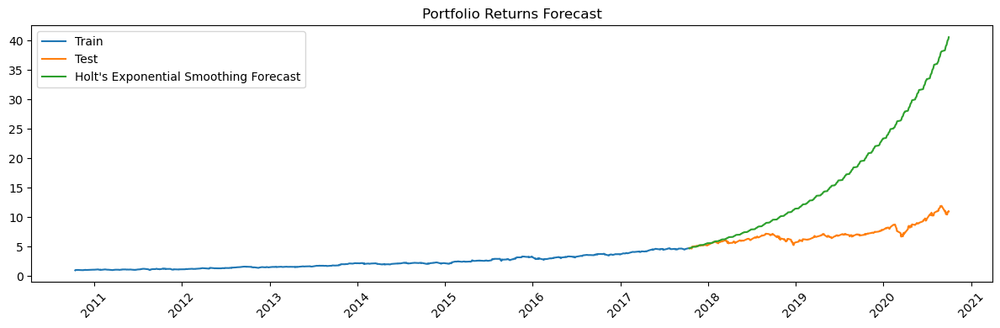

In [175]:
# Define and fit model
model = ExponentialSmoothing(
    np.asarray(train_data1['Portfolio_4']),
    seasonal_periods=252,
    trend='multiplicative',
    seasonal=None
)
model_fit = model.fit(smoothing_level=0.5, smoothing_trend=0.0001, optimized=False)

# Print model parameters
print(model_fit.params, "\n")

# Forecast
y_hat_holt = test_data1.copy()
y_hat_holt['holt_forecast'] = model_fit.forecast(len(test_data1))

# Evaluation
rmse = np.sqrt(mean_squared_error(test_data1['Portfolio_4'], y_hat_holt['holt_forecast'])).round(2)
mape = np.round(np.mean(np.abs(test_data1['Portfolio_4'] - y_hat_holt['holt_forecast']) / test_data1['Portfolio_4']) * 100, 2)

print("RMSE - Portfolio Returns:", rmse)
print("MAPE - Portfolio Returns:", mape, "%\n")

# Plotting
plt.figure(figsize=(12, 4))
plt.plot(train_data1['Portfolio_4'], label='Train')
plt.plot(test_data1['Portfolio_4'], label='Test')
plt.plot(y_hat_holt['holt_forecast'], label="Holt's Exponential Smoothing Forecast")
plt.legend(loc='best')

# Optional: Use index for datetime-aware x-axis
if hasattr(train_data1.index, 'dtype') and 'datetime64' in str(train_data1.index.dtype):
    plt.xticks(rotation=45)
else:
    plt.xticks(np.arange(0, len(train_data1) + len(test_data1), step=300))

plt.title("Portfolio Returns Forecast")
plt.tight_layout()
plt.show()

### Predicting Portfolio returns using Holtz Winters' Method

RMSE - Portfolio Returns: 1.92
MAPE - Portfolio Returns: 19.49 %



C:\AnacondaNew2024\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:903: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


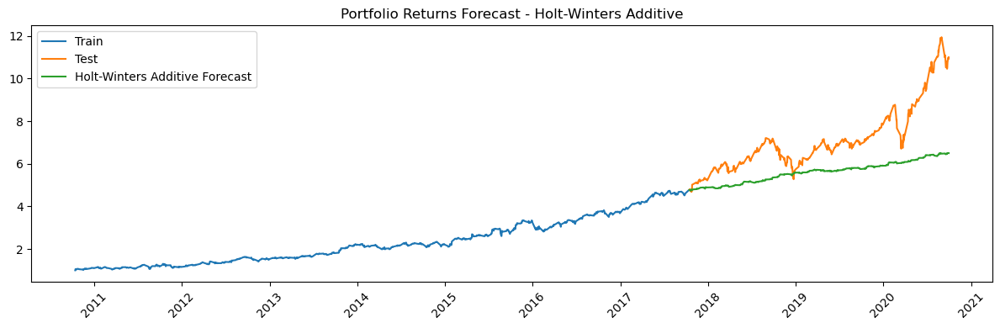

In [176]:
# Create a forecast DataFrame from the test set
y_hat_hwa = test_data1.copy()

# Fit Holt-Winters additive model
model = ExponentialSmoothing(
    np.asarray(train_data1["Portfolio_4"]),
    seasonal_periods=252,
    trend='add',
    seasonal='add'
)
model_fit = model.fit(optimized=True)

# Forecast for the test set length
y_hat_hwa['hw_forecast'] = model_fit.forecast(len(test_data1))

# Evaluation metrics
rmse = np.sqrt(mean_squared_error(test_data1["Portfolio_4"], y_hat_hwa['hw_forecast'])).round(2)
mape = np.round(
    np.mean(
        np.abs(test_data1["Portfolio_4"] - y_hat_hwa['hw_forecast']) / test_data1["Portfolio_4"]
    ) * 100, 2
)

print("RMSE - Portfolio Returns:", rmse)
print("MAPE - Portfolio Returns:", mape, "%\n")

# Plotting
plt.figure(figsize=(12, 4))
plt.plot(train_data1["Portfolio_4"], label='Train')
plt.plot(test_data1["Portfolio_4"], label='Test')
plt.plot(y_hat_hwa['hw_forecast'], label="Holt-Winters Additive Forecast")
plt.legend(loc='best')

# Optional: Use datetime-aware ticks if available
if hasattr(train_data1.index, 'dtype') and 'datetime64' in str(train_data1.index.dtype):
    plt.xticks(rotation=45)
else:
    plt.xticks(np.arange(0, len(train_data1) + len(test_data1), step=300))

plt.title("Portfolio Returns Forecast - Holt-Winters Additive")
plt.tight_layout()
plt.show()

### Predicting Future Stock Prices 2020-24

In [177]:
portfolio_stocks = portfolio_price

In [178]:
import pandas as pd
import datetime

# Step 1: Create new date range
date_range = pd.date_range(start=datetime.date(2020, 10, 1), end=datetime.date(2023, 12, 31), freq='D')

# Step 2: Reindex the original DataFrame to extend it to new date range
res =portfolio_stocks.reindex(date_range)

# Step 3: Fill NaNs (new rows) with the last value from 30-Sep-2020
last_valid = portfolio_stocks.iloc[-1]
res = res.fillna(last_valid)

# Optional: Rename index
res.index.name = 'Date'

# Preview
res.head()

,Apple,Alphabet,Amazon,Johnson&Johnson,Merk&Co,Goldman_Sachs
Date,,,,,,
2020-10-01,115.809998,1469.599976,3148.72998,148.880005,82.949997,200.970001
2020-10-02,115.809998,1469.599976,3148.72998,148.880005,82.949997,200.970001
2020-10-03,115.809998,1469.599976,3148.72998,148.880005,82.949997,200.970001
2020-10-04,115.809998,1469.599976,3148.72998,148.880005,82.949997,200.970001
2020-10-05,115.809998,1469.599976,3148.72998,148.880005,82.949997,200.970001


In [179]:
# Keep only *future* dates in 'res' that are not already in 'portfolio2010_df'
future_only = res[~res.index.isin(portfolio_stocks.index)]

# Then concatenate
portfolio_future = pd.concat([portfolio_stocks, future_only], ignore_index=False)

# Optional: Set index name
portfolio_future.index.name = "Date"

# Preview
portfolio_future.tail()

C:\Users\josev\AppData\Local\Temp\ipykernel_21736\674462992.py:2: FutureWarning: The behavior of 'isin' with dtype=datetime64[ns] and castable values (e.g. strings) is deprecated. In a future version, these will not be considered matching by isin. Explicitly cast to the appropriate dtype before calling isin instead.
  future_only = res[~res.index.isin(portfolio_stocks.index)]


,Apple,Alphabet,Amazon,Johnson&Johnson,Merk&Co,Goldman_Sachs
Date,,,,,,
2023-12-27 00:00:00,115.809998,1469.599976,3148.72998,148.880005,82.949997,200.970001
2023-12-28 00:00:00,115.809998,1469.599976,3148.72998,148.880005,82.949997,200.970001
2023-12-29 00:00:00,115.809998,1469.599976,3148.72998,148.880005,82.949997,200.970001
2023-12-30 00:00:00,115.809998,1469.599976,3148.72998,148.880005,82.949997,200.970001
2023-12-31 00:00:00,115.809998,1469.599976,3148.72998,148.880005,82.949997,200.970001


In [180]:
portfolio_future.index = pd.to_datetime(portfolio_future.index, dayfirst=True)

In [181]:
portfolio_future.tail()

,Apple,Alphabet,Amazon,Johnson&Johnson,Merk&Co,Goldman_Sachs
Date,,,,,,
2023-12-27,115.809998,1469.599976,3148.72998,148.880005,82.949997,200.970001
2023-12-28,115.809998,1469.599976,3148.72998,148.880005,82.949997,200.970001
2023-12-29,115.809998,1469.599976,3148.72998,148.880005,82.949997,200.970001
2023-12-30,115.809998,1469.599976,3148.72998,148.880005,82.949997,200.970001
2023-12-31,115.809998,1469.599976,3148.72998,148.880005,82.949997,200.970001


In [182]:
portfolio_future.index[train_len:]

DatetimeIndex(['2017-10-16', '2017-10-17', '2017-10-18', '2017-10-19',
               '2017-10-20', '2017-10-23', '2017-10-24', '2017-10-25',
               '2017-10-26', '2017-10-27',
               ...
               '2023-12-22', '2023-12-23', '2023-12-24', '2023-12-25',
               '2023-12-26', '2023-12-27', '2023-12-28', '2023-12-29',
               '2023-12-30', '2023-12-31'],
              dtype='datetime64[ns]', name='Date', length=1644, freq=None)

In [256]:
1644-train_len

578

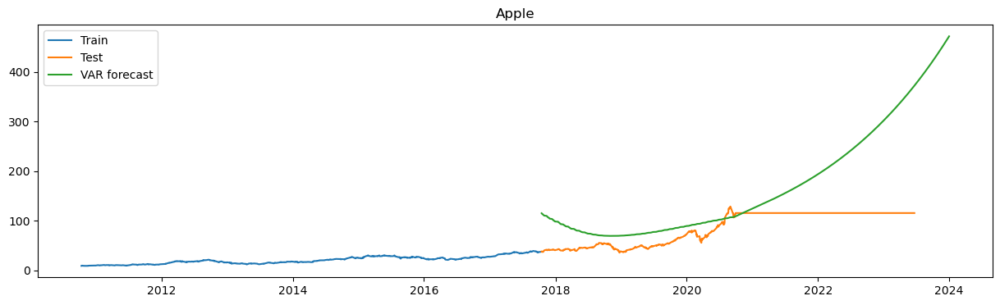

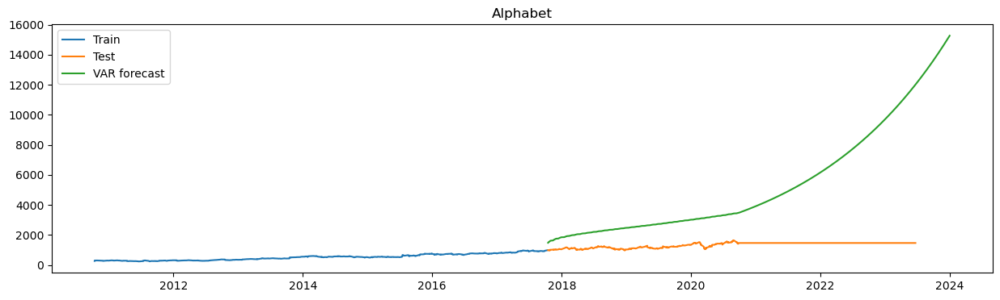

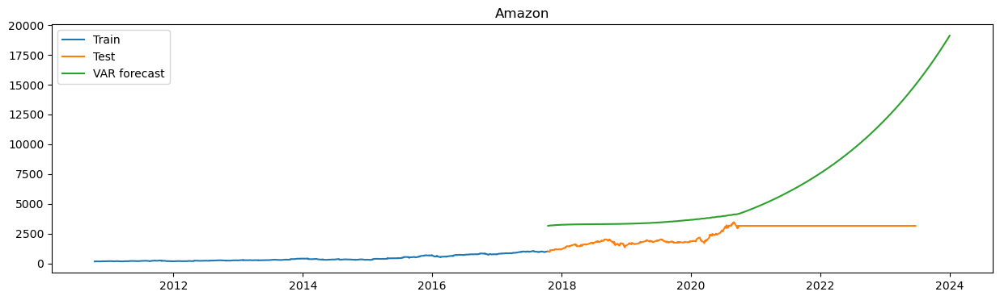

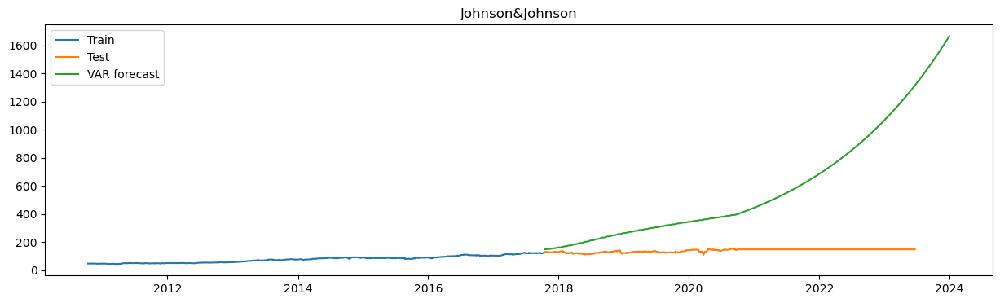

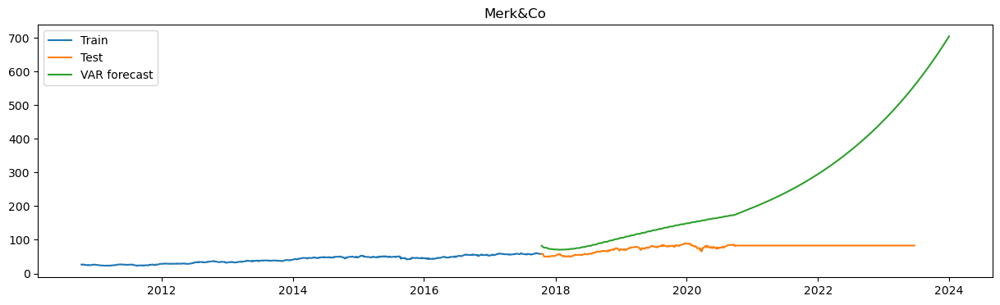

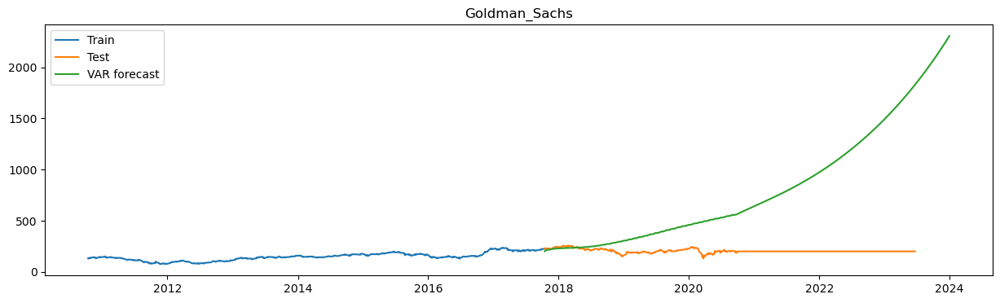

In [183]:
#predicting on the new dataset portfolio_future:

predicted = results.forecast(portfolio_future.values[-lag_order:], 1644)
forecast = pd.DataFrame(predicted, index = portfolio_future.index[train_len:], columns = portfolio_future.columns)

# Printing the train, test and forecasted values
for col in portfolio_future.columns:
    plt.figure(figsize=(15,4))
    plt.plot(portfolio_future[col][:train_len], label='Train')
    plt.plot(portfolio_future[col][train_len:2517], label='Test')
    plt.plot(forecast[col][:], label='VAR forecast')
    plt.legend(loc='best')
    #plt.xticks(np.arange(1, 3704, step=200))
    plt.title(col)
    plt.show()

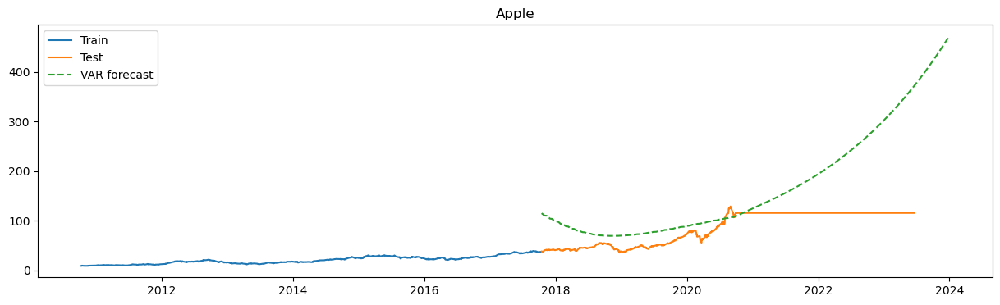

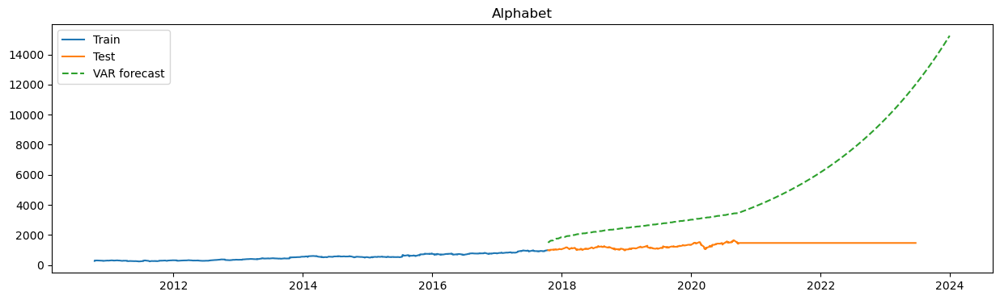

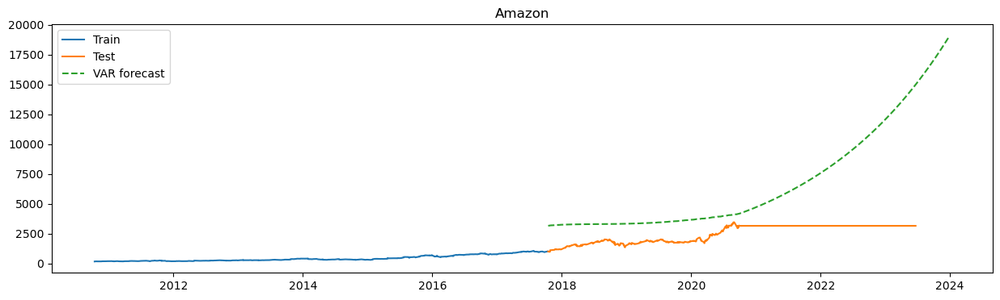

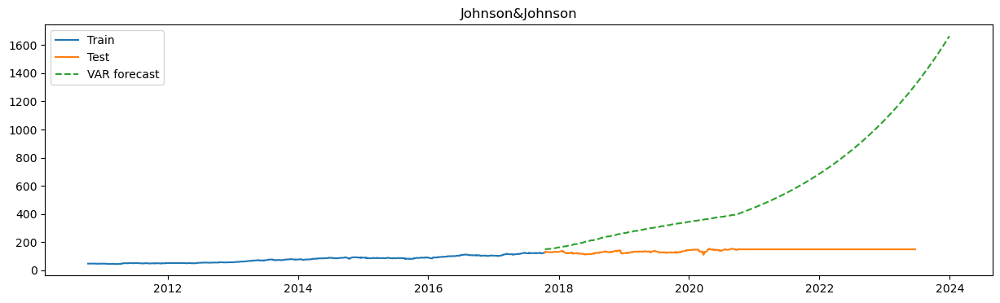

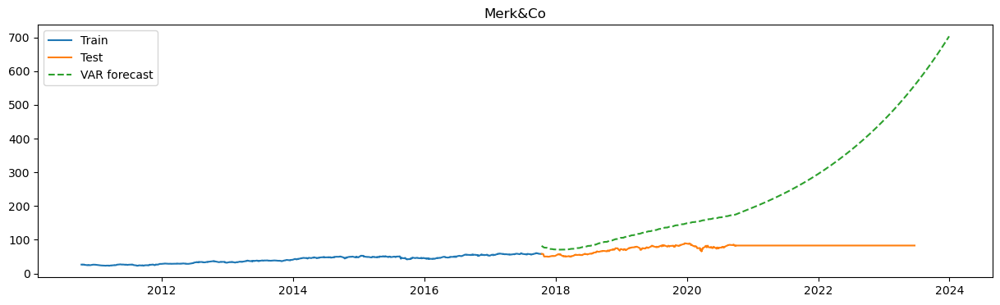

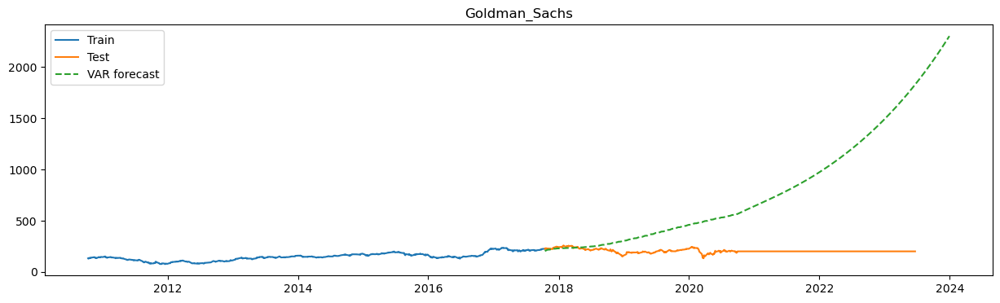

In [184]:
# Forecasting future values
lag_order = results.k_ar
forecast_input = portfolio_future[portfolio.columns].values[-lag_order:]
predicted = results.forecast(forecast_input, steps=1643)

# Ensure index matches forecast steps
forecast_index = portfolio_future.index[train_len:train_len+1643]
forecast = pd.DataFrame(predicted, index=forecast_index, columns=portfolio.columns)

# Plotting
for col in portfolio.columns:
    plt.figure(figsize=(15, 4))
    plt.plot(portfolio_future[col][:train_len], label='Train')
    plt.plot(portfolio_future[col][train_len:2517], label='Test')
    plt.plot(forecast[col], label='VAR forecast', linestyle='--')
    plt.legend(loc='best')
    plt.title(col)
    plt.show()

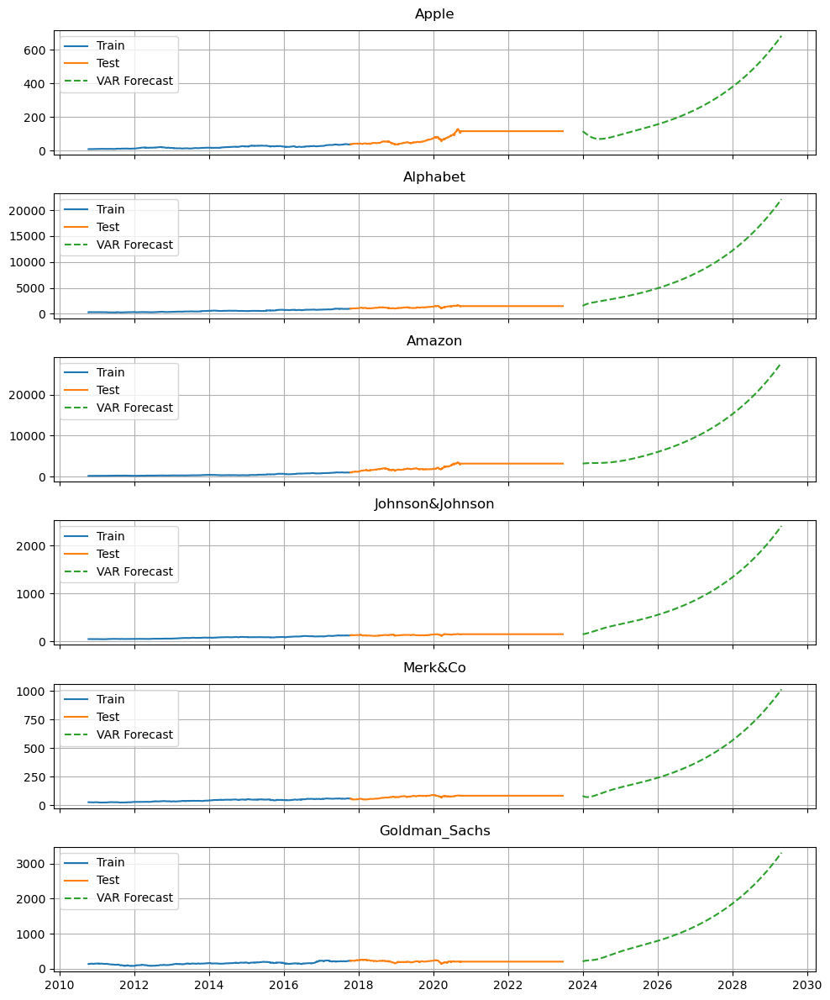

In [259]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=len(portfolio.columns), ncols=1, figsize=(10, 2* len(portfolio.columns)), sharex=True)

for i, col in enumerate(portfolio.columns):
    ax = axes[i]
    
    ax.plot(portfolio_future[col][:train_len], label='Train')
    ax.plot(portfolio_future[col][train_len:2517], label='Test')
    ax.plot(forecast[col], label='VAR Forecast', linestyle='--')

    ax.set_title(col, fontsize=12, pad=10)
    ax.legend(loc='best')
    ax.grid(True)

plt.tight_layout()
plt.show()

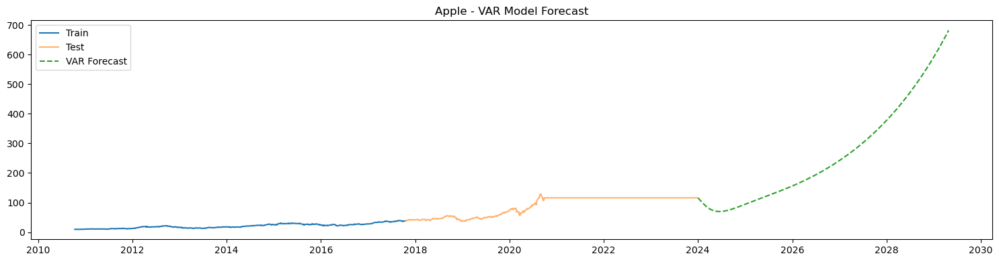

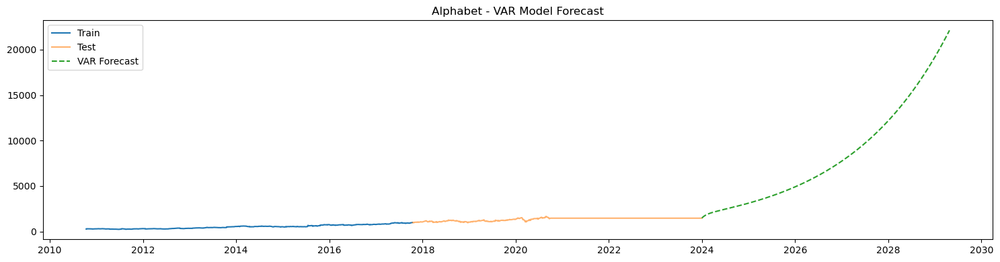

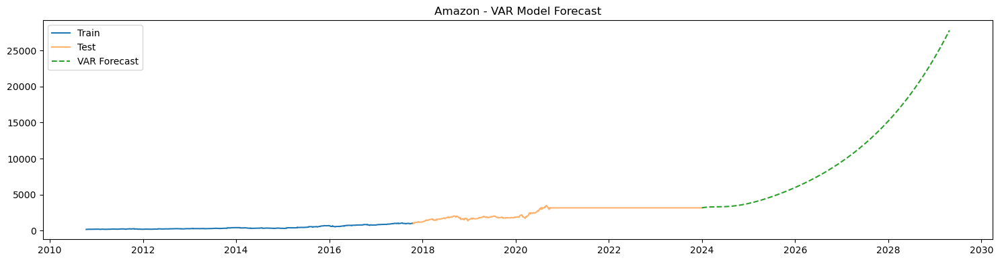

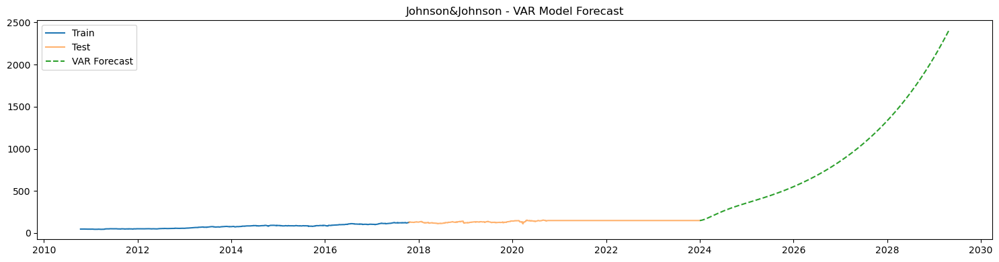

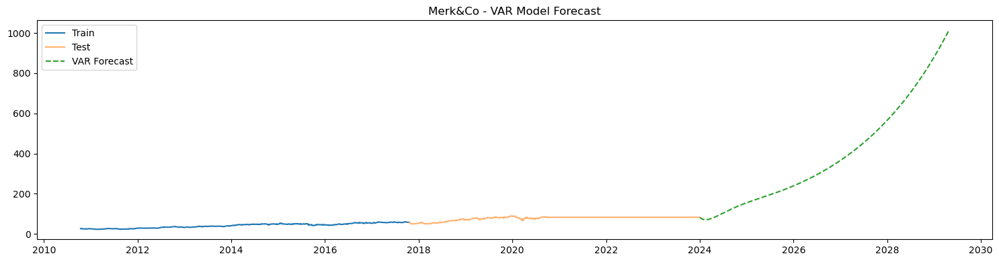

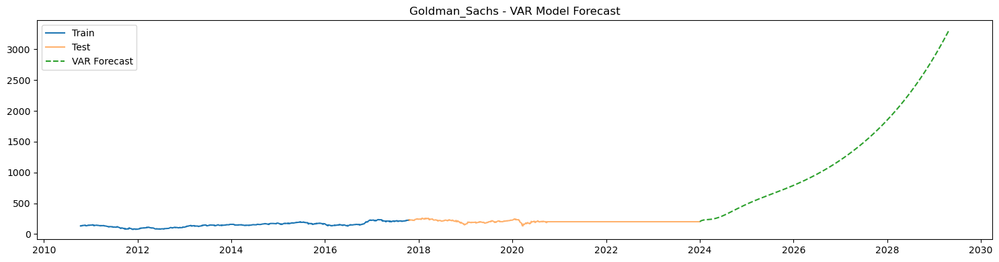

In [185]:
# Get the lag order used in VAR model
lag_order = results.k_ar

# Use only the variables used in training (exclude 'Portfolio_4' if not in the model)
model_vars = results.model.endog_names

# Step 1: Prepare last `lag_order` observations as input
forecast_input = portfolio_future[model_vars].values[-lag_order:]

# Step 2: Forecasting for 1943 days
n_steps = 1943
predicted = results.forecast(y=forecast_input, steps=n_steps)

# Step 3: Build the forecast DataFrame
# Ensure the index has 1943 dates
forecast_index = pd.date_range(start=portfolio_future.index[-1] + pd.Timedelta(days=1), periods=n_steps, freq='D')
forecast = pd.DataFrame(predicted, index=forecast_index, columns=model_vars)

# Step 4: Plotting train, test, and forecast
for col in model_vars:
    plt.figure(figsize=(15, 4))
    
    # Plot training data
    plt.plot(portfolio_future[col][:train_len], label='Train')

    # Plot test data (real values after train_len)
    plt.plot(portfolio_future[col][train_len:], label='Test', alpha=0.6)

    # Plot forecasted data
    plt.plot(forecast[col], label='VAR Forecast', linestyle='--')

    plt.title(f"{col} - VAR Model Forecast")
    plt.legend(loc='best')
    plt.tight_layout()
    plt.show()

In [255]:
returns.shape

(1522, 18)

In [186]:
forecast.describe()

,Apple,Alphabet,Amazon,Johnson&Johnson,Merk&Co,Goldman_Sachs
count,1943.000000,1943.000000,1943.000000,1943.000000,1943.000000,1943.000000
mean,260.531244,8338.740525,10428.054484,914.713474,388.923606,1269.203463
std,170.572716,5584.314841,6975.170675,607.618022,255.462109,840.748769
min,69.673355,1484.304237,3152.136237,148.992939,70.744111,202.650448
25%,114.588535,3622.519773,4333.554119,413.299265,181.479361,591.094420
50%,207.994342,6621.785316,8151.410493,734.515553,315.599848,1039.543369
75%,375.642818,12107.581778,15108.273327,1325.891954,562.244806,1842.042057
max,682.119722,22131.382090,27820.322203,2406.381885,1012.916954,3309.048191


In [187]:
#Taking predicted prices from 1st Oct 2020 onwards for calulcation cumulative return.

forecast_final = forecast.iloc[756:] 
print(forecast_final.head())
print(forecast_final.shape)

                 Apple     Alphabet       Amazon  Johnson&Johnson     Merk&Co  \
2026-01-26  160.743843  5068.453609  6175.127002       567.422670  246.154365   
2026-01-27  160.935970  5074.757929  6183.181607       568.098209  246.434257   
2026-01-28  161.128319  5081.070126  6191.245892       568.774629  246.714520   
2026-01-29  161.320891  5087.390209  6199.319867       569.451931  246.995155   
2026-01-30  161.513686  5093.718189  6207.403544       570.130115  247.276163   

            Goldman_Sachs  
2026-01-26     813.982336  
2026-01-27     814.896370  
2026-01-28     815.811494  
2026-01-29     816.727711  
2026-01-30     817.645024  
(1187, 6)


In [188]:
# Daily return from each stock 
return_stocks = forecast_final.pct_change()
return_stocks.tail(5)

,Apple,Alphabet,Amazon,Johnson&Johnson,Merk&Co,Goldman_Sachs
2029-04-22,0.001233,0.001243,0.001254,0.001232,0.001221,0.001216
2029-04-23,0.001233,0.001243,0.001254,0.001232,0.001221,0.001216
2029-04-24,0.001233,0.001243,0.001254,0.001232,0.001221,0.001217
2029-04-25,0.001233,0.001243,0.001254,0.001232,0.001221,0.001217
2029-04-26,0.001233,0.001243,0.001254,0.001232,0.001221,0.001217


In [189]:
# Average daily return from each stock
daily_returns_mean = return_stocks.mean()
print(daily_returns_mean)

Apple              0.001219
Alphabet           0.001244
Amazon             0.001270
Johnson&Johnson    0.001219
Merk&Co            0.001193
Goldman_Sachs      0.001183
dtype: float64


In [190]:
# Portfolio daily returns
initial_weight = [0.2, 0.2, 0.4, 0.1, 0.05, 0.05]
return_stocks['Portfolio_Daily_Return'] = return_stocks.dot(initial_weight)
return_stocks.tail(5)

,Apple,Alphabet,Amazon,Johnson&Johnson,Merk&Co,Goldman_Sachs,Portfolio_Daily_Return
2029-04-22,0.001233,0.001243,0.001254,0.001232,0.001221,0.001216,0.001242
2029-04-23,0.001233,0.001243,0.001254,0.001232,0.001221,0.001216,0.001242
2029-04-24,0.001233,0.001243,0.001254,0.001232,0.001221,0.001217,0.001242
2029-04-25,0.001233,0.001243,0.001254,0.001232,0.001221,0.001217,0.001242
2029-04-26,0.001233,0.001243,0.001254,0.001232,0.001221,0.001217,0.001242


In [191]:
# Cumulative return from the portfolio
Cumulative_returns_daily = (1+return_stocks).cumprod()
Cumulative_returns_daily.tail(5)

,Apple,Alphabet,Amazon,Johnson&Johnson,Merk&Co,Goldman_Sachs,Portfolio_Daily_Return
2029-04-22,4.222656,4.344854,4.482696,4.220061,4.094931,4.045536,4.333324
2029-04-23,4.227862,4.350255,4.488317,4.225260,4.099931,4.050457,4.338705
2029-04-24,4.233075,4.355662,4.493945,4.230467,4.104937,4.055385,4.344093
2029-04-25,4.238294,4.361075,4.499580,4.235679,4.109948,4.060318,4.349488
2029-04-26,4.243520,4.366496,4.505223,4.240898,4.114966,4.065258,4.354889


Text(0.5, 1.0, 'Cumulative Daily Return')

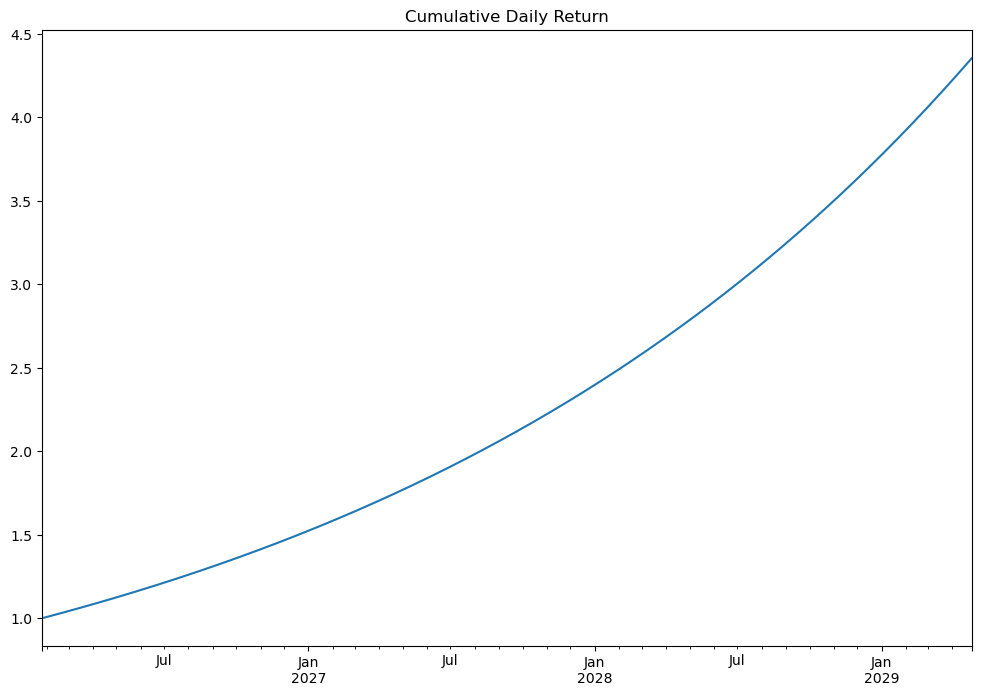

In [192]:
# Plot
Cumulative_returns_daily['Portfolio_Daily_Return'].plot()
plt.title("Cumulative Daily Return")

In [193]:
# Average Cumulative Daily Return by end of 2024.
Cumulative_returns_daily['Portfolio_Daily_Return'].mean()

2.281325918546741

#### Optimization of Stocks

In [196]:
!pip install PyPortfolioOpt

   ---------------------------------------- 0.0/1.1 MB ? eta -:--:--
   --------- ------------------------------ 0.3/1.1 MB ? eta -:--:--
   ------------------ --------------------- 0.5/1.1 MB 1.5 MB/s eta 0:00:01
   ------------------ --------------------- 0.5/1.1 MB 1.5 MB/s eta 0:00:01
   ------------------------------------- -- 1.0/1.1 MB 1.1 MB/s eta 0:00:01
   ---------------------------------------- 1.1/1.1 MB 1.1 MB/s eta 0:00:00
   ---------------------------------------- 0.0/887.3 kB ? eta -:--:--
   ----------- ---------------------------- 262.1/887.3 kB ? eta -:--:--
   ----------------------------------- ---- 786.4/887.3 kB 2.4 MB/s eta 0:00:01
   ---------------------------------------- 887.3/887.3 kB 1.7 MB/s eta 0:00:00
   ---------------------------------------- 0.0/7.4 MB ? eta -:--:--
   - -------------------------------------- 0.3/7.4 MB ? eta -:--:--
   ---- ----------------------------------- 0.8/7.4 MB 2.6 MB/s eta 0:00:03
   -------- ----------------------------

In [212]:
stock_price_portfolio = prices[portfolio.columns]

In [218]:
stock_price_portfolio.head()

,Apple,Alphabet,Amazon,Johnson&Johnson,Merk&Co,Goldman_Sachs
Date,,,,,,
13-10-2010,9.262955,270.635590,155.169998,47.332462,26.450895,133.199677
14-10-2010,9.329926,269.455017,155.529999,47.451584,26.443783,130.496597
15-10-2010,9.713540,299.602020,164.639999,47.325027,26.301414,129.721832
18-10-2010,9.814152,307.701660,163.559998,47.540920,26.500723,132.312943
19-10-2010,9.551516,302.780121,158.669998,47.116585,25.995331,134.912766


In [197]:
from pypfopt.efficient_frontier import EfficientFrontier
from pypfopt import risk_models
from pypfopt import expected_returns

In [213]:
mu = expected_returns.mean_historical_return(stock_price_portfolio)
S = risk_models.sample_cov(stock_price_portfolio)

In [217]:
# Optimize for max sharpe ratio

ef=EfficientFrontier(mu, S)
weights = ef.max_sharpe()
cleaned_weights = ef.clean_weights()
print(cleaned_weights)
ef.portfolio_performance(verbose = True)

OrderedDict({'Apple': 0.33752, 'Alphabet': 0.0, 'Amazon': 0.37828, 'Johnson&Johnson': 0.1553, 'Merk&Co': 0.1289, 'Goldman_Sachs': 0.0})
Expected annual return: 47.9%
Annual volatility: 25.4%
Sharpe Ratio: 1.89


(0.47896649400135216, 0.2538567724094353, 1.8867587791939877)

In [220]:
!pip install cvxopt

   ---------------------------------------- 0.0/12.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/12.8 MB ? eta -:--:--
   ---- ----------------------------------- 1.3/12.8 MB 6.1 MB/s eta 0:00:02
   --------- ------------------------------ 3.1/12.8 MB 6.8 MB/s eta 0:00:02
   ------------- -------------------------- 4.2/12.8 MB 6.3 MB/s eta 0:00:02
   ----------------- ---------------------- 5.5/12.8 MB 6.3 MB/s eta 0:00:02
   ---------------------- ----------------- 7.3/12.8 MB 6.7 MB/s eta 0:00:01
   --------------------------- ------------ 8.9/12.8 MB 6.8 MB/s eta 0:00:01
   -------------------------------- ------- 10.5/12.8 MB 7.0 MB/s eta 0:00:01
   -------------------------------------- - 12.3/12.8 MB 7.1 MB/s eta 0:00:01
   ---------------------------------------  12.6/12.8 MB 7.1 MB/s eta 0:00:01
   ---------------------------------------  12.6/12.8 MB 7.1 MB/s eta 0:00:01
   ---------------------------------------  12.6/12.8 MB 7.1 MB/s eta 0:00:01
   -----

### Portfolio Allocation of funds worth 1 Lakh

In [221]:
# Get the discrete allocation of each share per stock

from pypfopt.discrete_allocation import DiscreteAllocation, get_latest_prices
from cvxopt import solvers, matrix

latest_prices = get_latest_prices(stock_price_portfolio)
weights = cleaned_weights
da=DiscreteAllocation(weights, latest_prices, total_portfolio_value = 100000) #1Lac is the overall portfolio allocation

allocation, leftover = da.lp_portfolio()
print('Discrete allocation:', allocation)
print('Funds remaining: ${:.2f}'.format(leftover))

Discrete allocation: {'Apple': 292, 'Amazon': 12, 'Johnson&Johnson': 104, 'Merk&Co': 155}
Funds remaining: $57.95


### Download the final data frame 'price_vol_df

In [268]:

# If not already imported
import pandas as pd

# Save to Excel file in your current working directory
price_vol_df.to_excel("price_vol_df.xlsx", index=True)

In [262]:
!pip install openpyxl

In [269]:
from IPython.display import FileLink
# Display clickable download link
FileLink("price_vol_df.xlsx")

C:\Users\josev\Downloads\capstone project\BA_Dataset\price_vol_df.xlsx

#### Finalized Portfolio

In [ ]:
- 'Apple': 33.752%, 
- 'Alphabet': 0.0, 
- 'Amazon': 37.828, 
- 'Johnson&Johnson': 0.1553, 
- 'Merk&Co': 0.1289, 
- 'Goldman_Sachs': 0.0

                            **Thank You By Josemon Joy**